In [1]:
import numpy as np
import pandas as pd

# Plotting Packages
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as mtick

from sklearn import linear_model
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import seaborn as sns
from sklearn import preprocessing

import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split

import scipy.stats as stats
from scipy.stats import shapiro

import warnings

In [352]:
# data = pd.read_csv('data/indicators_citations_bulk_df.csv')
# data = pd.read_csv('data/dist_calc_citations_bulk_df.csv')
# data = pd.read_csv('data/pc_change_citations_bulk_df.csv')
# income = pd.read_csv('data/wdi_incomelevels.csv')

# #all zeros for citations were dropped in building the data frame
# data['log_2_Years'] = np.log(data['2 years window'])

# #merge with income
# income['Country'] = income['Country'].str.lower()
# income = income.rename(columns={'Country': 'Country Name'})
# data = pd.merge(data, income, on=['Country Name'], how='left') 
# data.head()

### Functions for regressions with plots + assumption check

In [353]:
def unique(list1):

    unique_list = []
 
    for x in list1:
        if x not in unique_list:
            unique_list.append(x)
    return unique_list

In [354]:
def unique_list(list1, list2):

    unique_list = []
 
    for x in list1:
        if x not in list2:
            unique_list.append(x)
    return unique_list

In [355]:
def linear_regression_plot (x, y, x_name, y_name, data_name, xlabel, ylabel):

    x2 = sm.add_constant(x)
    X_train, X_test, y_train, y_test = train_test_split(x2, y, test_size = 0.3, random_state = 0)

    # Fit the simple linear regression
    sm_model = sm.OLS(y_train, X_train, missing='drop')
    results = sm_model.fit()

    # Make predictions using the linear regression
    y_pred_x2 = results.predict(x2)
    y_pred = results.predict(X_test)
    
    #extract p-value for specific predictor variable name
    p_val_x = results.pvalues.loc[x_name]
    
    not_sig_ind = []
    sig_ind = []
    resids_not_normal = []
    
#     yes = 'yes'
#     no = 'NA'
    
#     models_sig = pd.DataFrame(columns = ['predictor', 'indicator','significant','not_significant'])
    if p_val_x < 0.05:
        sig_ind = y_name
        yes = 'yes'
        no = 'NA'
        
#         new_row = {'predictor': x_name, 'indicator': y_name, 'significant': yes, 'not_significant' : no}
#         models_sig = models_sig.append(new_row, ignore_index = True)
        
        print(y_name+' vs '+x_name)
        # Plot 
        xtest = np.array(X_test.iloc[:,-1:])
        plt.figure(figsize=(15, 8), dpi=80)
        p1 = sns.scatterplot(x = x_name, y = y_name, data = data_name, hue='Economy Level', s=100)
        p1.legend(bbox_to_anchor=(1.01,1.0), loc='upper left', borderaxespad=0)#,borderaxespad = 0., ncol = 1)
        plt.plot(x, y_pred_x2, color='blue', linewidth=3)
        plt.plot(xtest, y_pred, color='red', linewidth=5)
        plt.xlabel(xlabel, fontsize=13)
        plt.ylabel(ylabel, fontsize=13)
        plt.title(ylabel +' vs. '+xlabel, fontsize=15)

        plt.show()
        
        
        print(results.summary())
        print('==============================================')
        
        
        #checking assumptions
        #plot residuals
        print()
        print("Residuals vs Fitted Values-- looking for heteroskedascity")
        resids = results.resid
#         y_pred = results.predict(X_train)
        fitted_vals = results.fittedvalues
        plt.scatter(fitted_vals, resids, color='black', alpha = 0.25)
#         plt.scatter(y_pred, resids,  color='black', alpha = 0.25)
        plt.xlabel('Fitted values')
        plt.ylabel('Residuals')
        plt.title('Residuals vs Fitted Values')
        plt.show()
        
        #qq plot for normality of residuals
        print('Residuals-- checking normality')
        sm.qqplot(resids, line='s') #get p values
        plt.show()
        
        #shirpo-wilks test for residuals normality
#         print("If p-value < 0.05, residuals are not normal")
#         print(shapiro(resids)[1])
        
        if shapiro(resids)[1] < 0.05:
            print('Residuals are not normal')
            
            resids_not_normal = y_name
        
        print('=========================================================================================')
        
#         #histograms
#         #hist for x
#         print()
#         print('Histogram for '+x_name)
#         plt.hist(x)
#         plt.xlabel(xlabel, fontsize=13)
#         plt.title('Histogram for '+xlabel, fontsize=15)
#         plt.show()
        
# #         #hist for y
# #         print()
# #         print('Histogram for '+y_name)
# #         plt.hist(y)
# #         plt.xlabel(ylabel, fontsize=13)
# #         plt.title('Histogram for '+ylabel, fontsize=15)
# #         plt.show()
    
    else:
        not_sig_ind = y_name
    
    print('=========================================================================================')
    
    return sig_ind, not_sig_ind, resids_not_normal

https://stackoverflow.com/questions/55246295/patsyerror-error-evaluating-factor-nameerror
https://www.statsmodels.org/dev/examples/notebooks/generated/quantile_regression.html
https://www.statsmodels.org/dev/generated/statsmodels.regression.quantile_regression.QuantRegResults.html

#geeks for geeks quantile regression

http://inversionlabs.com/2016/02/07/using-quantile-regression.html

In [356]:
def confidence_interval(X, y, y_pred):
    # Covariance of coefficient estimates
    mse = np.sum(np.square(y_pred - y)) / y.size
#     print(mse.shape)
    cov = mse * np.linalg.inv(X.T @ X)
    # Alternatively the covariance could be found using StatsModels:
#     cov = model.cov_params()
#     print(cov.shape)

    # Calculate variance of f(x)
    var_f = np.diagonal((X @ cov) @ X.T)

    # Derive standard error of f(x) from variance
    se       = np.sqrt(abs(var_f))
    conf_int = 2*se

    return conf_int

In [357]:
def quantile_regression_plot (x, y, x_name, y_name, data_name, xlabel, ylabel, quantile):

    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)
    
#     df = data_name[[x_name,y_name]]
    df = pd.concat([X_train,y_train],axis='columns')

    # Fit the quantile regression
    equation = y_name+' ~ '+x_name
    mod = smf.quantreg(equation, df)
    results = mod.fit(q=quantile)
    
    not_sig_ind = []
    sig_ind = []
    resids_not_normal = []
    
    if results.pvalues[1] < 0.05:
        sig_ind = y_name
        yes = 'yes'
        no = 'NA'

        print(y_name+' vs '+x_name)
        # Plot 
        # define figure and axis
#         fig, ax = plt.subplots(figsize=(8, 6))

        # get y values
        y_line = lambda a, b: a + x
        y = y_line(results.params['Intercept'],
                   results.params[x_name])
        
        #get prediction
        y_pred_test = results.predict(pd.DataFrame(X_test))
        y_pred_train = results.predict(pd.DataFrame(X_train))
        
        y_pred = results.predict(pd.DataFrame(x))
        
#         x_ci = np.array(x).reshape(-1, 1)
#         conf_int = confidence_interval(x_ci, y, y_pred)
        
#         X_train_ci = np.array(X_train).reshape(-1, 1)
#         conf_int_train = confidence_interval(X_train_ci, y_train, y_pred_train)
        
#         X_test_ci = np.array(X_test).reshape(-1, 1)
#         conf_int_test = confidence_interval(X_test_ci, y_test, y_pred_test)
        
        

        # Plotting data points with the help
        # pf quantile regression equation
#         ax.plot(x, y, color='black')
#         ax.scatter(x, y, alpha=.3)
#         ax.set_xlabel(x_name, fontsize=20)
#         ax.set_ylabel(y_name, fontsize=20)
#         xtest = np.array(X_test.iloc[:,-1:])

        plt.figure(figsize=(15, 8), dpi=80)
        hue_order = ['High-Income', 'Upper-Middle Income', 'Lower-Middle Income', 'Low-Income']
        p1 = sns.scatterplot(x = x_name, y = y_name, data = data_name, hue= 'Economy Level', hue_order=hue_order,s=100, alpha=0.5)
        p1.legend(bbox_to_anchor=(1.01,1.0), loc='upper left', borderaxespad=0)#,borderaxespad = 0., ncol = 1)
#         plt.plot(x, y, color='m', linewidth=3)
#         plt.plot(X_train, y_pred_train, color='blue', linewidth=3)
        plt.plot(X_test, y_pred_test, color='m', linewidth=3)
#         plt.fill_between(X_train, y_pred_train-conf_int_train, y_pred_train+conf_int_train, facecolor = 'm', alpha = 0.5)
#         plt.fill_between(X_test, y_pred_test-conf_int_test, y_pred_test+conf_int_test, facecolor = 'm', alpha = 0.5)
#         plt.fill_between(x, y_pred-conf_int, y_pred+conf_int, facecolor = 'm', alpha = 0.5)
        plt.xlabel(xlabel, fontsize=13)
        plt.ylabel(ylabel, fontsize=13)
        plt.title(ylabel +' vs. '+xlabel, fontsize=15)

        plt.show()

        
        
        print(results.summary())
        print('==============================================')
        
        
        #checking assumptions
        #plot residuals
        print()
        print("Residuals vs Fitted Values-- looking for heteroskedascity")
        resids = results.resid
# #         y_pred = results.predict(X_train)
        fitted_vals = results.fittedvalues
        plt.scatter(fitted_vals, resids, color='black', alpha = 0.25)
# #         plt.scatter(y_pred, resids,  color='black', alpha = 0.25)
        plt.xlabel('Fitted values')
        plt.ylabel('Residuals')
        plt.title('Residuals vs Fitted Values')
        plt.show()
        
# #         #qq plot for normality of residuals
#         print('Residuals-- checking normality')
#         sm.qqplot(resids, line='s') #get p values
#         plt.show()
        
        
#         if shapiro(resids)[1] < 0.05:
#             print('Residuals are not normal')
            
#             resids_not_normal = y_name
        
        print('=========================================================================================')
    
    else:
        not_sig_ind = y_name
    
    print('=========================================================================================')
    
    return sig_ind, not_sig_ind, resids_not_normal

In [358]:
def QR_cv_with_CI(x, y, x_name, y_name, data_name, xlabel, ylabel, quantile):

    df = data_name[[x_name,y_name]]
    mses = pd.DataFrame()
    fold = 0

    kf = KFold(n_splits=5, shuffle=True, random_state=0) 
    for train_index, val_index in kf.split(df):
        # Separate each array into respective variables
        df_train = np.asarray(df)[train_index]
        df_train = pd.DataFrame(df_train, columns = df.columns)
        df_val = np.asarray(df)[val_index]
        df_val = pd.DataFrame(df_val, columns = df.columns)
        
        X_train = df_train[[x_name]]
        X_val = df_val[[x_name]]
    
        # Calculate the MSE for each fold
        MSE_array = []
        
        # Fit the quantile regression
        equation = y_name+' ~ '+x_name
        mod = smf.quantreg(equation, df_train)
        results = mod.fit(q=quantile)
        y_pred = results.predict(pd.DataFrame(X_val))

#         # Fit linear regression model
#         model = sm.OLS(df_train.solar_install, X_train).fit(disp=0)
#         y_pred = model.predict(X_val)

            
#         MSE = mean_squared_error(df_val[y_name], y_pred) #y_true, y_pred on validation set
        y_true = df_val[y_name]
        MSE = np.square(np.subtract(y_true,y_pred)).mean()
        MSE_array.append(MSE)

        mses[fold] = MSE_array
        fold = fold+1

    # Average the MSE across folds
    mses['mses_ave'] = mses.mean(axis=1)

    # Determine the minimum average MSE and the polynomial order where it occurs
    MSE_ave_min = min(mses.mses_ave)
    
    #confidence interval

    df = df.dropna(subset=[y_name])
    X = df[[x_name]]
    y = df[[y_name]]
#     print(y.shape)
#     print(X.shape)
    equation = y_name+' ~ '+x_name
    mod = smf.quantreg(equation, df)
    results = mod.fit(q=quantile)
    
    not_sig_ind = []
    sig_ind = []
    resids_not_normal = []
    
    if results.pvalues[1] < 0.05:
        
        sig_ind = y_name
        yes = 'yes'
        no = 'NA'
        
        y_pred_all = results.predict(pd.DataFrame(X))

        X_reshape = np.array(X).reshape(-1, 1)
        y_reshape = np.array(y).reshape(-1, 1)
        y_pred_all_reshape = np.array(y_pred_all).reshape(-1, 1)

        conf_int = confidence_interval(X_reshape, y_reshape, y_pred_all_reshape)
        
        print(y_name+' vs '+x_name)

        plt.figure(figsize=(15, 8), dpi=80)
        hue_order = ['High-Income', 'Upper-Middle Income', 'Lower-Middle Income', 'Low-Income']
        p1 = sns.scatterplot(x = x_name, y = y_name, data = data_name, hue= 'Economy Level', hue_order=hue_order,s=100, alpha=0.5)
        
#         p1 = sns.scatterplot(x = x_name, y = y_name, data = data_name, hue= 'Economy Level', s=100, alpha=0.5)
        p1.legend(bbox_to_anchor=(1.01,1.0), loc='upper left', borderaxespad=0)

        data_name = data_name.dropna(subset=[y_name])
        plt.plot(data_name[x_name], y_pred_all, 'm')
        plt.fill_between(data_name[x_name], y_pred_all-conf_int, y_pred_all+conf_int, facecolor = 'm', alpha = 0.5)
        plt.xlabel(xlabel, fontsize=13)
        plt.ylabel(ylabel, fontsize=13)
        plt.title(ylabel +' vs. '+xlabel, fontsize=15)
        plt.show()
        
        print('Average validation MSE over 5 folds: ',MSE_ave_min)
        print()
        
        print(results.summary())
        print('======================================================================================')
        print()


    #     plt.figure(figsize=(15, 8), dpi=80)
    #     p1 = sns.scatterplot(x = x_name, y = y_name, data = data_name, hue= 'Economy Level', s=100, alpha=0.5)
    #     p1.legend(bbox_to_anchor=(1.01,1.0), loc='upper left', borderaxespad=0)#,borderaxespad = 0., ncol = 1)
    # #         plt.plot(x, y, color='m', linewidth=3)
    # #         plt.plot(X_train, y_pred_train, color='blue', linewidth=3)
    #     plt.plot(X_test, y_pred_test, color='m', linewidth=3)
    # #         plt.fill_between(X_train, y_pred_train-conf_int_train, y_pred_train+conf_int_train, facecolor = 'm', alpha = 0.5)
    # #         plt.fill_between(X_test, y_pred_test-conf_int_test, y_pred_test+conf_int_test, facecolor = 'm', alpha = 0.5)
    # #         plt.fill_between(x, y_pred-conf_int, y_pred+conf_int, facecolor = 'm', alpha = 0.5)
    #     plt.xlabel(xlabel, fontsize=13)
    #     plt.ylabel(ylabel, fontsize=13)
    #     plt.title(ylabel +' vs. '+xlabel, fontsize=15)

    #     plt.show()
    else:
        not_sig_ind = y_name
    
    print('=========================================================================================')
    print()

    return sig_ind, not_sig_ind

# Regressions for with % change of indicators

- Only significant regressions and assumptions are printed 

In [2]:
# data = pd.read_csv('data/indicators_citations_bulk_df.csv')
# data = pd.read_csv('data/dist_calc_citations_bulk_df.csv') 
data = pd.read_csv('data/pc_change_citations_bulk_df.csv')
# data = pd.read_csv('data/log_diff_citations_bulk_df.csv')
income = pd.read_csv('data/wdi_incomelevels.csv')

#all zeros for citations were dropped in building the data frame
data['log_2_Years'] = np.log(data['2 years window'])

#merge with income
income['Country'] = income['Country'].str.lower()
income = income.rename(columns={'Country': 'Country Name'})
data = pd.merge(data, income, on=['Country Name'], how='left') 

#change column names to prevent patsy error issue with quantile regression
data = data.rename(columns={'energy_use(kg/capita)': 'energy_use_kg_capita'})
data = data.rename(columns={'energy_use(kg/kGDP)': 'energy_use_kg_kgdp'})
data = data.rename(columns={'GDP/Energy(constrant_2017)': 'gdp_over_energy_const_2017'}) 
data = data.rename(columns={'GDP/Energy': 'gdp_over_energy'})
data = data.rename(columns={'ar index bulk': 'ar_index_bulk'})
data.head(4)

,Unnamed: 0,Year,2 years window,ar_index_bulk,Country Name,cooking,rural_cooking,urban_cooking,electricy,rural_electricy,...,energy_intensity,energy_use_kg_capita,energy_use_kg_kgdp,fossil_fual_comsumption,gdp_over_energy_const_2017,gdp_over_energy,renewable_output,renewable_comsumption,log_2_Years,Economy Level
0,0,1991,6.0,0.875595,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.791759,NaN
1,1,1992,2.0,0.454859,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.693147,NaN
2,2,1993,4.0,0.823754,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.386294,NaN
3,3,1994,6.0,1.122167,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.791759,NaN


## Simple Linear Regressions

### - log_2_years

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


cooking vs log_2_Years


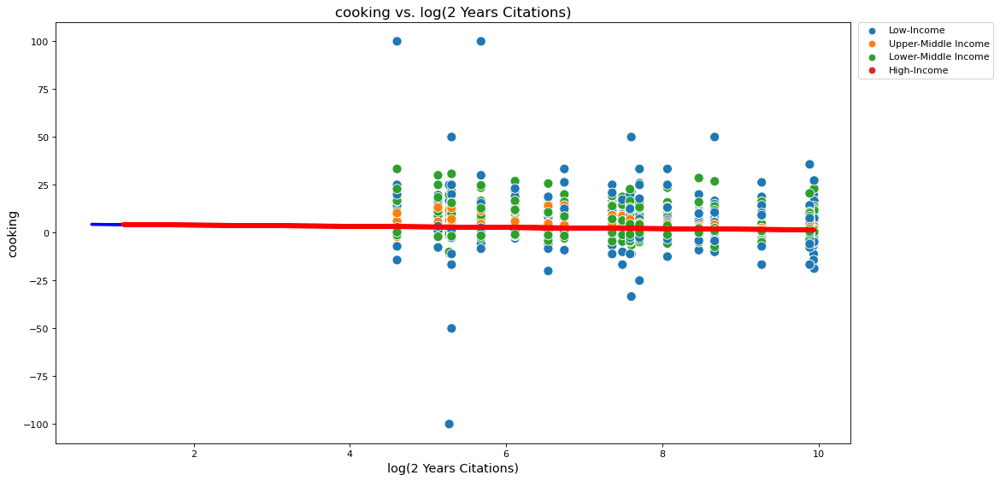

                            OLS Regression Results                            
Dep. Variable:                cooking   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     17.85
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           2.47e-05
Time:                        20:36:57   Log-Likelihood:                -8594.6
No. Observations:                2651   AIC:                         1.719e+04
Df Residuals:                    2649   BIC:                         1.721e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           4.6063      0.553      8.327      

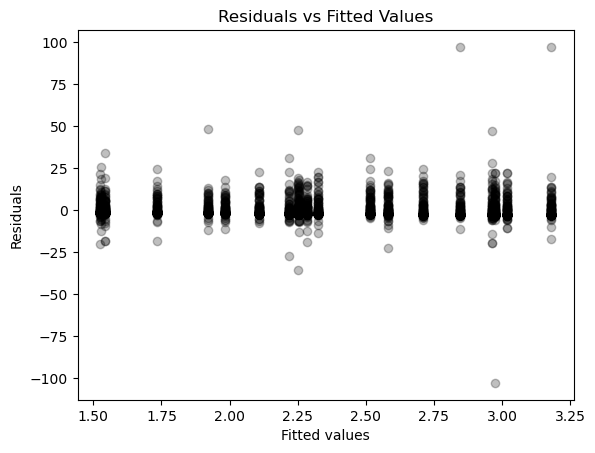

Residuals-- checking normality


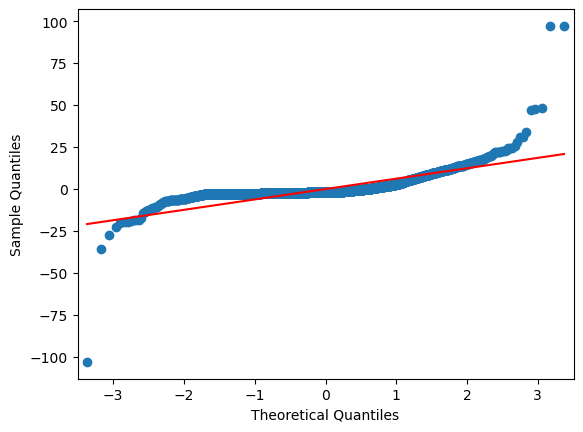

Residuals are not normal
rural_cooking vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


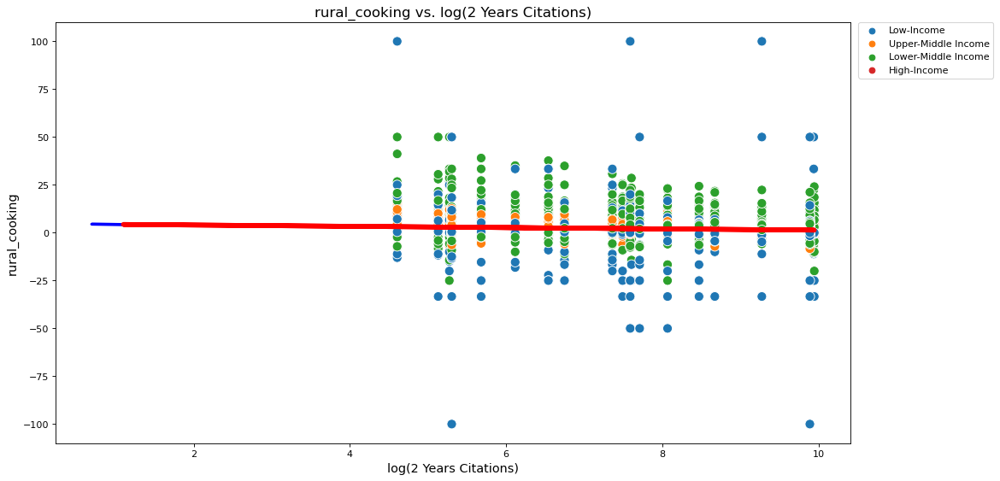

                            OLS Regression Results                            
Dep. Variable:          rural_cooking   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     11.74
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           0.000620
Time:                        20:36:57   Log-Likelihood:                -9266.9
No. Observations:                2629   AIC:                         1.854e+04
Df Residuals:                    2627   BIC:                         1.855e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           4.6870      0.737      6.360      

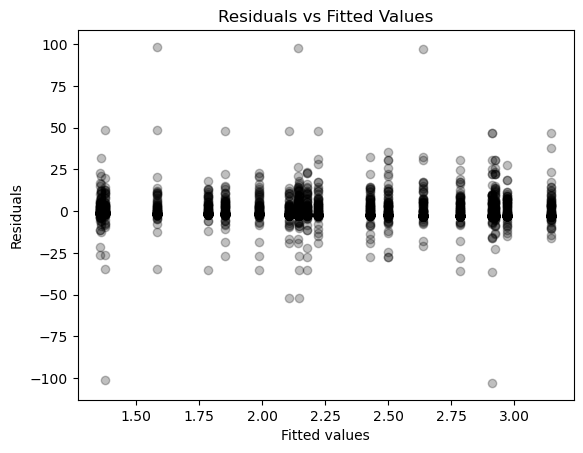

Residuals-- checking normality


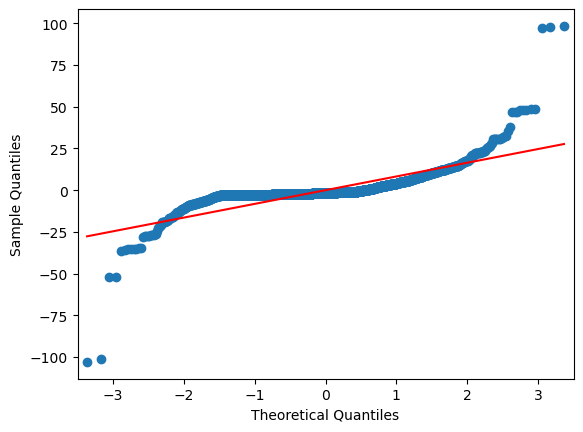

Residuals are not normal
urban_cooking vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


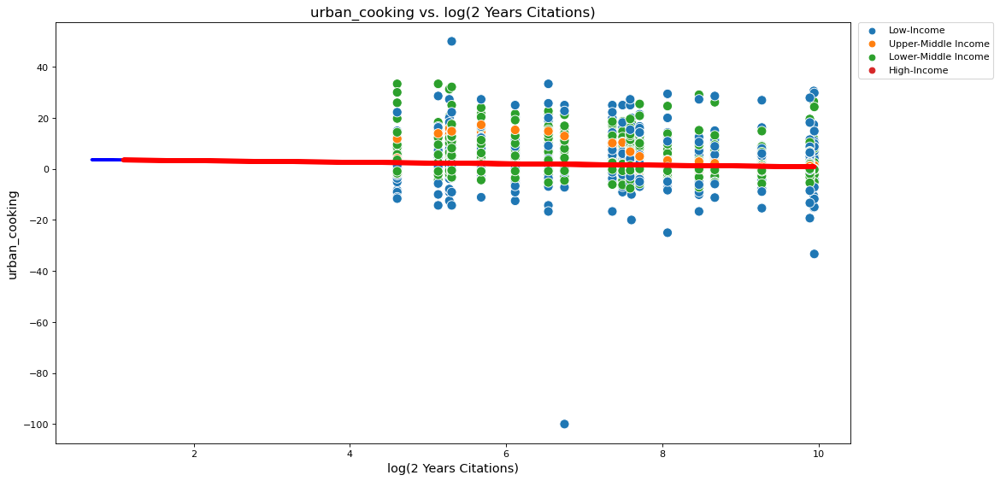

                            OLS Regression Results                            
Dep. Variable:          urban_cooking   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     21.83
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           3.13e-06
Time:                        20:36:58   Log-Likelihood:                -8197.7
No. Observations:                2644   AIC:                         1.640e+04
Df Residuals:                    2642   BIC:                         1.641e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           3.8168      0.481      7.936      

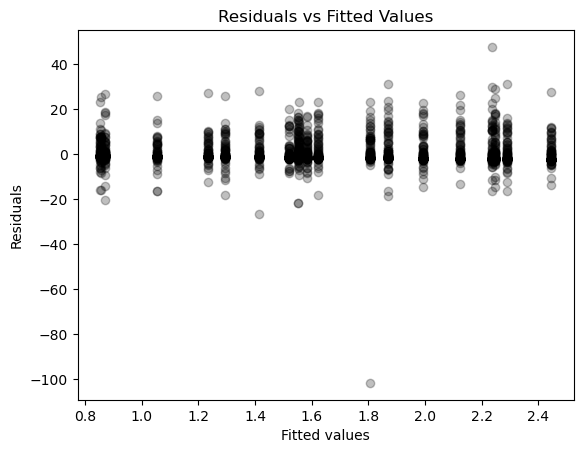

Residuals-- checking normality


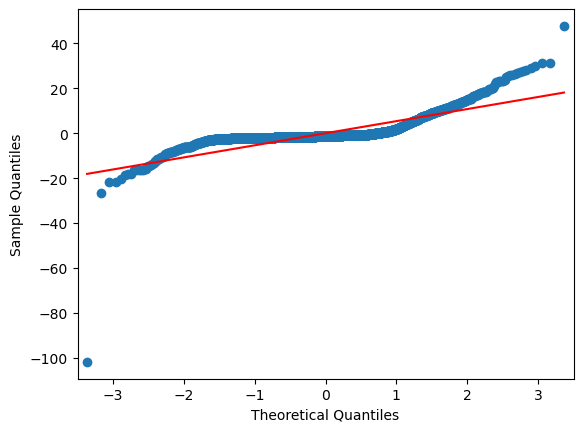

Residuals are not normal
electric_consumption vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

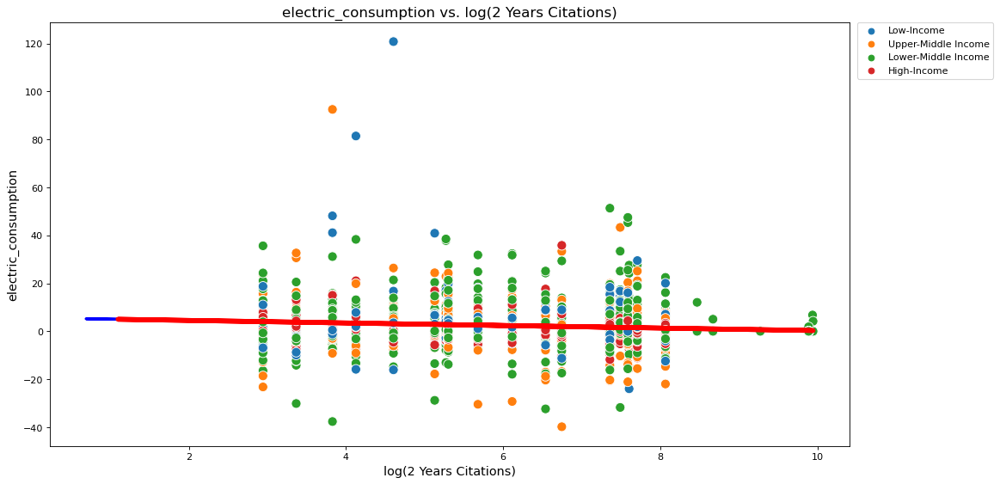

                             OLS Regression Results                             
Dep. Variable:     electric_consumption   R-squared:                       0.026
Model:                              OLS   Adj. R-squared:                  0.026
Method:                   Least Squares   F-statistic:                     62.77
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):           3.55e-15
Time:                          20:36:59   Log-Likelihood:                -7831.6
No. Observations:                  2358   AIC:                         1.567e+04
Df Residuals:                      2356   BIC:                         1.568e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           5.6031      0.

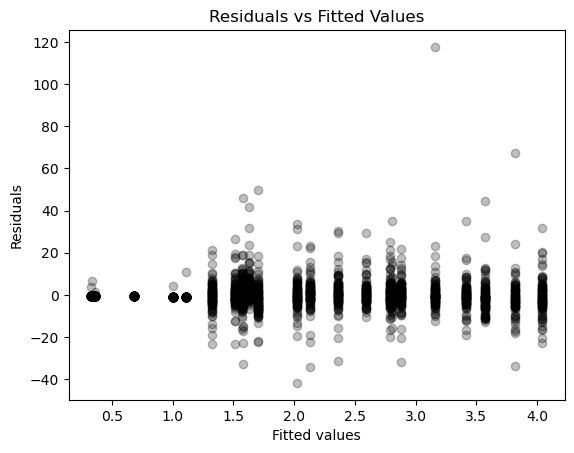

Residuals-- checking normality


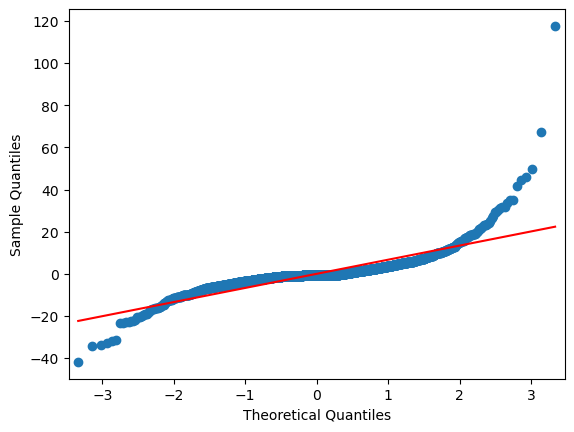

Residuals are not normal
energy_use_kg_capita vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

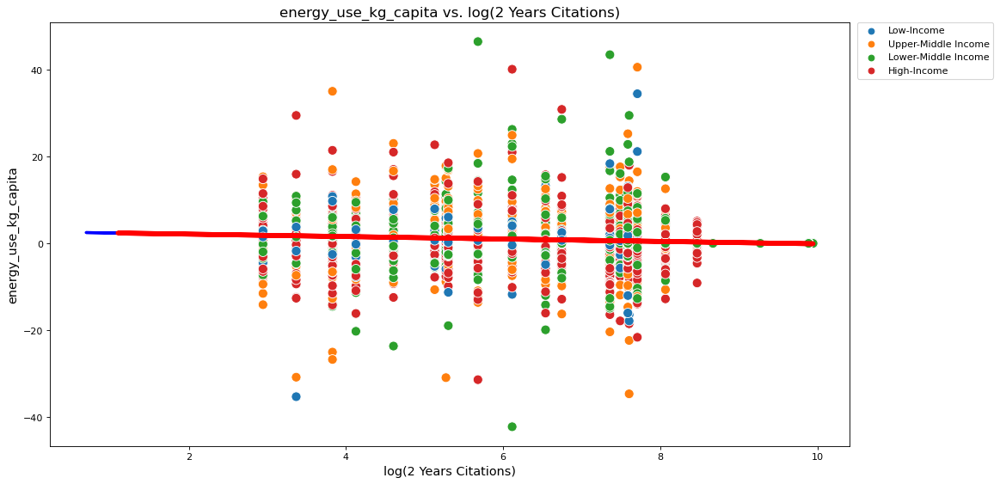

                             OLS Regression Results                             
Dep. Variable:     energy_use_kg_capita   R-squared:                       0.010
Model:                              OLS   Adj. R-squared:                  0.010
Method:                   Least Squares   F-statistic:                     27.59
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):           1.62e-07
Time:                          20:37:00   Log-Likelihood:                -8445.6
No. Observations:                  2692   AIC:                         1.690e+04
Df Residuals:                      2690   BIC:                         1.691e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.6843      0.

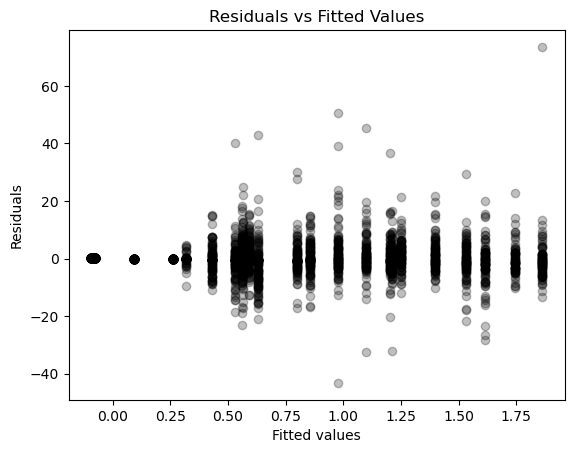

Residuals-- checking normality


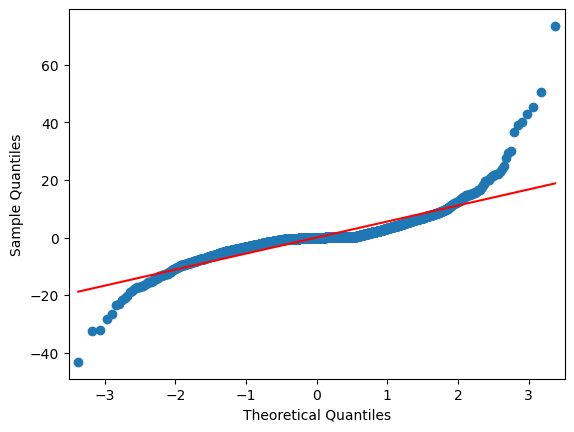

Residuals are not normal
energy_use_kg_kgdp vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


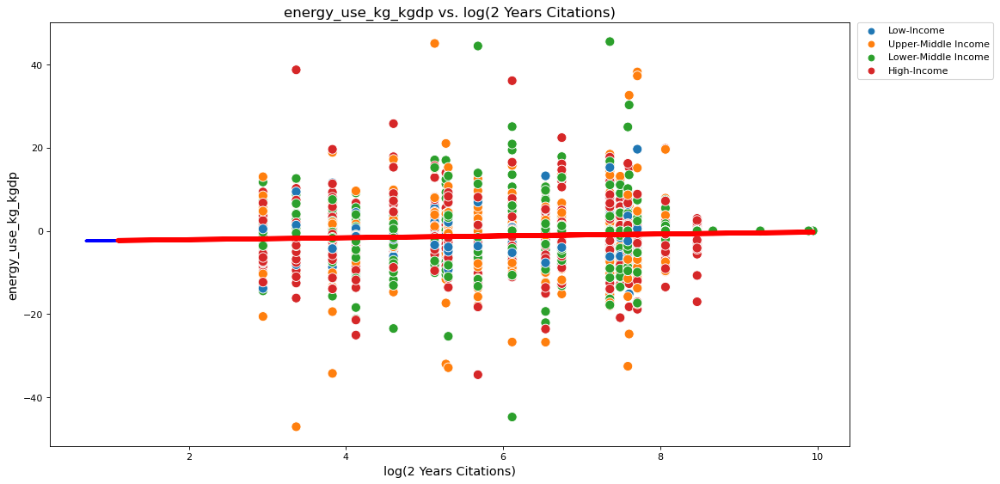

                            OLS Regression Results                            
Dep. Variable:     energy_use_kg_kgdp   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     16.86
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           4.16e-05
Time:                        20:37:01   Log-Likelihood:                -8010.0
No. Observations:                2551   AIC:                         1.602e+04
Df Residuals:                    2549   BIC:                         1.604e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -2.5642      0.397     -6.456      

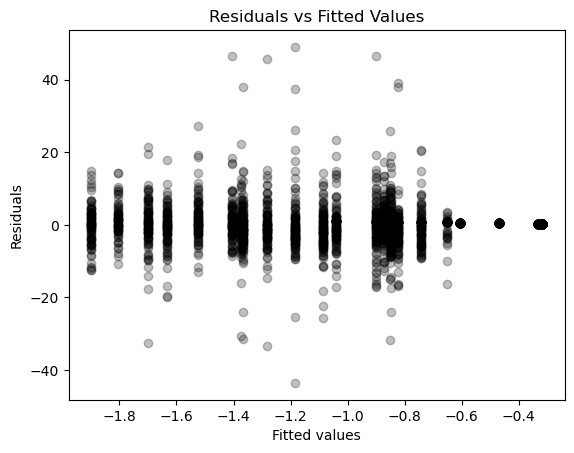

Residuals-- checking normality


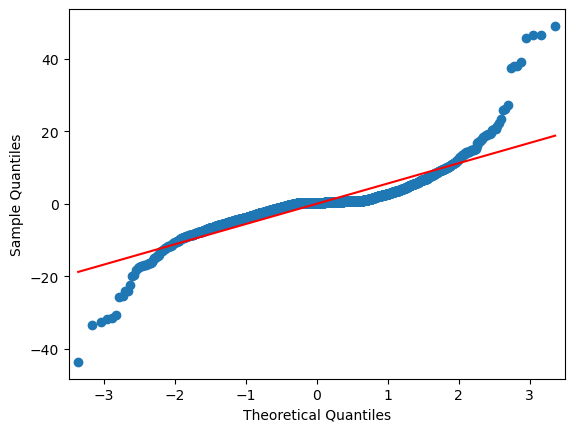

Residuals are not normal
gdp_over_energy_const_2017 vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


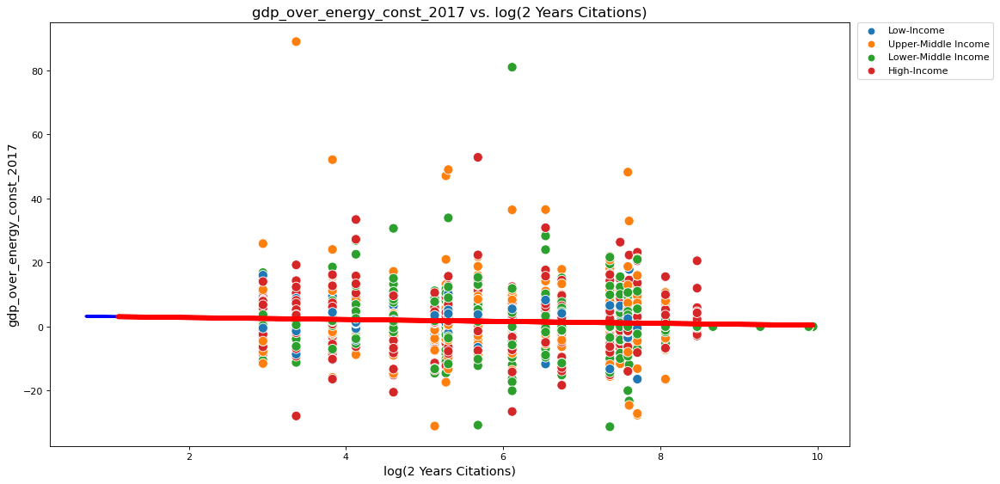

                                OLS Regression Results                                
Dep. Variable:     gdp_over_energy_const_2017   R-squared:                       0.011
Model:                                    OLS   Adj. R-squared:                  0.010
Method:                         Least Squares   F-statistic:                     27.09
Date:                        Sat, 17 Dec 2022   Prob (F-statistic):           2.10e-07
Time:                                20:37:02   Log-Likelihood:                -8144.8
No. Observations:                        2551   AIC:                         1.629e+04
Df Residuals:                            2549   BIC:                         1.631e+04
Df Model:                                   1                                         
Covariance Type:                    nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

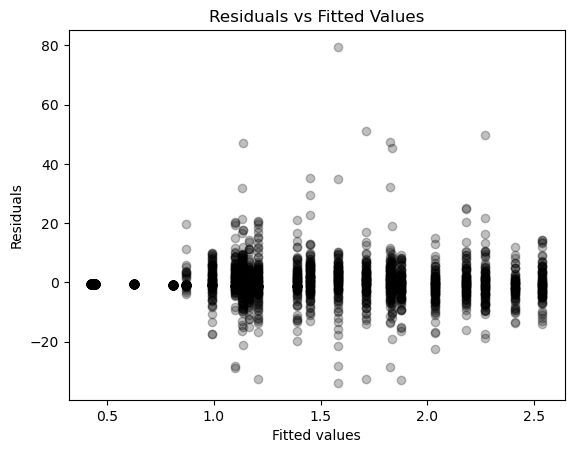

Residuals-- checking normality


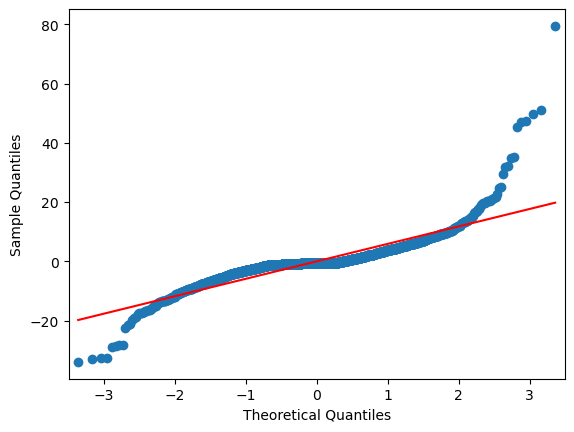

Residuals are not normal
gdp_over_energy vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


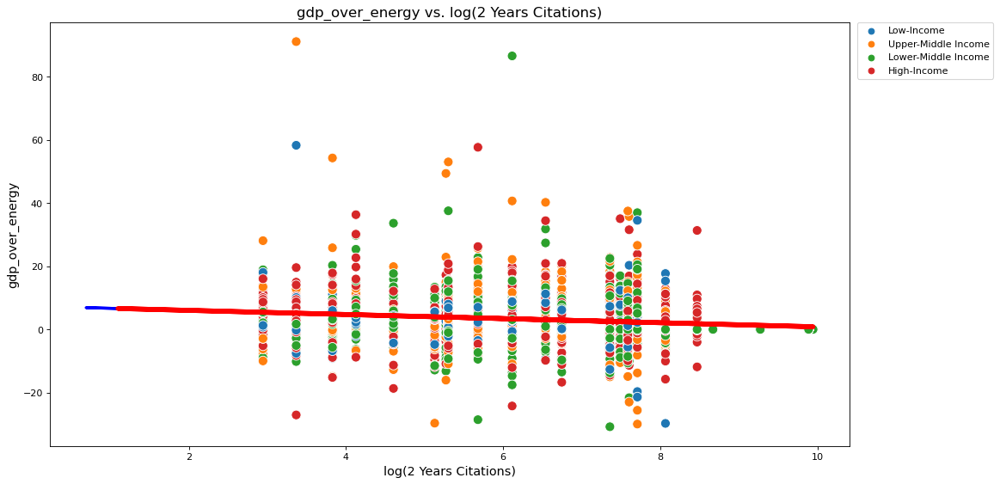

                            OLS Regression Results                            
Dep. Variable:        gdp_over_energy   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.040
Method:                 Least Squares   F-statistic:                     108.7
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           5.94e-25
Time:                        20:37:02   Log-Likelihood:                -8554.5
No. Observations:                2607   AIC:                         1.711e+04
Df Residuals:                    2605   BIC:                         1.712e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           7.3307      0.452     16.220      

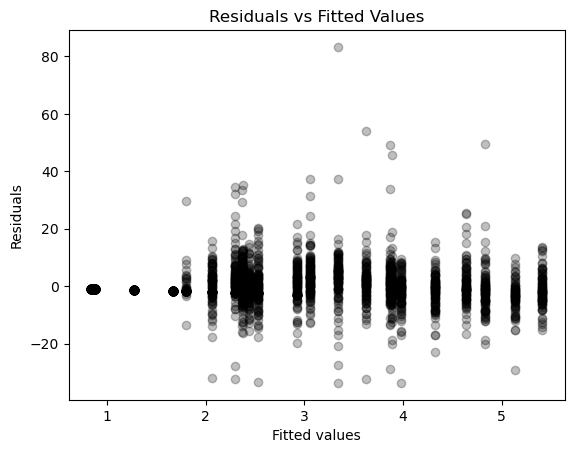

Residuals-- checking normality


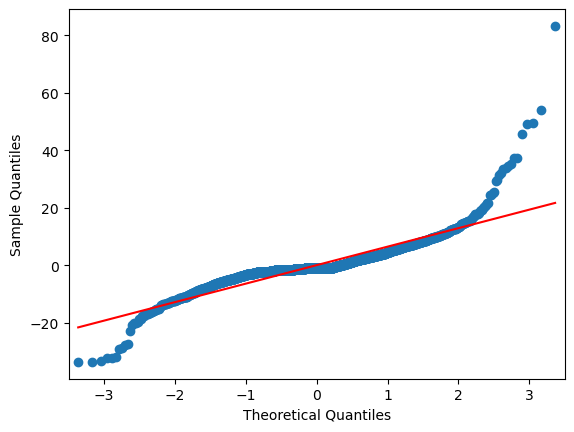

Residuals are not normal
Significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', 'energy_use_kg_kgdp', [], 'gdp_over_energy_const_2017', 'gdp_over_energy', [], []]

Not significant regression for:  [[], [], [], 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', 'energy_intensity', [], [], 'fossil_fual_comsumption', [], [], 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against log(2 years) ['cooking', 'rural_cooking', 'urban_cooking', [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', 'energy_use_kg_kgdp', [], 'gdp_over_

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


In [360]:
indicators = data.columns.tolist()[5:32] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', '2 years window', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)

In [361]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in dataframe

In [362]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,cooking,Yes
1,log_2_years,rural_cooking,Yes
2,log_2_years,urban_cooking,Yes
3,log_2_years,electric_consumption,Yes
4,log_2_years,energy_use_kg_capita,Yes
5,log_2_years,energy_use_kg_kgdp,Yes
6,log_2_years,gdp_over_energy_const_2017,Yes
7,log_2_years,gdp_over_energy,Yes
8,log_2_years,electricy,No
9,log_2_years,rural_electricy,No


### Plotting non significant indicators against log_2_years

In [363]:
# #colored by economy level
# for i in models_not_sig['indicator']:
    
#     print(i+' vs log_2_years')
#     plt.figure(figsize=(15, 8), dpi=80)
#     p1 = sns.scatterplot(x = 'log_2_Years', y = i, data = data, hue='Economy Level', s=100)
#     p1.legend(bbox_to_anchor=(1.01,1.0), loc='upper left', borderaxespad=0)#,borderaxespad = 0., ncol = 1)
#     plt.xlabel('log_2_years', fontsize=13)
#     plt.ylabel(i, fontsize=13)
#     plt.title(i +' vs log_2_years', fontsize=15)

#     plt.show()

### - AR-index

cooking vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


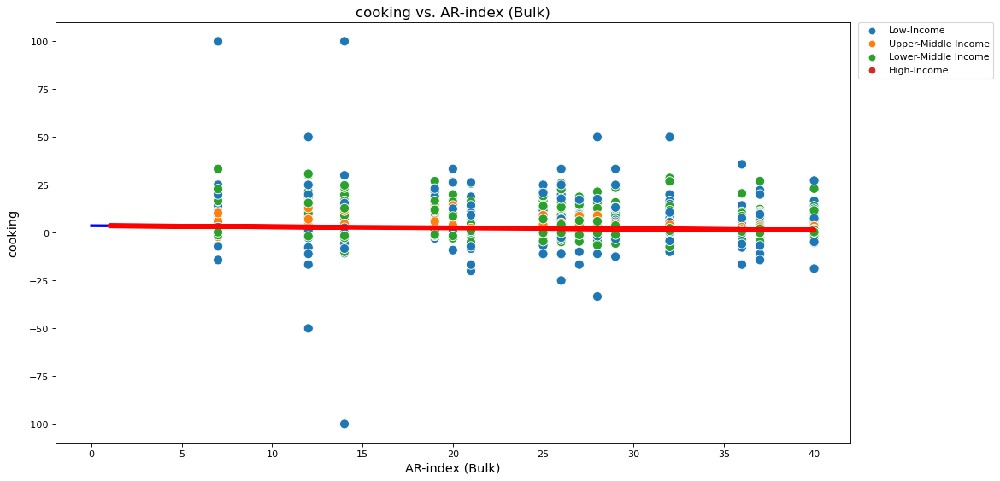

                            OLS Regression Results                            
Dep. Variable:                cooking   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     17.41
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           3.11e-05
Time:                        20:37:03   Log-Likelihood:                -8594.9
No. Observations:                2651   AIC:                         1.719e+04
Df Residuals:                    2649   BIC:                         1.721e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             3.6674      0.343     10.677

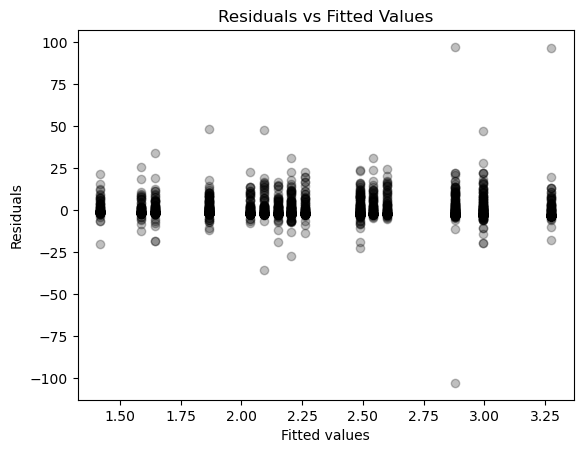

Residuals-- checking normality


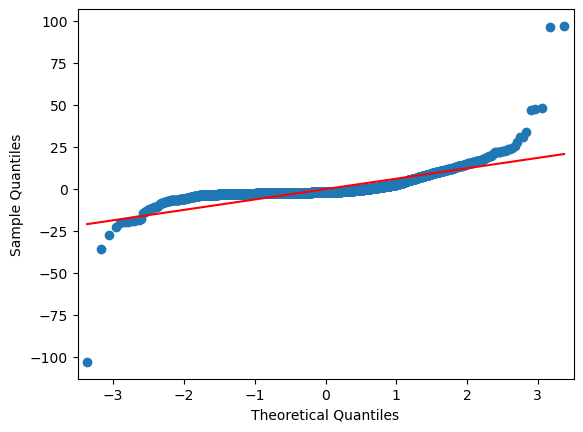

Residuals are not normal
rural_cooking vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


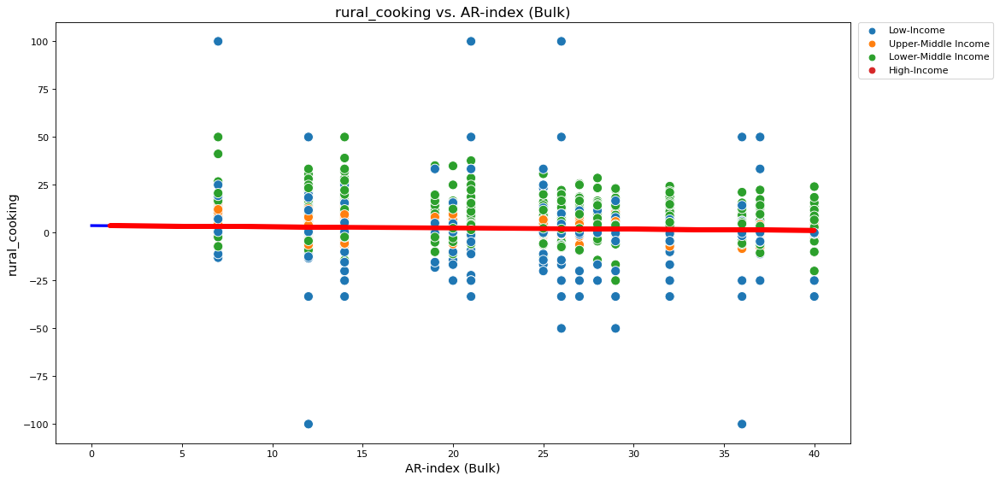

                            OLS Regression Results                            
Dep. Variable:          rural_cooking   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     12.05
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           0.000527
Time:                        20:37:04   Log-Likelihood:                -9266.7
No. Observations:                2629   AIC:                         1.854e+04
Df Residuals:                    2627   BIC:                         1.855e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             3.7095      0.458      8.108

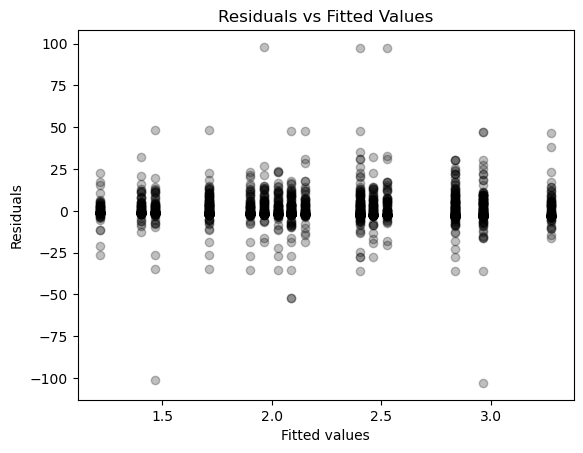

Residuals-- checking normality


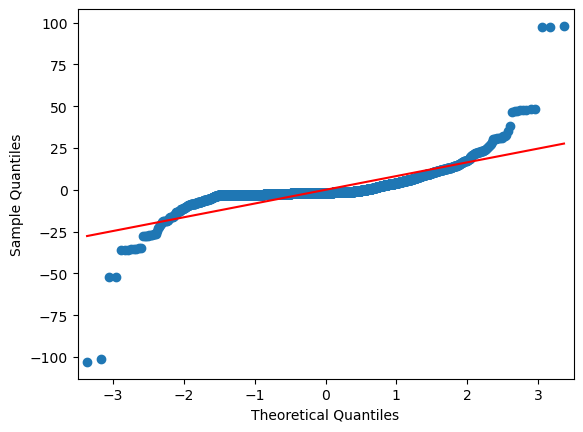

Residuals are not normal
urban_cooking vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


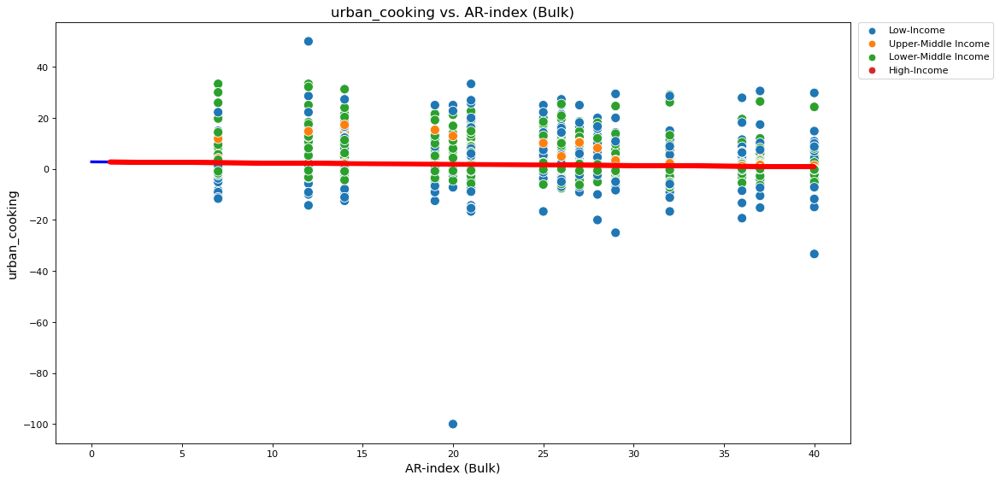

                            OLS Regression Results                            
Dep. Variable:          urban_cooking   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     16.97
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           3.92e-05
Time:                        20:37:05   Log-Likelihood:                -8200.1
No. Observations:                2644   AIC:                         1.640e+04
Df Residuals:                    2642   BIC:                         1.642e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             2.7765      0.299      9.292

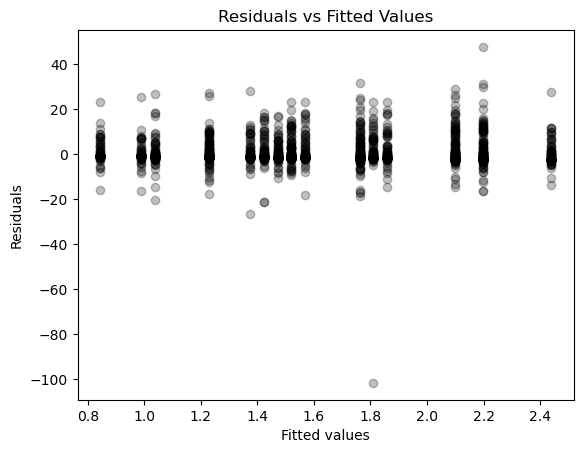

Residuals-- checking normality


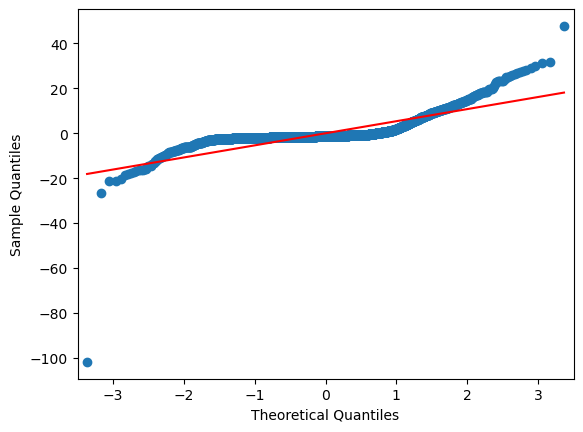

Residuals are not normal
electric_consumption vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

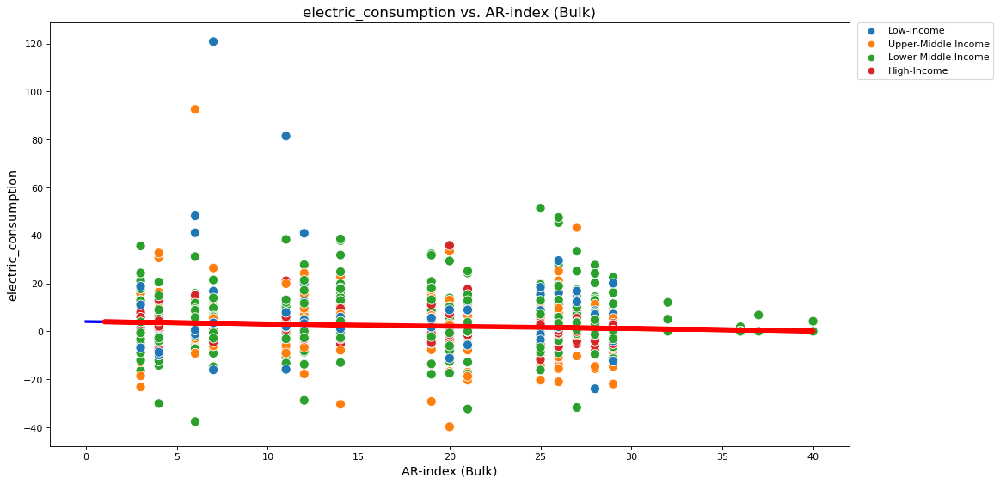

                             OLS Regression Results                             
Dep. Variable:     electric_consumption   R-squared:                       0.023
Model:                              OLS   Adj. R-squared:                  0.022
Method:                   Least Squares   F-statistic:                     54.80
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):           1.85e-13
Time:                          20:37:06   Log-Likelihood:                -7835.5
No. Observations:                  2358   AIC:                         1.568e+04
Df Residuals:                      2356   BIC:                         1.569e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             4.0548  

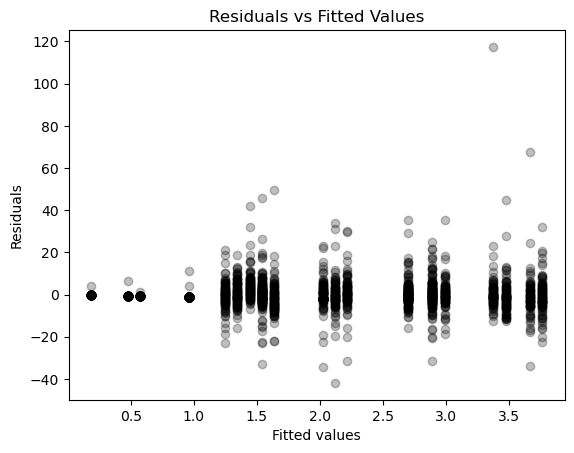

Residuals-- checking normality


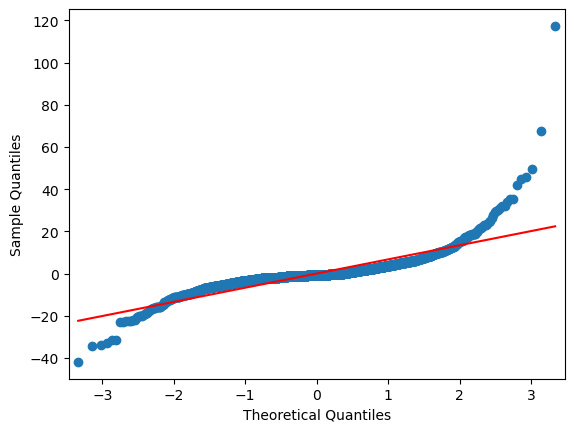

Residuals are not normal
energy_use_kg_capita vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

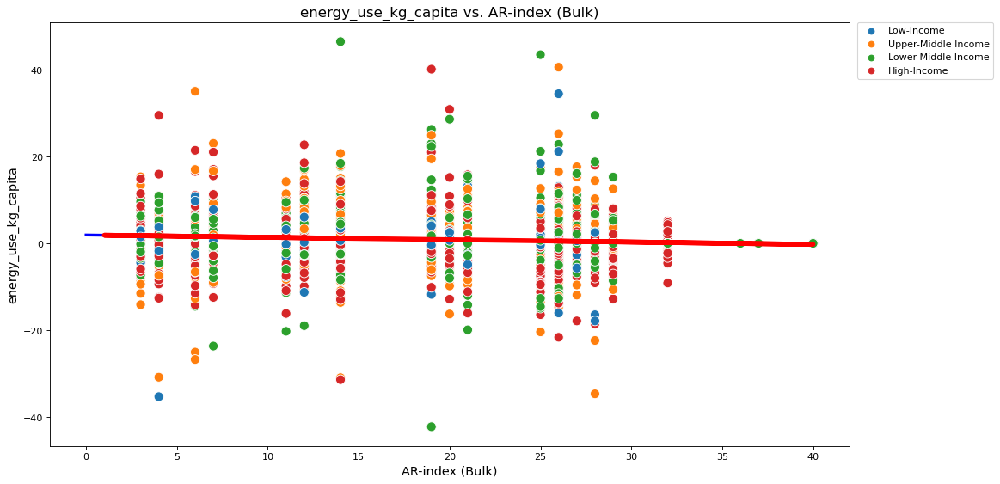

                             OLS Regression Results                             
Dep. Variable:     energy_use_kg_capita   R-squared:                       0.010
Model:                              OLS   Adj. R-squared:                  0.010
Method:                   Least Squares   F-statistic:                     27.11
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):           2.07e-07
Time:                          20:37:07   Log-Likelihood:                -8445.9
No. Observations:                  2692   AIC:                         1.690e+04
Df Residuals:                      2690   BIC:                         1.691e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             1.9306  

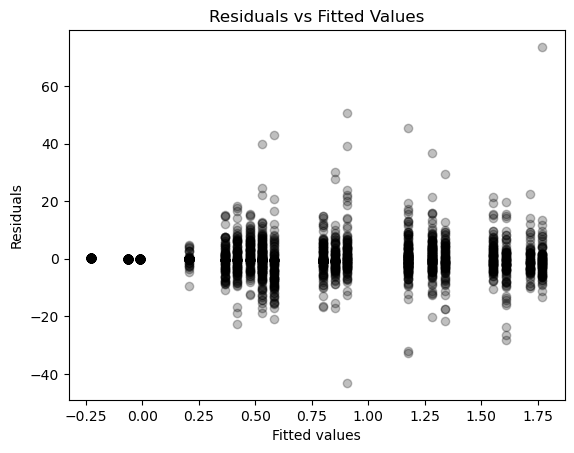

Residuals-- checking normality


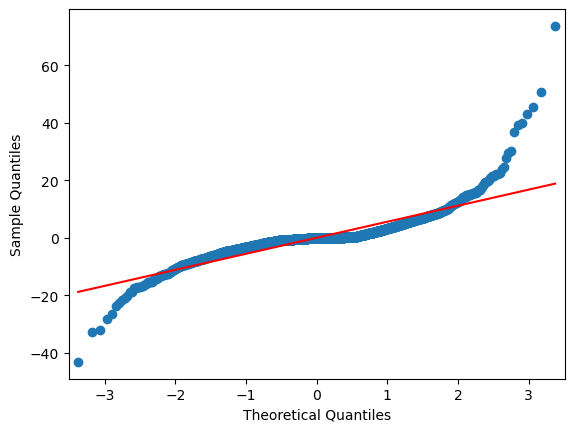

Residuals are not normal
energy_use_kg_kgdp vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


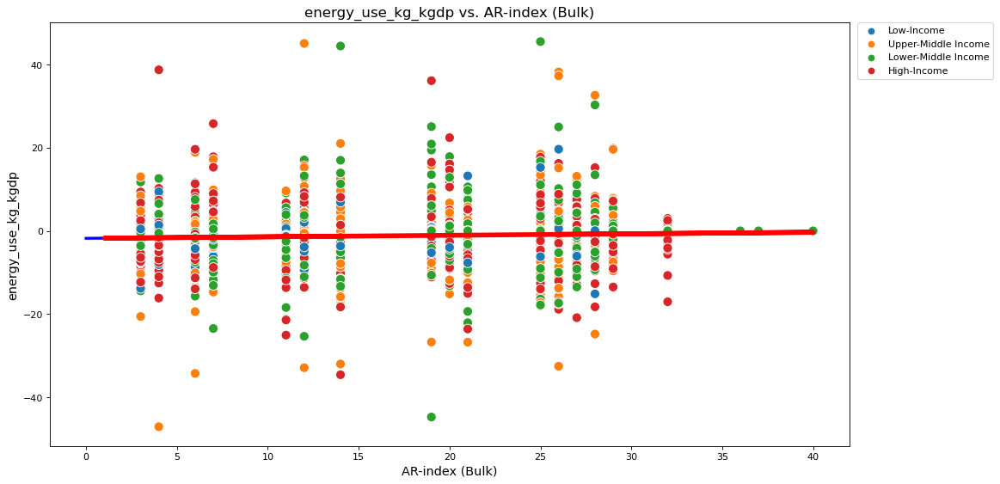

                            OLS Regression Results                            
Dep. Variable:     energy_use_kg_kgdp   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     11.45
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           0.000724
Time:                        20:37:08   Log-Likelihood:                -8012.7
No. Observations:                2551   AIC:                         1.603e+04
Df Residuals:                    2549   BIC:                         1.604e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.7936      0.260     -6.903

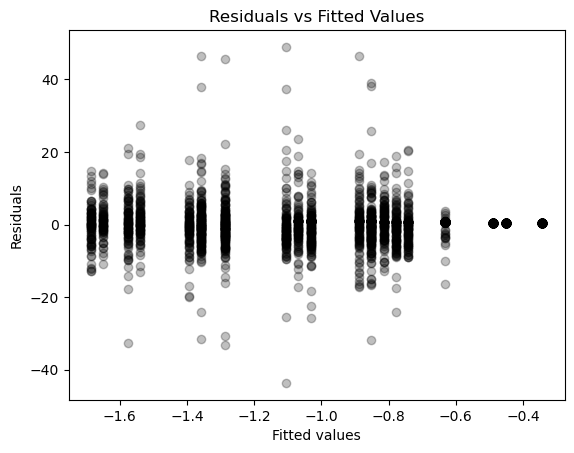

Residuals-- checking normality


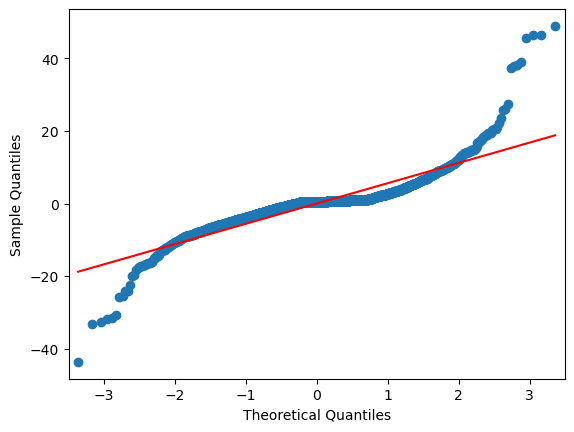

Residuals are not normal
gdp_over_energy_const_2017 vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


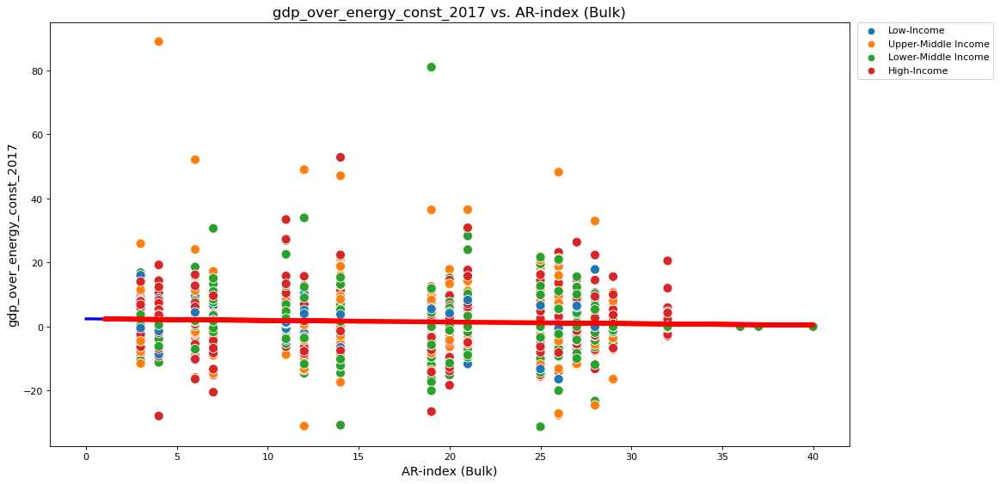

                                OLS Regression Results                                
Dep. Variable:     gdp_over_energy_const_2017   R-squared:                       0.007
Model:                                    OLS   Adj. R-squared:                  0.007
Method:                         Least Squares   F-statistic:                     19.25
Date:                        Sat, 17 Dec 2022   Prob (F-statistic):           1.20e-05
Time:                                20:37:09   Log-Likelihood:                -8148.7
No. Observations:                        2551   AIC:                         1.630e+04
Df Residuals:                            2549   BIC:                         1.631e+04
Df Model:                                   1                                         
Covariance Type:                    nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------

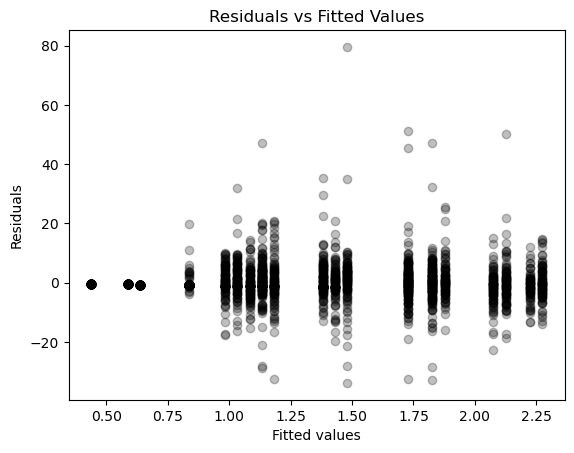

Residuals-- checking normality


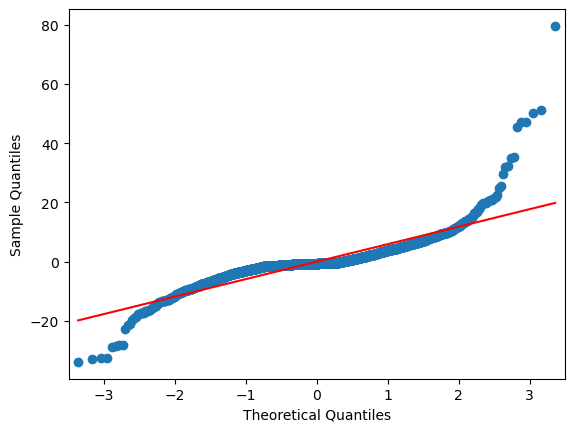

Residuals are not normal
gdp_over_energy vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


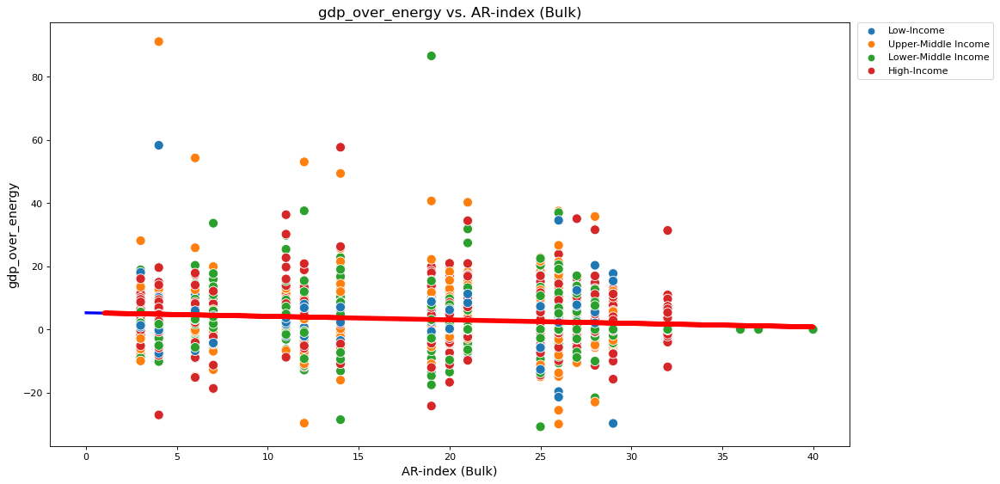

                            OLS Regression Results                            
Dep. Variable:        gdp_over_energy   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     83.59
Date:                Sat, 17 Dec 2022   Prob (F-statistic):           1.19e-19
Time:                        20:37:09   Log-Likelihood:                -8566.6
No. Observations:                2607   AIC:                         1.714e+04
Df Residuals:                    2605   BIC:                         1.715e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             5.2608      0.297     17.724

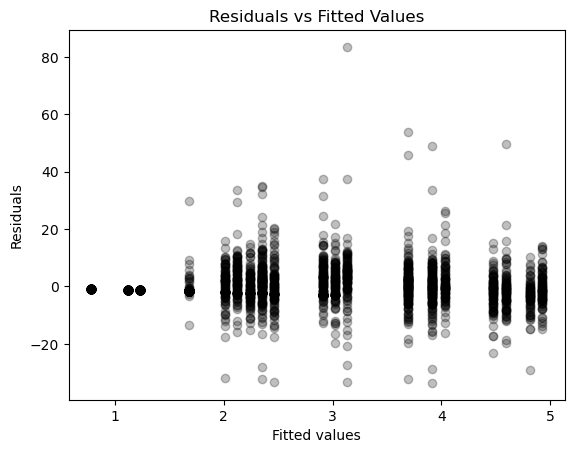

Residuals-- checking normality


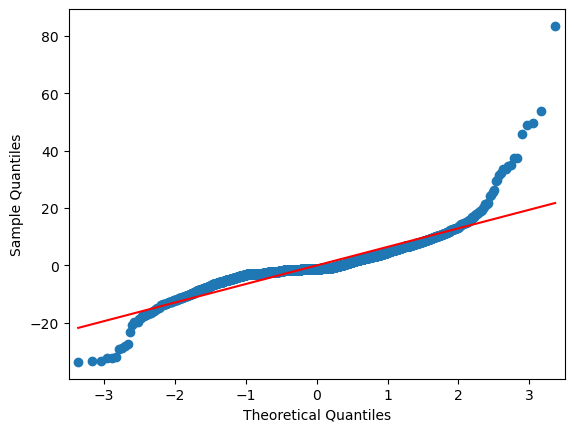

Residuals are not normal
Significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', 'energy_use_kg_kgdp', [], 'gdp_over_energy_const_2017', 'gdp_over_energy', [], []]

Not significant regression for:  [[], [], [], 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', 'energy_intensity', [], [], 'fossil_fual_comsumption', [], [], 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against AR-index ['cooking', 'rural_cooking', 'urban_cooking', [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', 'energy_use_kg_kgdp', [], 'gdp_over_ener

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


In [364]:
indicators = data.columns.tolist()[5:32]
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

In [365]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a dataframe

In [366]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,cooking,Yes
1,AR-index,rural_cooking,Yes
2,AR-index,urban_cooking,Yes
3,AR-index,electric_consumption,Yes
4,AR-index,energy_use_kg_capita,Yes
5,AR-index,energy_use_kg_kgdp,Yes
6,AR-index,gdp_over_energy_const_2017,Yes
7,AR-index,gdp_over_energy,Yes
8,AR-index,electricy,No
9,AR-index,rural_electricy,No


## Quantile Regressions

### - log_2_years

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


cooking vs log_2_Years


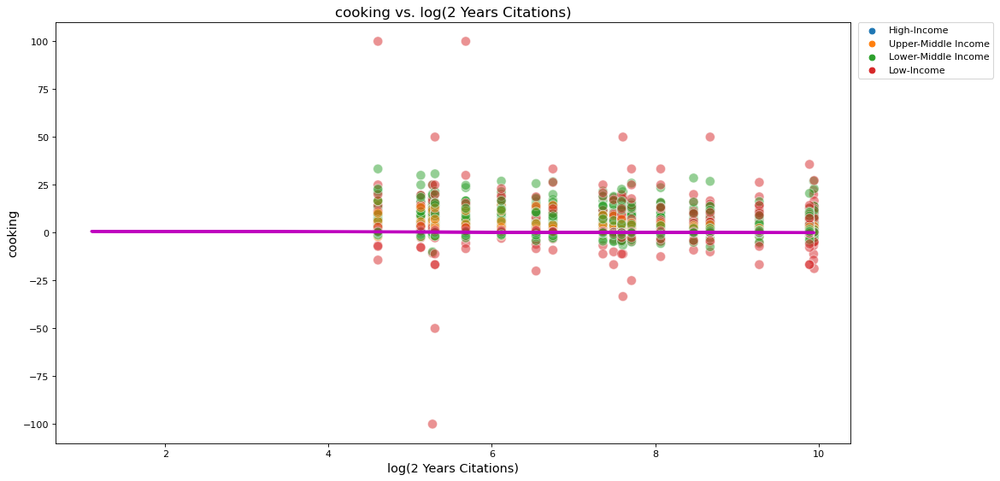

                         QuantReg Regression Results                          
Dep. Variable:                cooking   Pseudo R-squared:             0.002051
Model:                       QuantReg   Bandwidth:                      0.7466
Method:                 Least Squares   Sparsity:                        2.054
Date:                Sat, 17 Dec 2022   No. Observations:                 3048
Time:                        20:37:10   Df Residuals:                     3046
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.8062      0.085      9.439      0.000       0.639       0.974
log_2_Years    -0.0811      0.011     -7.155      0.000      -0.103      -0.059

Residuals vs Fitted Values-- looking for heteroskedascity


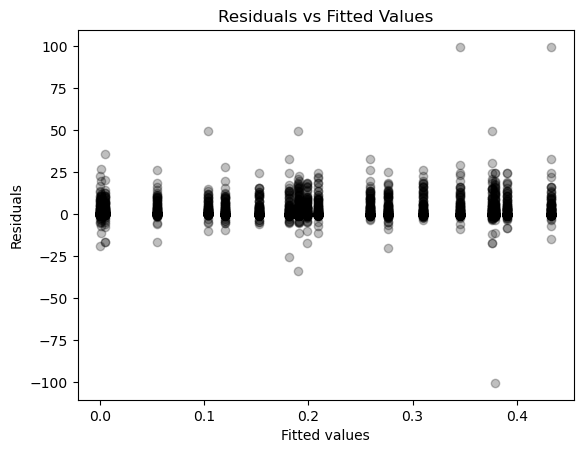

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

electric_consumption vs log_2_Years


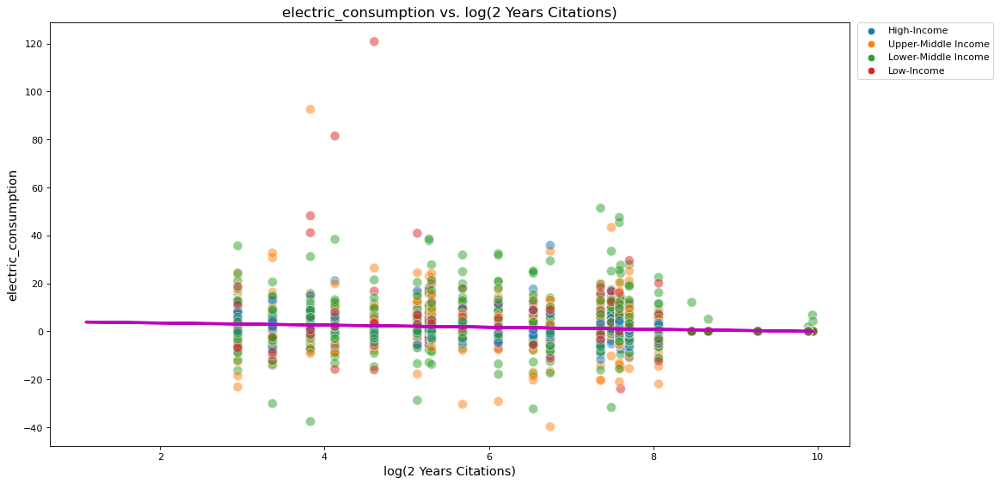

                          QuantReg Regression Results                           
Dep. Variable:     electric_consumption   Pseudo R-squared:              0.06801
Model:                         QuantReg   Bandwidth:                      0.9462
Method:                   Least Squares   Sparsity:                        4.101
Date:                  Sat, 17 Dec 2022   No. Observations:                 2707
Time:                          20:37:11   Df Residuals:                     2705
                                          Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       4.3582      0.135     32.229      0.000       4.093       4.623
log_2_Years    -0.4407      0.019    -23.093      0.000      -0.478      -0.403

Residuals vs Fitted Values-- looking for heteroskedascity


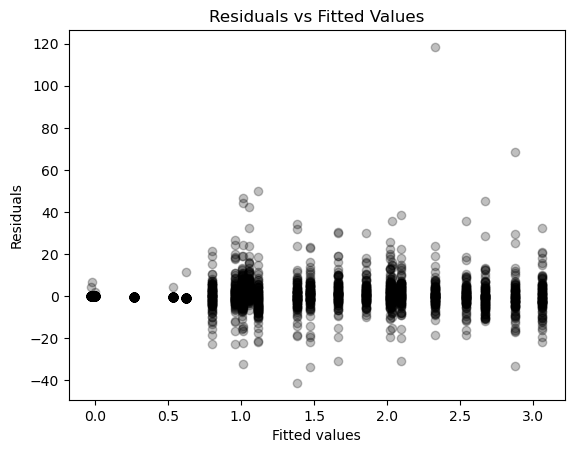

energy_intensity vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Us

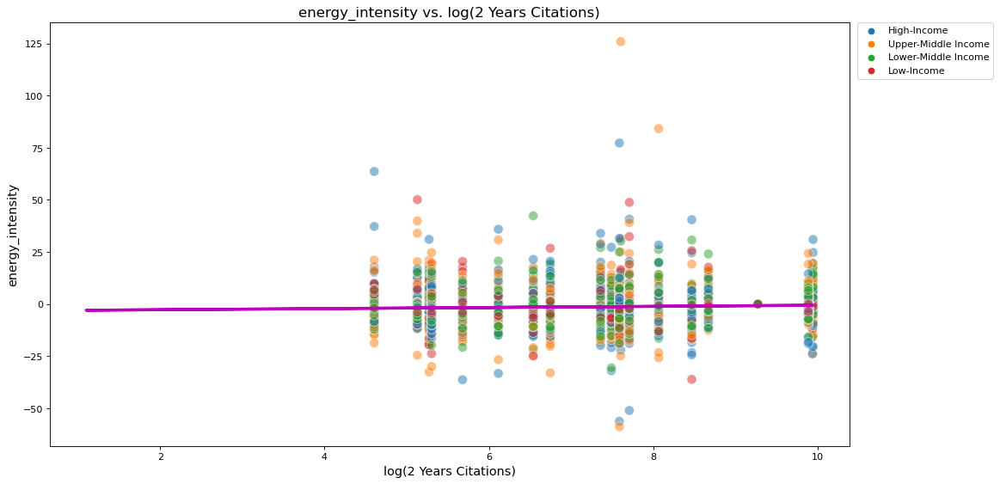

                         QuantReg Regression Results                          
Dep. Variable:       energy_intensity   Pseudo R-squared:             0.003728
Model:                       QuantReg   Bandwidth:                       1.457
Method:                 Least Squares   Sparsity:                        9.591
Date:                Sat, 17 Dec 2022   No. Observations:                 3175
Time:                        20:37:12   Df Residuals:                     3173
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -3.2535      0.392     -8.291      0.000      -4.023      -2.484
log_2_Years     0.2683      0.052      5.165      0.000       0.166       0.370

Residuals vs Fitted Values-- looking for heteroskedascity


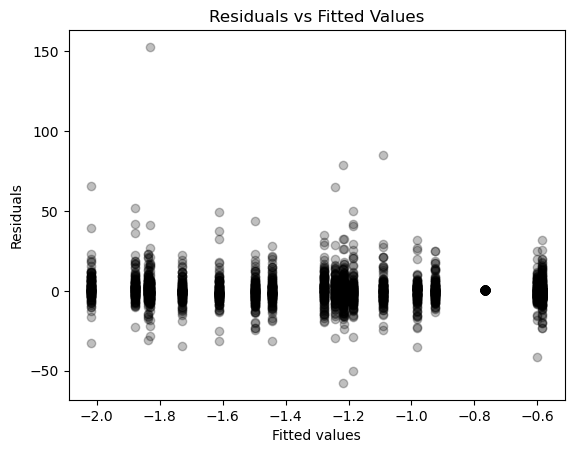

energy_use_kg_capita vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


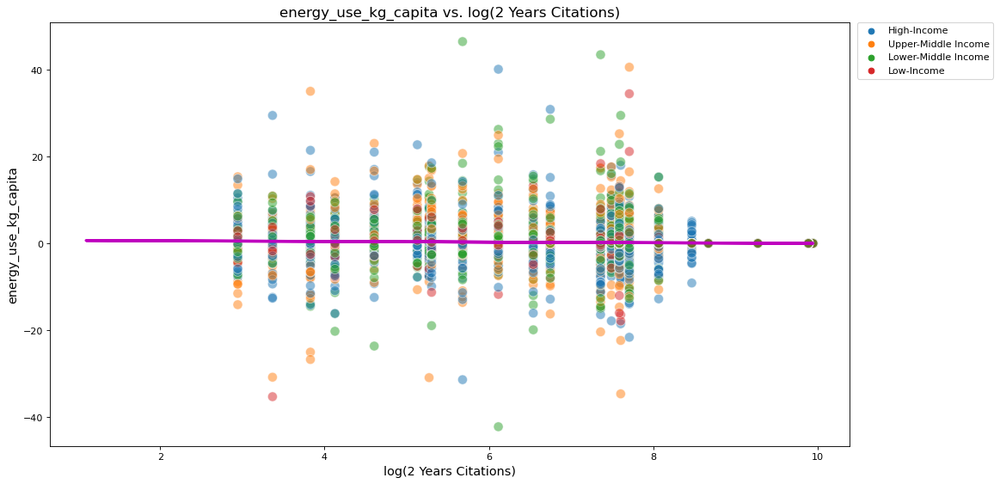

                          QuantReg Regression Results                           
Dep. Variable:     energy_use_kg_capita   Pseudo R-squared:             0.002531
Model:                         QuantReg   Bandwidth:                      0.6638
Method:                   Least Squares   Sparsity:                        2.313
Date:                  Sat, 17 Dec 2022   No. Observations:                 3091
Time:                          20:37:13   Df Residuals:                     3089
                                          Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.7472      0.074     10.067      0.000       0.602       0.893
log_2_Years    -0.0756      0.010     -7.338      0.000      -0.096      -0.055

Residuals vs Fitted Values-- looking for heteroskedascity


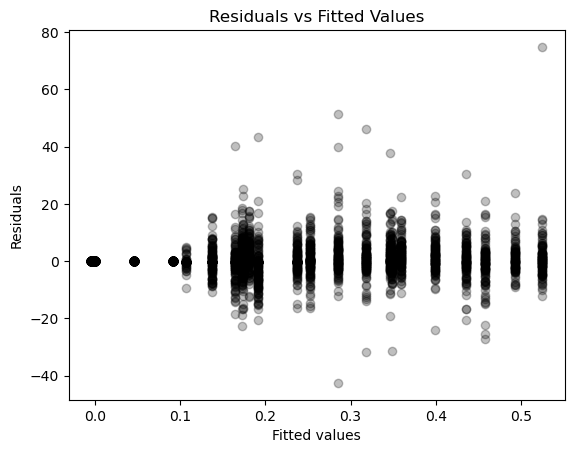

energy_use_kg_kgdp vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


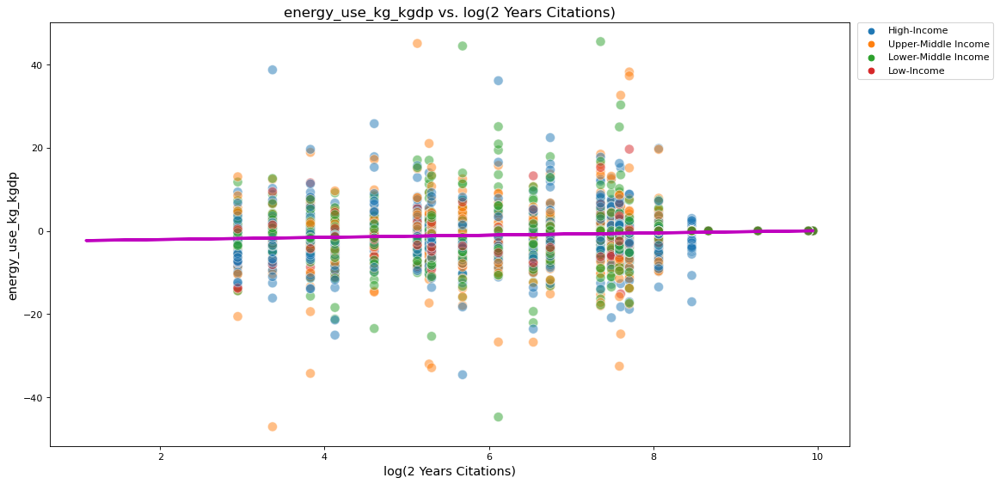

                         QuantReg Regression Results                          
Dep. Variable:     energy_use_kg_kgdp   Pseudo R-squared:              0.02607
Model:                       QuantReg   Bandwidth:                      0.7259
Method:                 Least Squares   Sparsity:                        3.011
Date:                Sat, 17 Dec 2022   No. Observations:                 2930
Time:                        20:37:13   Df Residuals:                     2928
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -2.6140      0.100    -26.187      0.000      -2.810      -2.418
log_2_Years     0.2643      0.014     19.111      0.000       0.237       0.291

Residuals vs Fitted Values-- looking for heteroskedascity


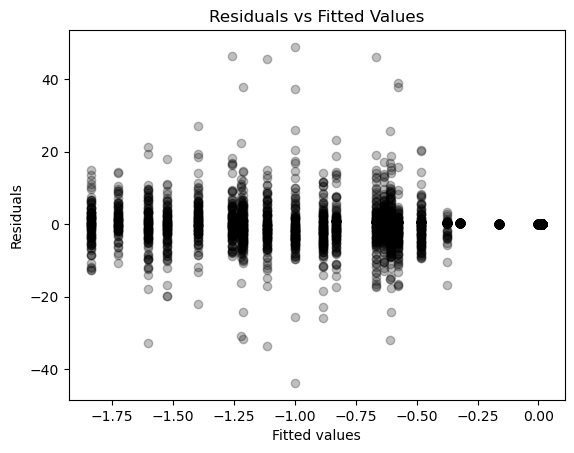

gdp_over_energy_const_2017 vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


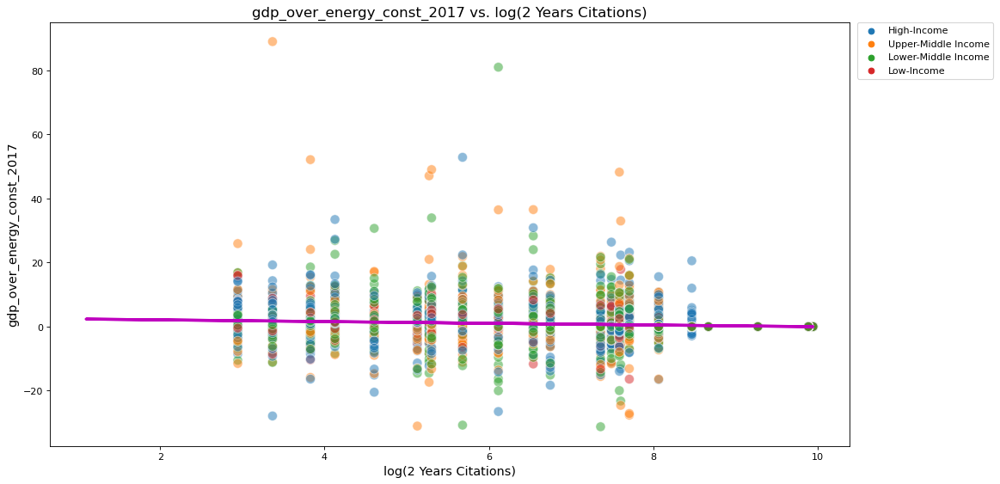

                             QuantReg Regression Results                              
Dep. Variable:     gdp_over_energy_const_2017   Pseudo R-squared:              0.02545
Model:                               QuantReg   Bandwidth:                      0.7524
Method:                         Least Squares   Sparsity:                        3.087
Date:                        Sat, 17 Dec 2022   No. Observations:                 2930
Time:                                20:37:14   Df Residuals:                     2928
                                                Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       2.6406      0.102     25.807      0.000       2.440       2.841
log_2_Years    -0.2670      0.014    -18.834      0.000      -0.295      -0.239

Residuals vs Fitted Values-- looking for heteroskedascity


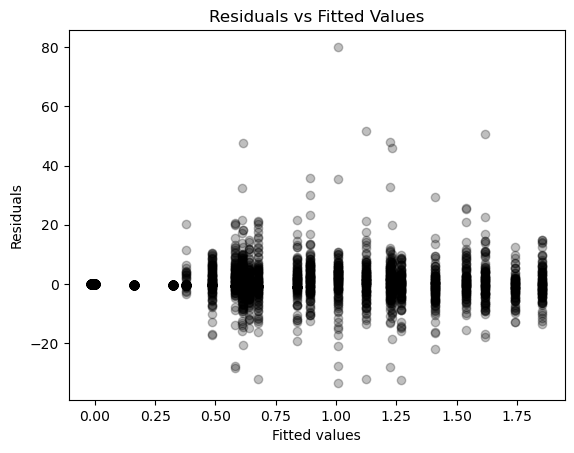

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


gdp_over_energy vs log_2_Years


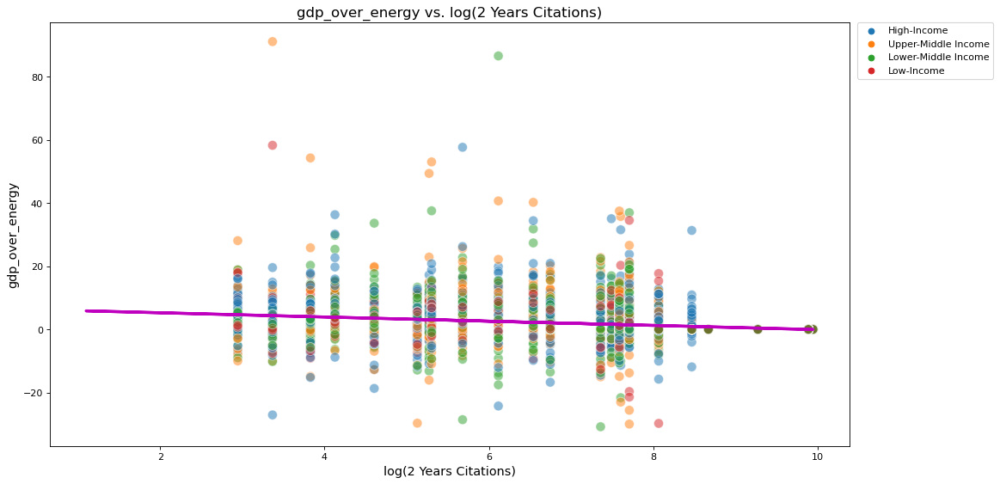

                         QuantReg Regression Results                          
Dep. Variable:        gdp_over_energy   Pseudo R-squared:               0.1040
Model:                       QuantReg   Bandwidth:                       1.145
Method:                 Least Squares   Sparsity:                        5.254
Date:                Sat, 17 Dec 2022   No. Observations:                 2994
Time:                        20:37:15   Df Residuals:                     2992
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       6.5959      0.172     38.327      0.000       6.258       6.933
log_2_Years    -0.6670      0.024    -27.974      0.000      -0.714      -0.620

Residuals vs Fitted Values-- looking for heteroskedascity


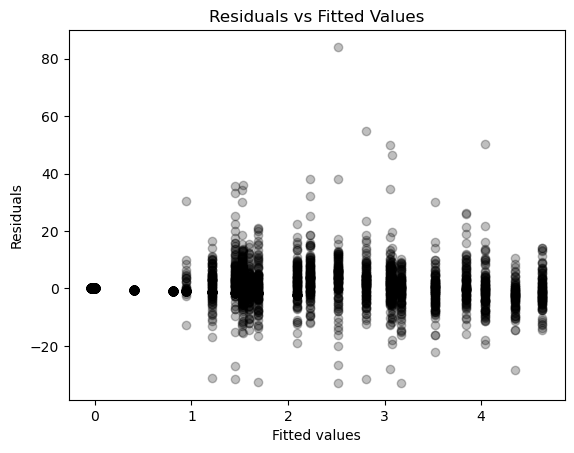

Significant regression for:  ['cooking', [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], 'energy_intensity', 'energy_use_kg_capita', 'energy_use_kg_kgdp', [], 'gdp_over_energy_const_2017', 'gdp_over_energy', [], []]

Not significant regression for:  [[], 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', [], [], [], 'fossil_fual_comsumption', [], [], 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against log(2 years) [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Us

In [367]:
indicators = data.columns.tolist()[5:32] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]
    

    sig, not_sig,resids_not_normal = quantile_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)

In [368]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a dataframe

In [369]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,cooking,Yes
1,log_2_years,electric_consumption,Yes
2,log_2_years,energy_intensity,Yes
3,log_2_years,energy_use_kg_capita,Yes
4,log_2_years,energy_use_kg_kgdp,Yes
5,log_2_years,gdp_over_energy_const_2017,Yes
6,log_2_years,gdp_over_energy,Yes
7,log_2_years,rural_cooking,No
8,log_2_years,urban_cooking,No
9,log_2_years,electricy,No


### - AR-index

cooking vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


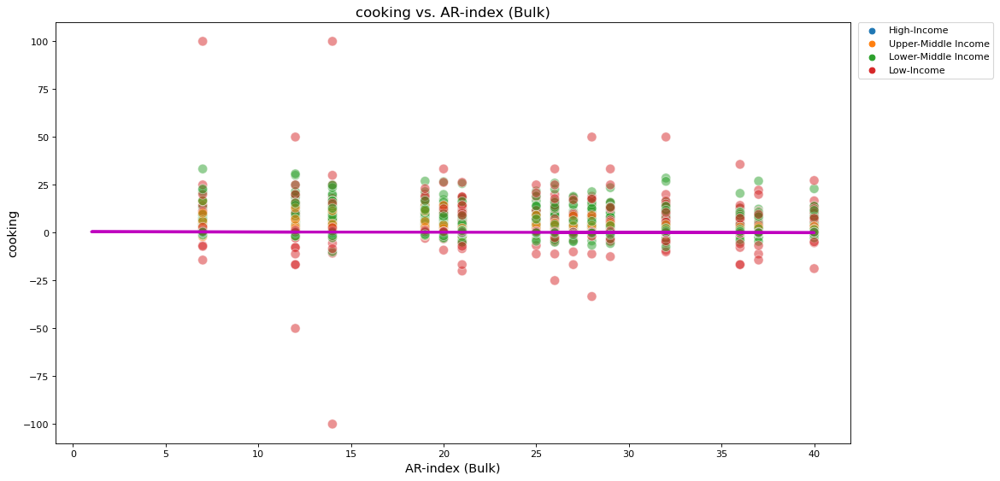

                         QuantReg Regression Results                          
Dep. Variable:                cooking   Pseudo R-squared:             0.001664
Model:                       QuantReg   Bandwidth:                      0.7606
Method:                 Least Squares   Sparsity:                        2.066
Date:                Sat, 17 Dec 2022   No. Observations:                 3048
Time:                        20:37:16   Df Residuals:                     3046
                                        Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.5106      0.053      9.574      0.000       0.406       0.615
ar_index_bulk    -0.0128      0.002     -6.089      0.000      -0.017      -0.009

Residuals vs Fitted Values-- looking for heteroskedascity


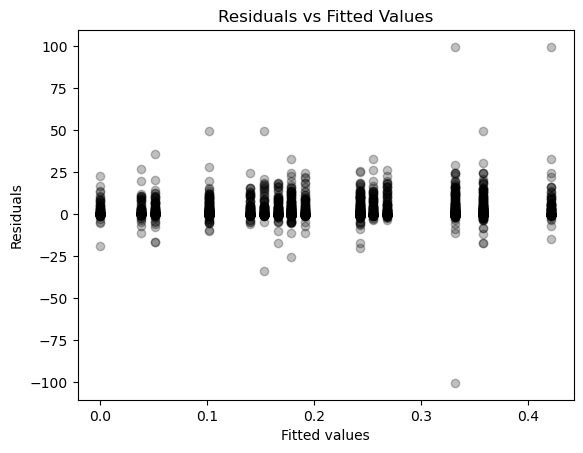

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

electric_consumption vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C

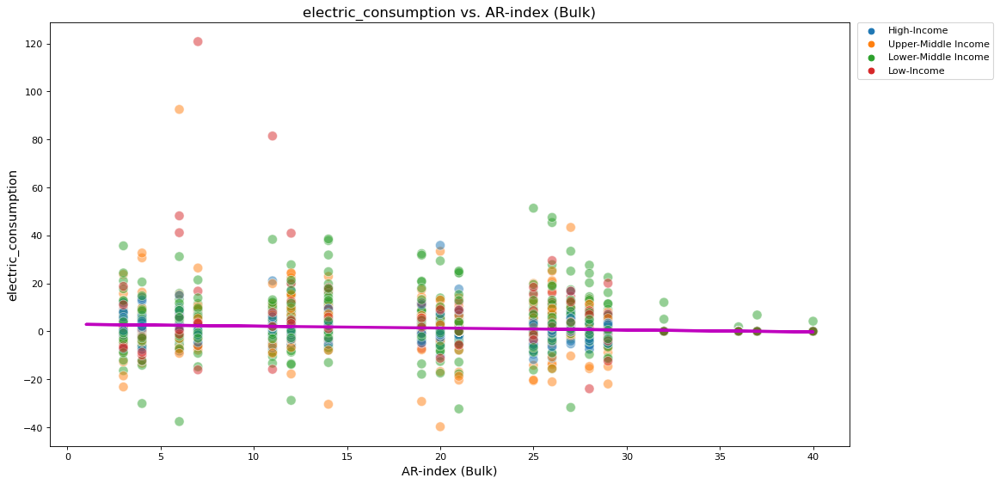

                          QuantReg Regression Results                           
Dep. Variable:     electric_consumption   Pseudo R-squared:              0.05447
Model:                         QuantReg   Bandwidth:                      0.9901
Method:                   Least Squares   Sparsity:                        4.556
Date:                  Sat, 17 Dec 2022   No. Observations:                 2707
Time:                          20:37:17   Df Residuals:                     2705
                                          Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         2.9625      0.098     30.319      0.000       2.771       3.154
ar_index_bulk    -0.0801      0.004    -19.353      0.000      -0.088      -0.072

Residuals vs Fitted Values-- looking for heteroskedascity


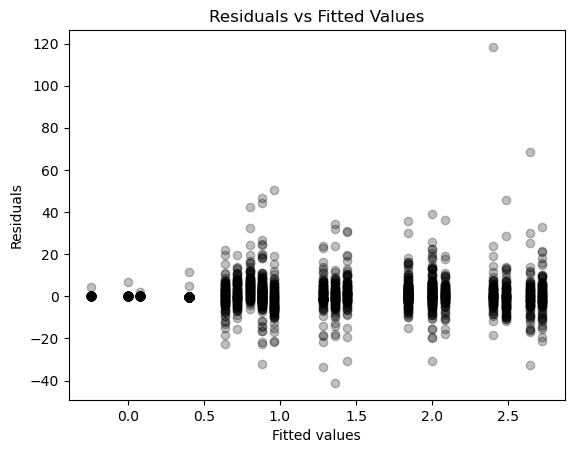

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C

energy_use_kg_capita vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


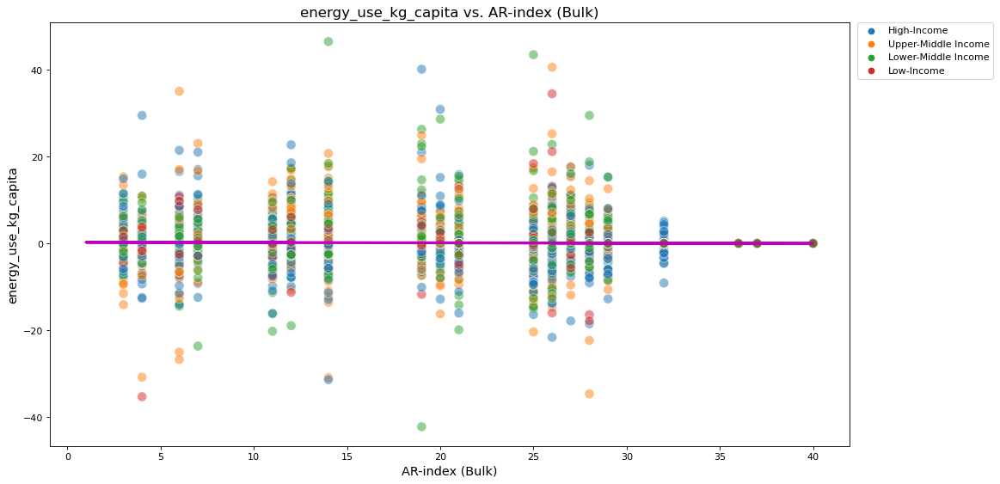

                          QuantReg Regression Results                           
Dep. Variable:     energy_use_kg_capita   Pseudo R-squared:            0.0008268
Model:                         QuantReg   Bandwidth:                      0.6530
Method:                   Least Squares   Sparsity:                        2.263
Date:                  Sat, 17 Dec 2022   No. Observations:                 3091
Time:                          20:37:17   Df Residuals:                     3089
                                          Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.2690      0.047      5.671      0.000       0.176       0.362
ar_index_bulk    -0.0075      0.002     -3.809      0.000      -0.011      -0.004

Residuals vs Fitted Values-- looking for heteroskedascity


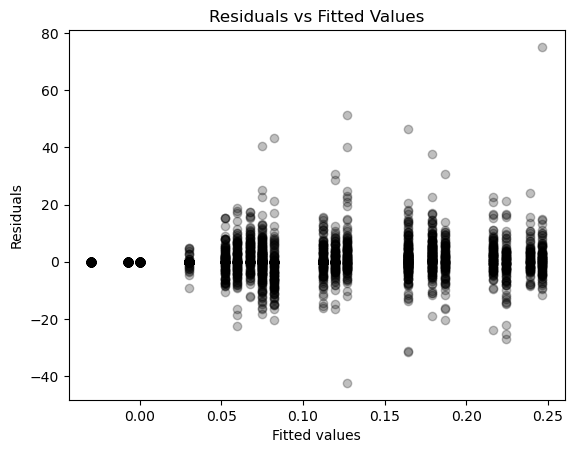

energy_use_kg_kgdp vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


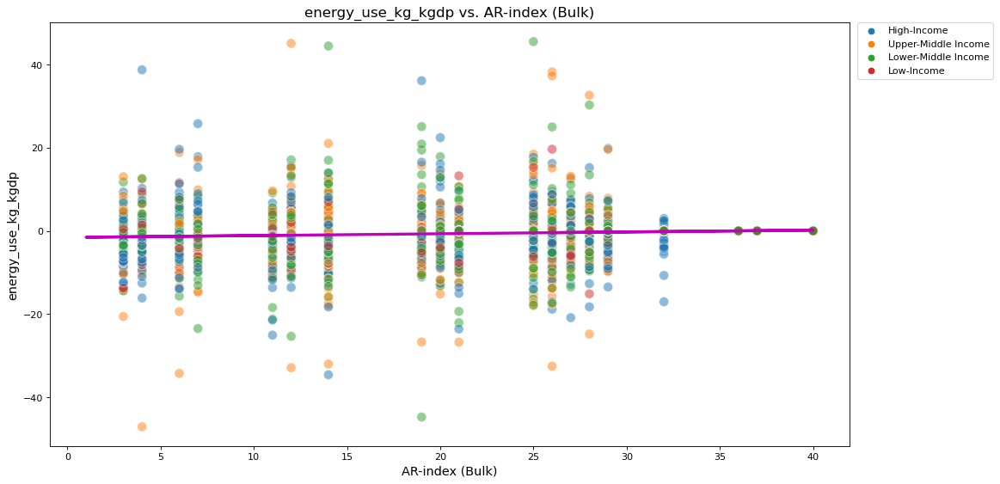

                         QuantReg Regression Results                          
Dep. Variable:     energy_use_kg_kgdp   Pseudo R-squared:              0.01668
Model:                       QuantReg   Bandwidth:                      0.7433
Method:                 Least Squares   Sparsity:                        3.128
Date:                Sat, 17 Dec 2022   No. Observations:                 2930
Time:                        20:37:18   Df Residuals:                     2928
                                        Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -1.5687      0.068    -23.180      0.000      -1.701      -1.436
ar_index_bulk     0.0436      0.003     15.592      0.000       0.038       0.049

Residuals vs Fitted Values-- looking for heteroskedascity


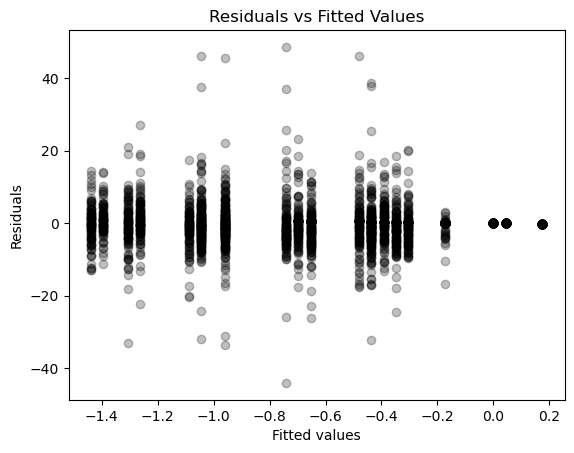

gdp_over_energy_const_2017 vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


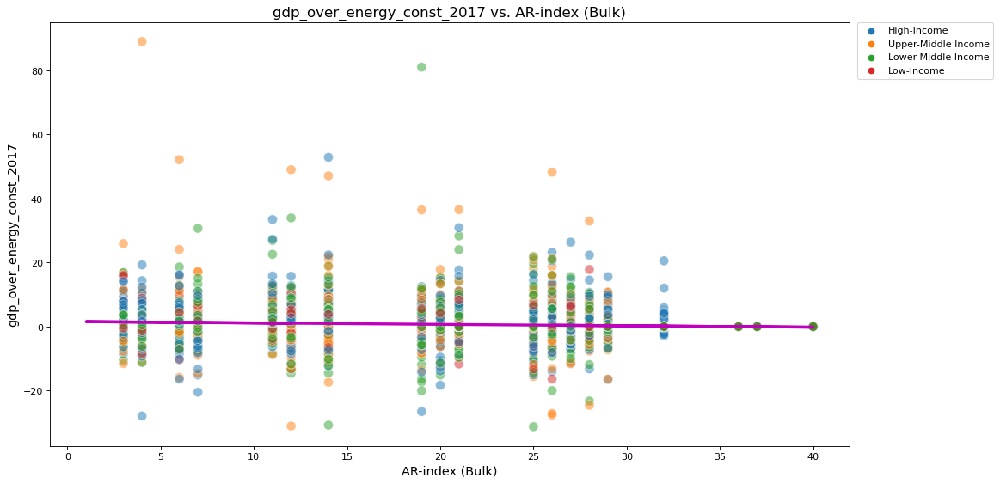

                             QuantReg Regression Results                              
Dep. Variable:     gdp_over_energy_const_2017   Pseudo R-squared:              0.01626
Model:                               QuantReg   Bandwidth:                      0.7665
Method:                         Least Squares   Sparsity:                        3.191
Date:                        Sat, 17 Dec 2022   No. Observations:                 2930
Time:                                20:37:19   Df Residuals:                     2928
                                                Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.5853      0.069     22.956      0.000       1.450       1.721
ar_index_bulk    -0.0440      0.003    -15.442      0.000      -0.050      -0.038

Residuals vs Fitted Values-- looking for heteroskedascity


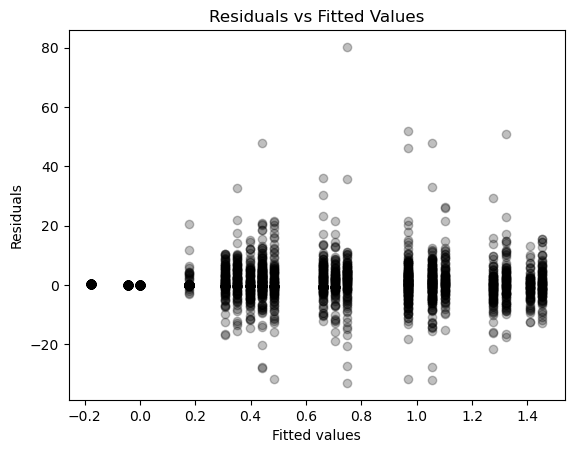

gdp_over_energy vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


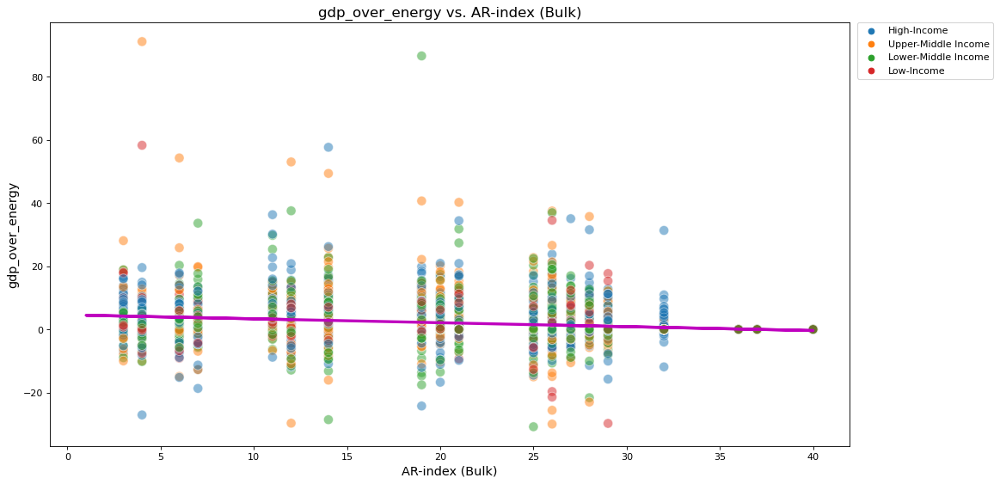

                         QuantReg Regression Results                          
Dep. Variable:        gdp_over_energy   Pseudo R-squared:              0.08396
Model:                       QuantReg   Bandwidth:                       1.196
Method:                 Least Squares   Sparsity:                        5.717
Date:                Sat, 17 Dec 2022   No. Observations:                 2994
Time:                        20:37:20   Df Residuals:                     2992
                                        Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         4.5878      0.122     37.516      0.000       4.348       4.828
ar_index_bulk    -0.1240      0.005    -24.553      0.000      -0.134      -0.114

Residuals vs Fitted Values-- looking for heteroskedascity


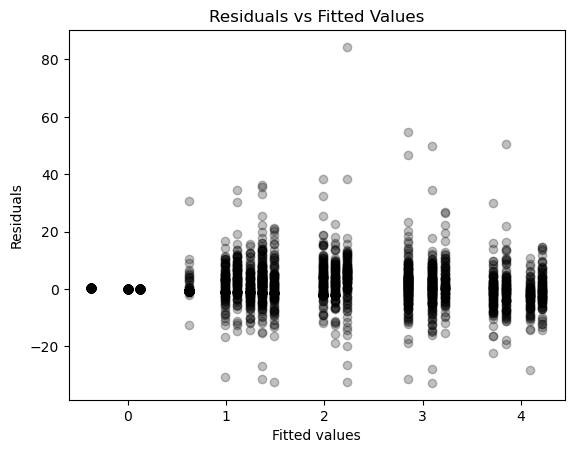

Significant regression for:  ['cooking', [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', 'energy_use_kg_kgdp', [], 'gdp_over_energy_const_2017', 'gdp_over_energy', [], []]

Not significant regression for:  [[], 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', 'energy_intensity', [], [], 'fossil_fual_comsumption', [], [], 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against AR-index [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C

In [370]:
indicators = data.columns.tolist()[5:32]
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = quantile_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

In [371]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a dataframe

In [372]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,cooking,Yes
1,AR-index,electric_consumption,Yes
2,AR-index,energy_use_kg_capita,Yes
3,AR-index,energy_use_kg_kgdp,Yes
4,AR-index,gdp_over_energy_const_2017,Yes
5,AR-index,gdp_over_energy,Yes
6,AR-index,rural_cooking,No
7,AR-index,urban_cooking,No
8,AR-index,electricy,No
9,AR-index,rural_electricy,No


# Regressions with log diff of indicators

- Only significant regressions and assumptions are printed 

In [373]:
# data = pd.read_csv('data/indicators_citations_bulk_df.csv')
# data = pd.read_csv('data/dist_calc_citations_bulk_df.csv') 
# data = pd.read_csv('data/pc_change_citations_bulk_df.csv')
data = pd.read_csv('data/log_diff_citations_bulk_df.csv')
income = pd.read_csv('data/wdi_incomelevels.csv')

#all zeros for citations were dropped in building the data frame
data['log_2_Years'] = np.log(data['2 years window'])

#merge with income
income['Country'] = income['Country'].str.lower()
income = income.rename(columns={'Country': 'Country Name'})
data = pd.merge(data, income, on=['Country Name'], how='left') 

#change column names to prevent patsy error issue with quantile regression
data = data.rename(columns={'energy_use(kg/capita)': 'energy_use_kg_capita'})
data = data.rename(columns={'energy_use(kg/kGDP)': 'energy_use_kg_kgdp'})
data = data.rename(columns={'GDP/Energy(constrant_2017)': 'gdp_over_energy_const_2017'}) 
data = data.rename(columns={'GDP/Energy': 'gdp_over_energy'})
data = data.rename(columns={'ar index bulk': 'ar_index_bulk'})
data.head(4)

,Unnamed: 0,Year,2 years window,ar_index_bulk,Country Name,cooking,rural_cooking,urban_cooking,electricy,rural_electricy,...,energy_intensity,energy_use_kg_capita,energy_use_kg_kgdp,fossil_fual_comsumption,gdp_over_energy_const_2017,gdp_over_energy,renewable_output,renewable_comsumption,log_2_Years,Economy Level
0,0,1991,6.0,0.875595,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.791759,NaN
1,1,1992,2.0,0.454859,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.693147,NaN
2,2,1993,4.0,0.823754,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.386294,NaN
3,3,1994,6.0,1.122167,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.791759,NaN


## Simple Linear Regressions

### - log_2_years

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

electric_consumption vs log_2_Years


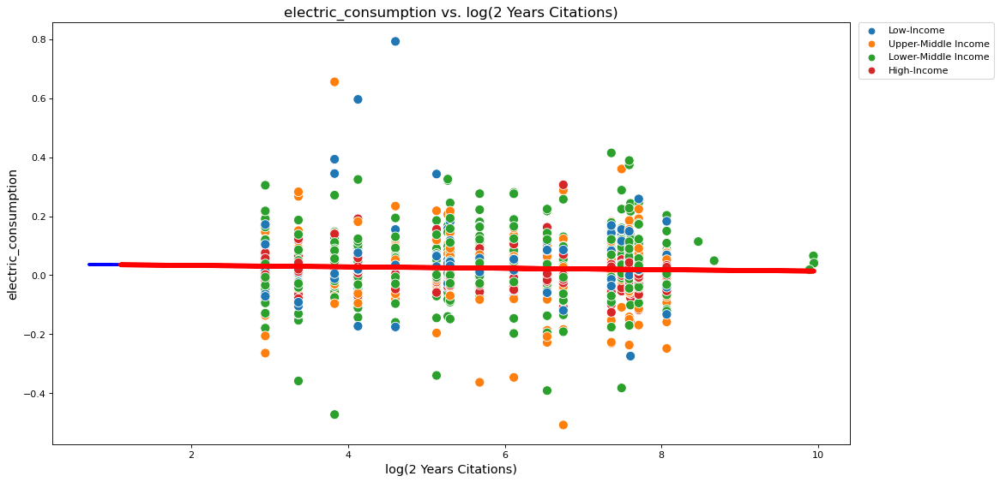

                             OLS Regression Results                             
Dep. Variable:     electric_consumption   R-squared:                       0.003
Model:                              OLS   Adj. R-squared:                  0.002
Method:                   Least Squares   F-statistic:                     5.043
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):             0.0248
Time:                          20:37:23   Log-Likelihood:                 2157.2
No. Observations:                  1767   AIC:                            -4310.
Df Residuals:                      1765   BIC:                            -4299.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0381      0.

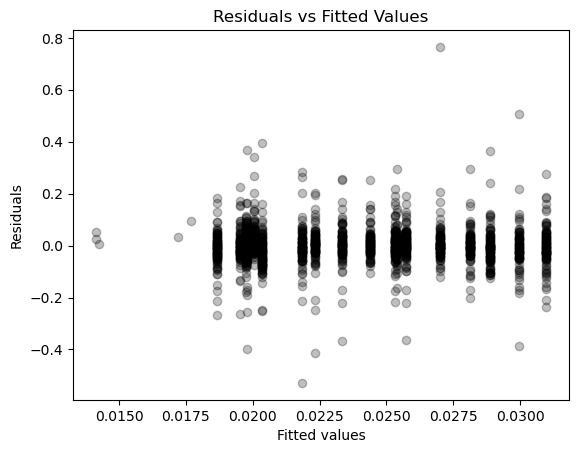

Residuals-- checking normality


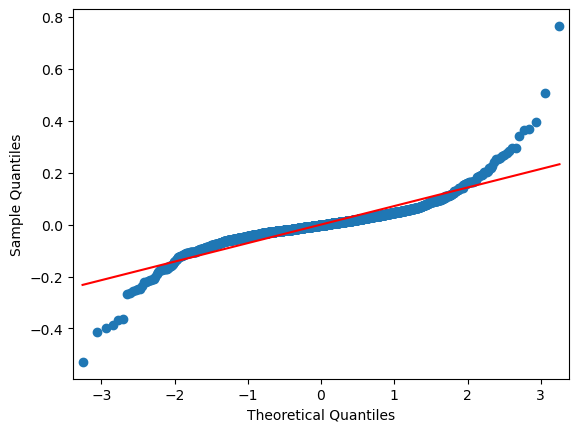

Residuals are not normal
energy_use_kg_capita vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

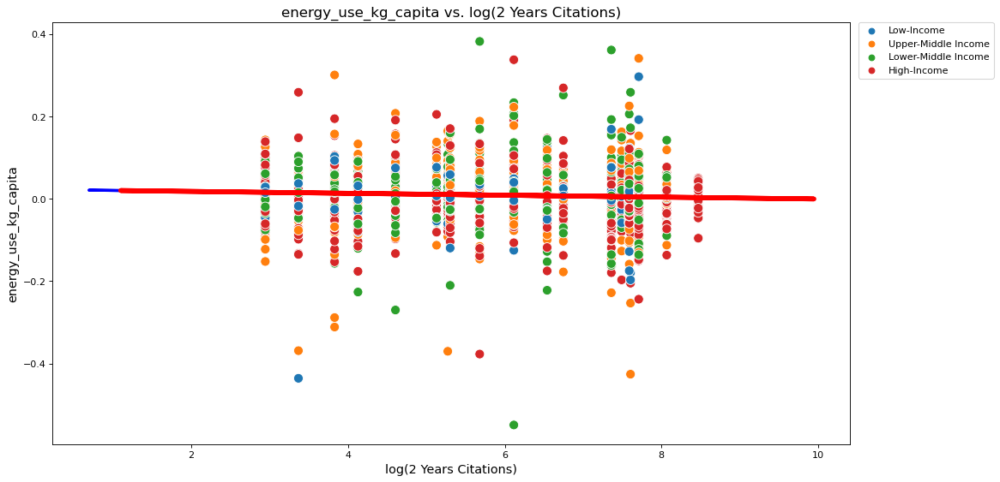

                             OLS Regression Results                             
Dep. Variable:     energy_use_kg_capita   R-squared:                       0.003
Model:                              OLS   Adj. R-squared:                  0.003
Method:                   Least Squares   F-statistic:                     5.619
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):             0.0179
Time:                          20:37:23   Log-Likelihood:                 2411.0
No. Observations:                  1841   AIC:                            -4818.
Df Residuals:                      1839   BIC:                            -4807.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0224      0.

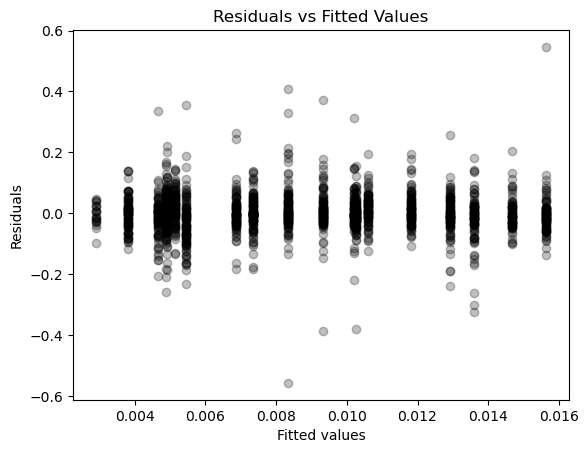

Residuals-- checking normality


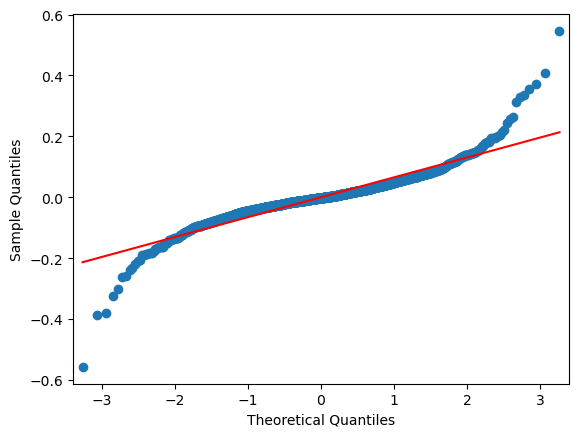

Residuals are not normal
Significant regression for:  [[], [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], [], [], [], [], []]

Not significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', 'energy_intensity', [], 'energy_use_kg_kgdp', 'fossil_fual_comsumption', 'gdp_over_energy_const_2017', 'gdp_over_energy', 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against log(2 years) [[], [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], [], [], [], [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1494620813.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

In [374]:
indicators = data.columns.tolist()[5:32] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', '2 years window', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)

In [375]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in dataframe

In [376]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,electric_consumption,Yes
1,log_2_years,energy_use_kg_capita,Yes
2,log_2_years,cooking,No
3,log_2_years,rural_cooking,No
4,log_2_years,urban_cooking,No
5,log_2_years,electricy,No
6,log_2_years,rural_electricy,No
7,log_2_years,urban_electricy,No
8,log_2_years,nuclear_energy,No
9,log_2_years,combustiable_renewable_waste,No


### Plotting non significant indicators against log_2_years

In [377]:
# #colored by economy level
# for i in models_not_sig['indicator']:
    
#     print(i+' vs log_2_years')
#     plt.figure(figsize=(15, 8), dpi=80)
#     p1 = sns.scatterplot(x = 'log_2_Years', y = i, data = data, hue='Economy Level', s=100)
#     p1.legend(bbox_to_anchor=(1.01,1.0), loc='upper left', borderaxespad=0)#,borderaxespad = 0., ncol = 1)
#     plt.xlabel('log_2_years', fontsize=13)
#     plt.ylabel(i, fontsize=13)
#     plt.title(i +' vs log_2_years', fontsize=15)

#     plt.show()

### - AR-index

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

electric_consumption vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

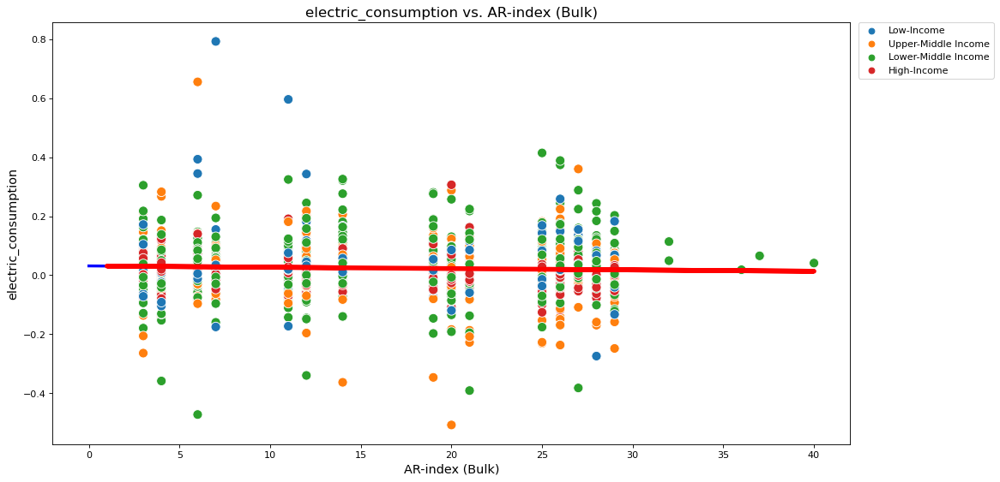

                             OLS Regression Results                             
Dep. Variable:     electric_consumption   R-squared:                       0.003
Model:                              OLS   Adj. R-squared:                  0.002
Method:                   Least Squares   F-statistic:                     5.136
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):             0.0236
Time:                          20:37:24   Log-Likelihood:                 2157.3
No. Observations:                  1767   AIC:                            -4311.
Df Residuals:                      1765   BIC:                            -4300.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0316  

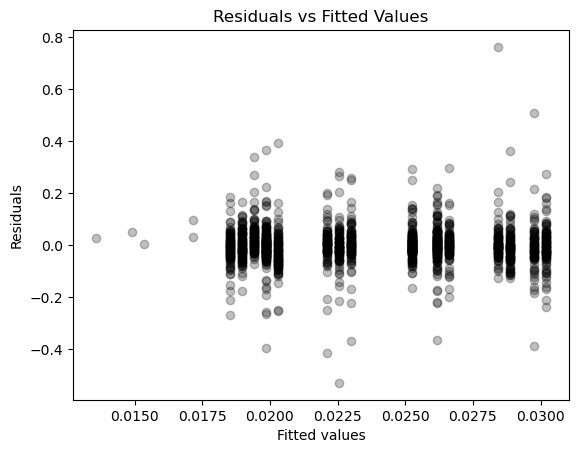

Residuals-- checking normality


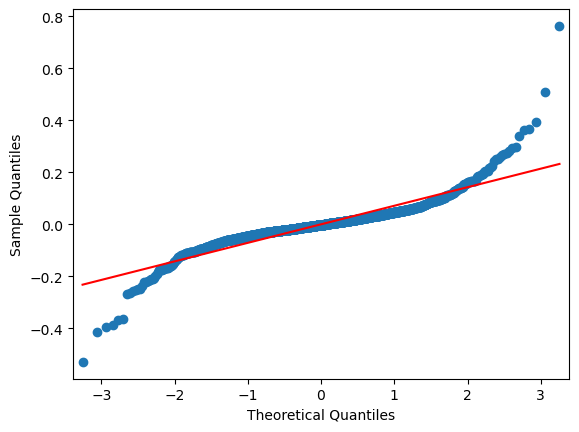

Residuals are not normal
energy_use_kg_capita vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

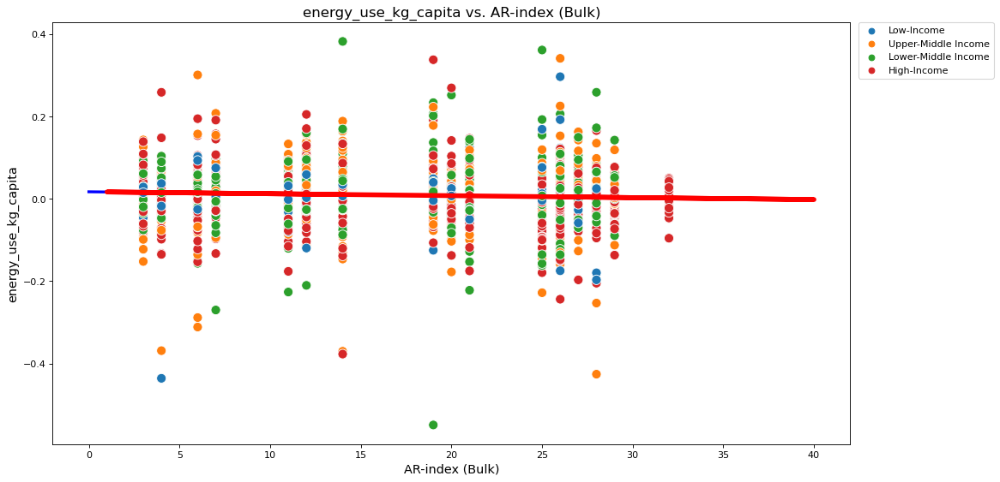

                             OLS Regression Results                             
Dep. Variable:     energy_use_kg_capita   R-squared:                       0.004
Model:                              OLS   Adj. R-squared:                  0.003
Method:                   Least Squares   F-statistic:                     6.869
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):            0.00884
Time:                          20:37:25   Log-Likelihood:                 2411.6
No. Observations:                  1841   AIC:                            -4819.
Df Residuals:                      1839   BIC:                            -4808.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0169  

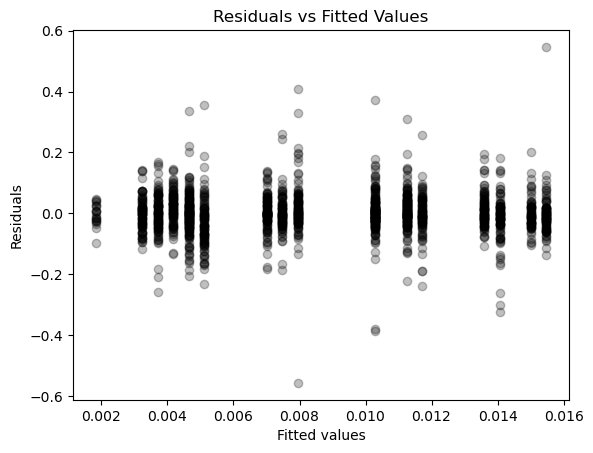

Residuals-- checking normality


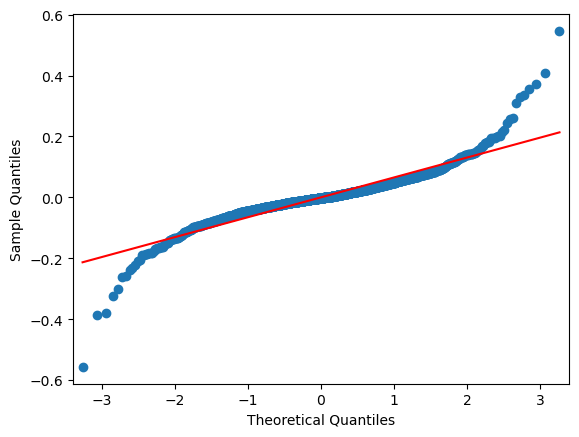

Residuals are not normal
Significant regression for:  [[], [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], [], [], [], [], []]

Not significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', 'energy_intensity', [], 'energy_use_kg_kgdp', 'fossil_fual_comsumption', 'gdp_over_energy_const_2017', 'gdp_over_energy', 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against AR-index [[], [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], [], [], [], [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1445102313.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

In [378]:
indicators = data.columns.tolist()[5:32]
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

In [379]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a dataframe

In [380]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,electric_consumption,Yes
1,AR-index,energy_use_kg_capita,Yes
2,AR-index,cooking,No
3,AR-index,rural_cooking,No
4,AR-index,urban_cooking,No
5,AR-index,electricy,No
6,AR-index,rural_electricy,No
7,AR-index,urban_electricy,No
8,AR-index,nuclear_energy,No
9,AR-index,combustiable_renewable_waste,No


## Quantile Regressions

### - log_2_years

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Us

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:212: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, k

electric_consumption vs log_2_Years


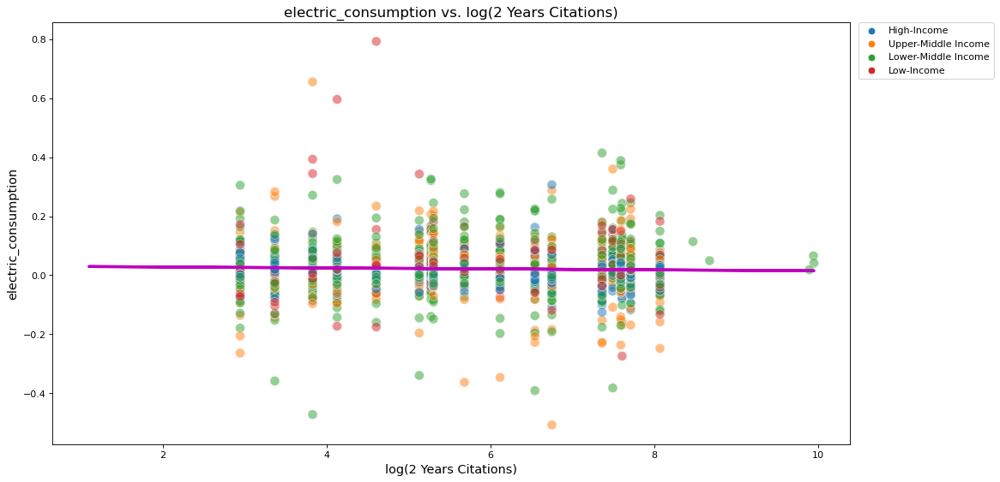

                          QuantReg Regression Results                           
Dep. Variable:     electric_consumption   Pseudo R-squared:             0.001590
Model:                         QuantReg   Bandwidth:                     0.01679
Method:                   Least Squares   Sparsity:                       0.1047
Date:                  Sat, 17 Dec 2022   No. Observations:                 2022
Time:                          20:37:26   Df Residuals:                     2020
                                          Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0313      0.004      6.970      0.000       0.022       0.040
log_2_Years    -0.0016      0.001     -2.214      0.027      -0.003      -0.000

Residuals vs Fitted Values-- looking for heteroskedascity


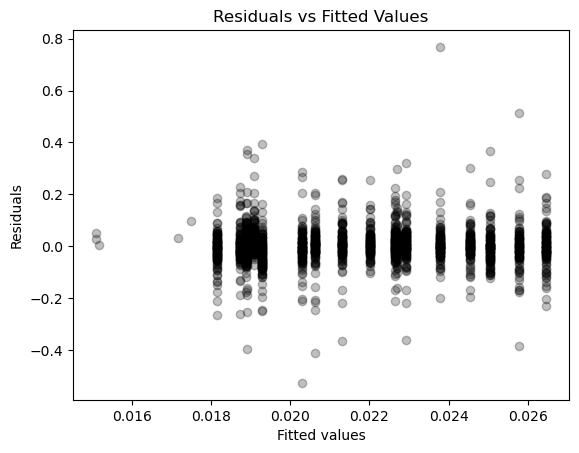

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Us

gdp_over_energy vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


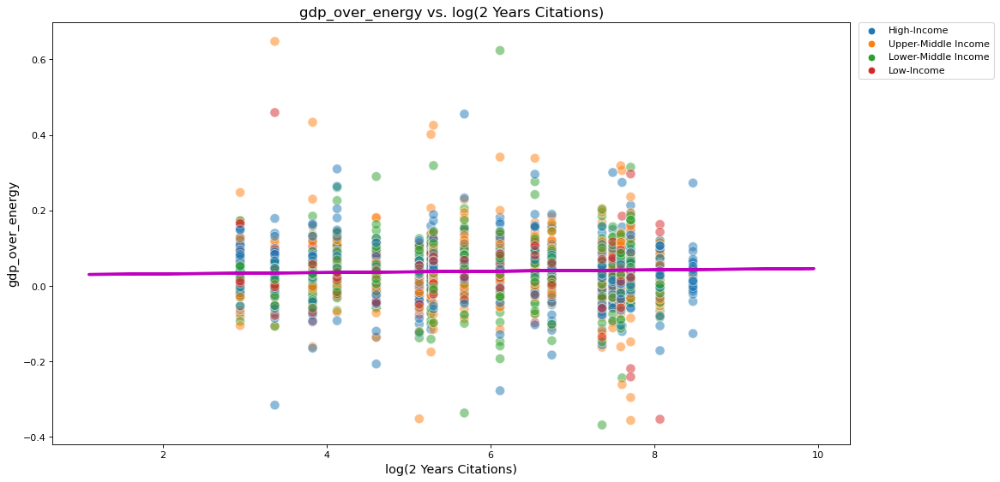

                         QuantReg Regression Results                          
Dep. Variable:        gdp_over_energy   Pseudo R-squared:             0.001801
Model:                       QuantReg   Bandwidth:                     0.01852
Method:                 Least Squares   Sparsity:                       0.1130
Date:                Sat, 17 Dec 2022   No. Observations:                 2038
Time:                        20:37:27   Df Residuals:                     2036
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0283      0.005      5.753      0.000       0.019       0.038
log_2_Years     0.0018      0.001      2.191      0.029       0.000       0.003

Residuals vs Fitted Values-- looking for heteroskedascity


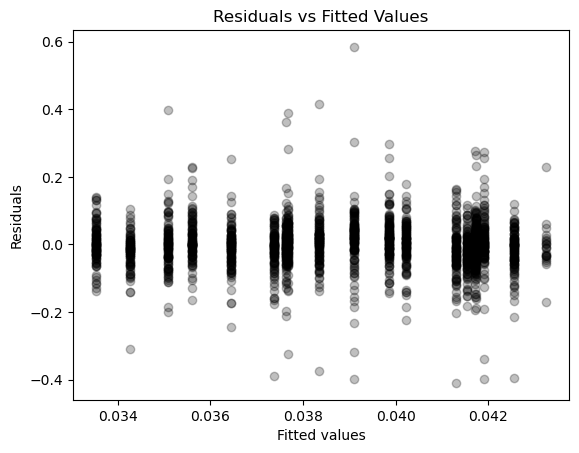

Significant regression for:  [[], [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], 'gdp_over_energy', [], []]

Not significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', 'energy_intensity', 'energy_use_kg_capita', 'energy_use_kg_kgdp', 'fossil_fual_comsumption', 'gdp_over_energy_const_2017', [], 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against log(2 years) [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:212: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\3418212678.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['l

In [381]:
indicators = data.columns.tolist()[5:32] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]
    

    sig, not_sig,resids_not_normal = quantile_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)

In [382]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a dataframe

In [383]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,electric_consumption,Yes
1,log_2_years,gdp_over_energy,Yes
2,log_2_years,cooking,No
3,log_2_years,rural_cooking,No
4,log_2_years,urban_cooking,No
5,log_2_years,electricy,No
6,log_2_years,rural_electricy,No
7,log_2_years,urban_electricy,No
8,log_2_years,nuclear_energy,No
9,log_2_years,combustiable_renewable_waste,No


### - AR-index

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C

electric_consumption vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:212: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_d

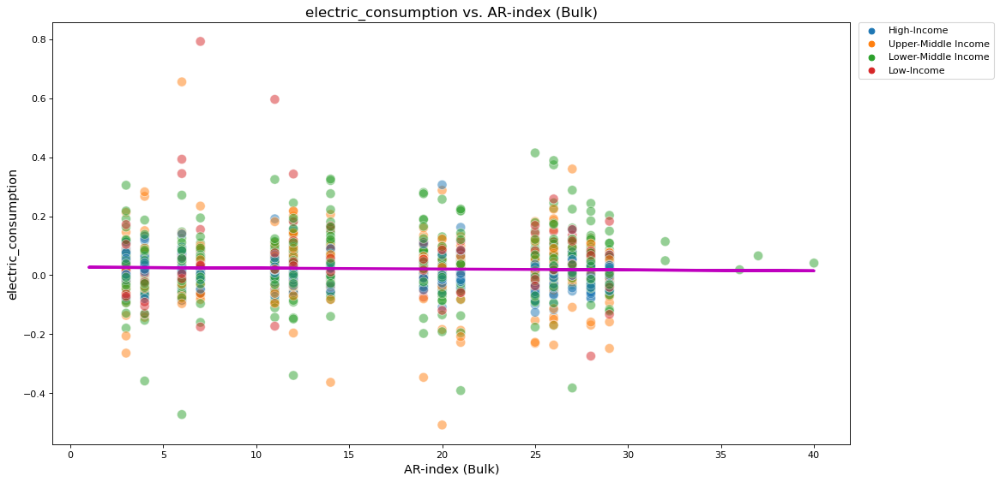

                          QuantReg Regression Results                           
Dep. Variable:     electric_consumption   Pseudo R-squared:             0.001327
Model:                         QuantReg   Bandwidth:                     0.01669
Method:                   Least Squares   Sparsity:                       0.1044
Date:                  Sat, 17 Dec 2022   No. Observations:                 2022
Time:                          20:37:28   Df Residuals:                     2020
                                          Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.0273      0.003     10.532      0.000       0.022       0.032
ar_index_bulk    -0.0003      0.000     -2.280      0.023      -0.001   -4.33e-05

Residuals vs Fitted Values-- looking for heteroskedascity


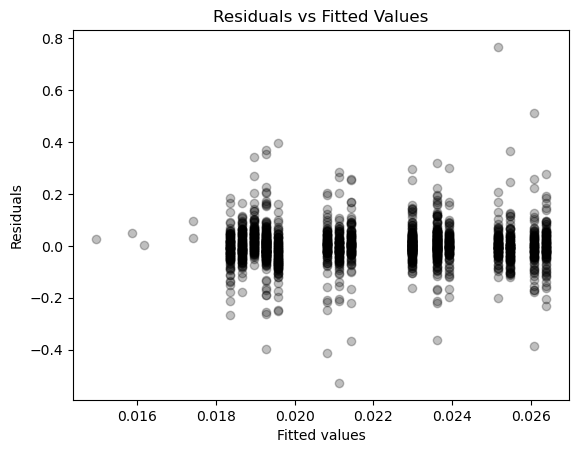

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C

gdp_over_energy vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

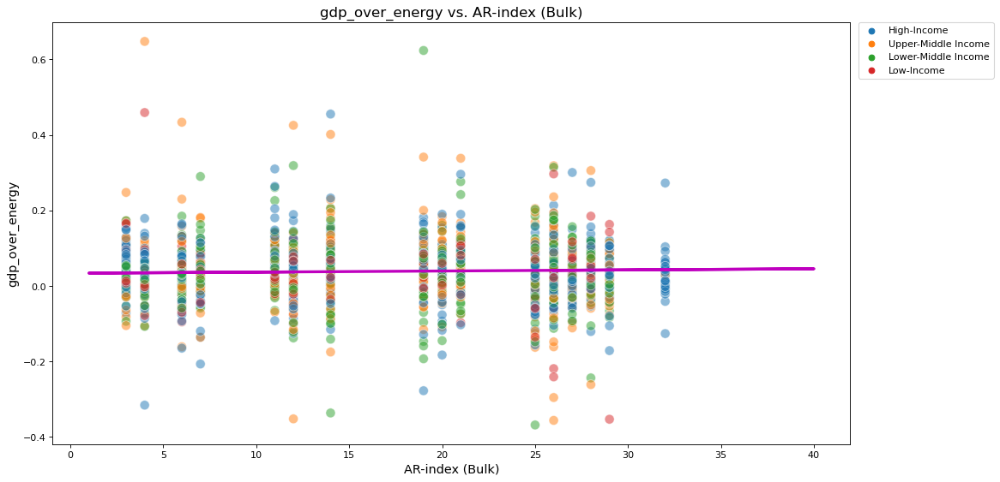

                         QuantReg Regression Results                          
Dep. Variable:        gdp_over_energy   Pseudo R-squared:             0.001605
Model:                       QuantReg   Bandwidth:                     0.01850
Method:                 Least Squares   Sparsity:                       0.1133
Date:                Sat, 17 Dec 2022   No. Observations:                 2038
Time:                        20:37:29   Df Residuals:                     2036
                                        Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.0335      0.003     11.747      0.000       0.028       0.039
ar_index_bulk     0.0003      0.000      1.978      0.048    2.57e-06       0.001

Residuals vs Fitted Values-- looking for heteroskedascity


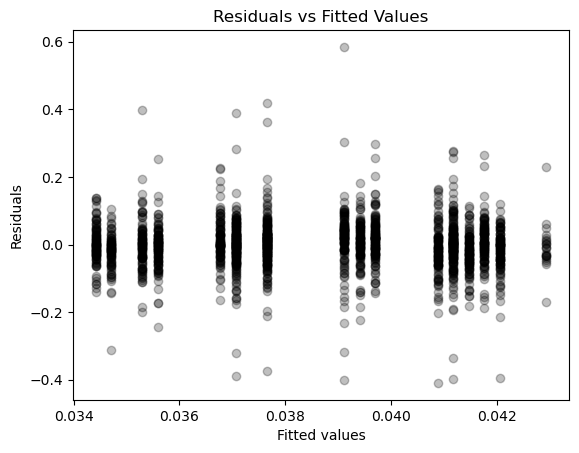

Significant regression for:  [[], [], [], [], [], [], [], [], 'electric_consumption', [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], 'gdp_over_energy', [], []]

Not significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'nuclear_energy', 'combustiable_renewable_waste', [], 'eletric_loss', 'coal', 'hydroeletric', 'natrual_gas', 'nuclear', 'oil', 'oil_gas_coal', 'electric_from_renuable', 'electric_from_renuable_kwh', 'energy_import', 'energy_intensity', 'energy_use_kg_capita', 'energy_use_kg_kgdp', 'fossil_fual_comsumption', 'gdp_over_energy_const_2017', [], 'renewable_output', 'renewable_comsumption']

Residuals are not normal when the following indicators are plotted against AR-index [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\anaconda3\lib\site-packages\numpy\core\_methods.py:212: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\4029027984.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_d

In [384]:
indicators = data.columns.tolist()[5:32]
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = quantile_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

In [385]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a dataframe

In [386]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,electric_consumption,Yes
1,AR-index,gdp_over_energy,Yes
2,AR-index,cooking,No
3,AR-index,rural_cooking,No
4,AR-index,urban_cooking,No
5,AR-index,electricy,No
6,AR-index,rural_electricy,No
7,AR-index,urban_electricy,No
8,AR-index,nuclear_energy,No
9,AR-index,combustiable_renewable_waste,No


# Regressions with distance measure of indicators

- Only significant regressions and assumptions are printed 

In [416]:
# data = pd.read_csv('data/indicators_citations_bulk_df.csv')
data = pd.read_csv('data/dist_calc_citations_bulk_df.csv')
# data = pd.read_csv('data/pc_change_citations_bulk_df.csv')
income = pd.read_csv('data/wdi_incomelevels.csv')

#all zeros for citations were dropped in building the data frame
data['log_2_Years'] = np.log(data['2 years window'])

#merge with income
income['Country'] = income['Country'].str.lower()
income = income.rename(columns={'Country': 'Country Name'})
data = pd.merge(data, income, on=['Country Name'], how='left') 

#change column names to prevent patsy error issue with quantile regression
data = data.rename(columns={'energy_use(kg/capita)': 'energy_use_kg_capita'})
data = data.rename(columns={'energy_use(kg/kGDP)': 'energy_use_kg_kgdp'})
data = data.rename(columns={'GDP/Energy(constrant_2017)': 'gdp_over_energy_const_2017'}) 
data = data.rename(columns={'GDP/Energy': 'gdp_over_energy'})
data = data.rename(columns={'ar index bulk': 'ar_index_bulk'})
data.head(4)

,Unnamed: 0,Year,2 years window,ar_index_bulk,Country Name,cooking,rural_cooking,urban_cooking,electricy,rural_electricy,urban_electricy,coal,oil_gas_coal,energy_use_kg_capita,fossil_fual_comsumption,renewable_output,renewable_comsumption,log_2_Years,Economy Level
0,0,1996,4.0,1.232883,afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.386294,Low-Income
1,1,1996,4.0,1.232883,albania,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,7.012904,0.0,0.000000,0.000000,1.386294,Upper-Middle Income
2,2,1996,4.0,1.232883,algeria,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,6.878627,0.0,1.095467,0.768942,1.386294,Lower-Middle Income
3,3,1996,4.0,1.232883,american samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.114312,0.781024,1.386294,Upper-Middle Income


In [388]:
data.shape

(5450, 19)

## Simple Linear Regressions

### - log_2_years

cooking vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1139909653.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


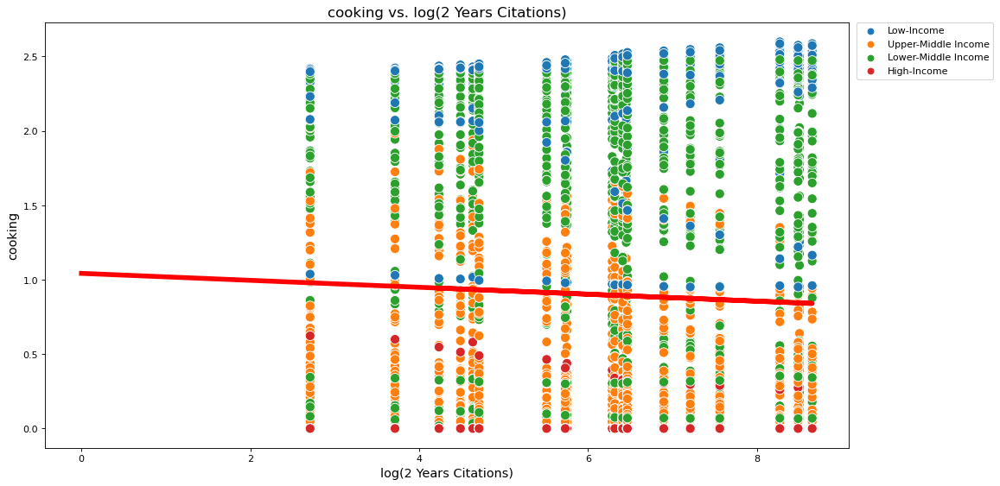

                            OLS Regression Results                            
Dep. Variable:                cooking   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     4.168
Date:                Sat, 17 Dec 2022   Prob (F-statistic):             0.0413
Time:                        20:37:29   Log-Likelihood:                -3909.7
No. Observations:                2797   AIC:                             7823.
Df Residuals:                    2795   BIC:                             7835.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.0424      0.073     14.365      

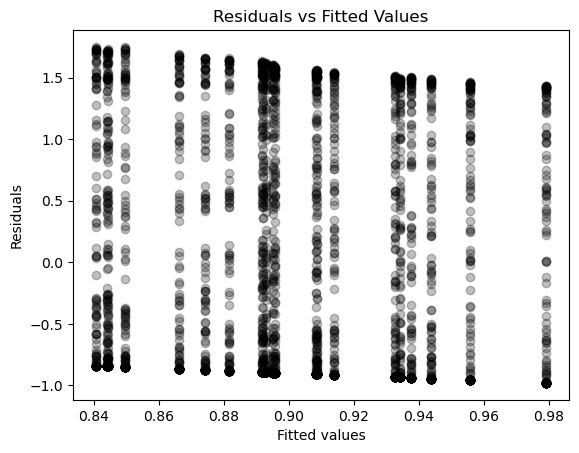

Residuals-- checking normality


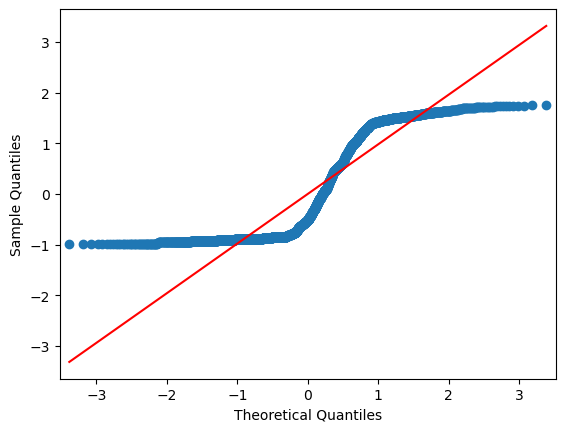

Residuals are not normal
rural_cooking vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1139909653.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


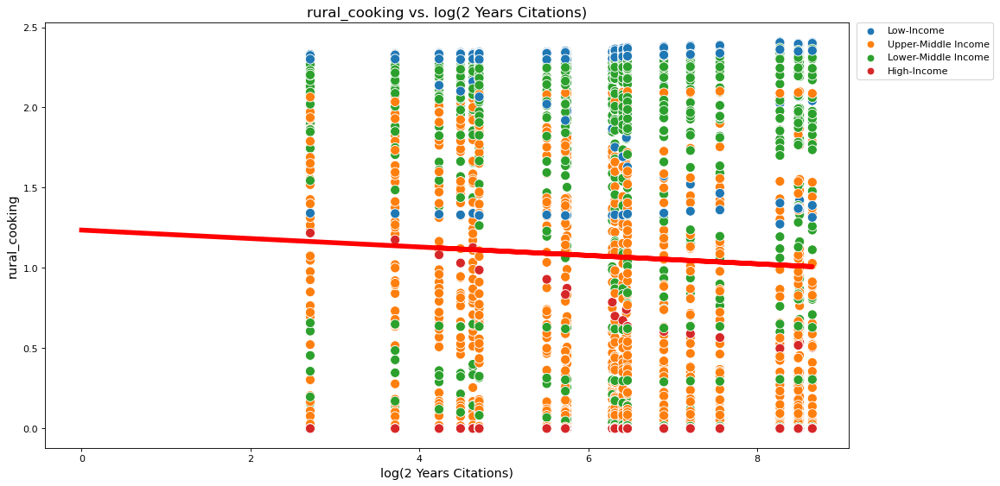

                            OLS Regression Results                            
Dep. Variable:          rural_cooking   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     5.052
Date:                Sat, 17 Dec 2022   Prob (F-statistic):             0.0247
Time:                        20:37:30   Log-Likelihood:                -3951.7
No. Observations:                2783   AIC:                             7907.
Df Residuals:                    2781   BIC:                             7919.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.2361      0.074     16.623      

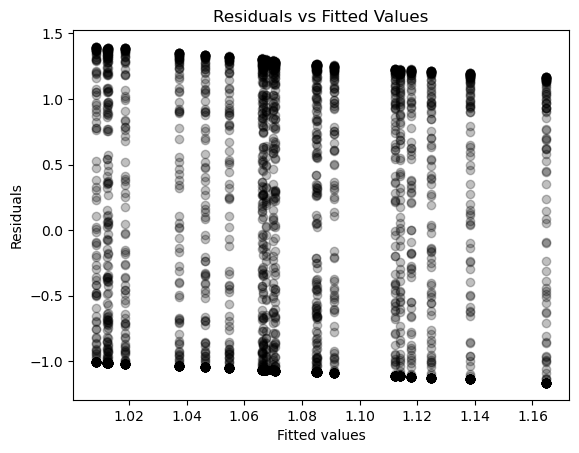

Residuals-- checking normality


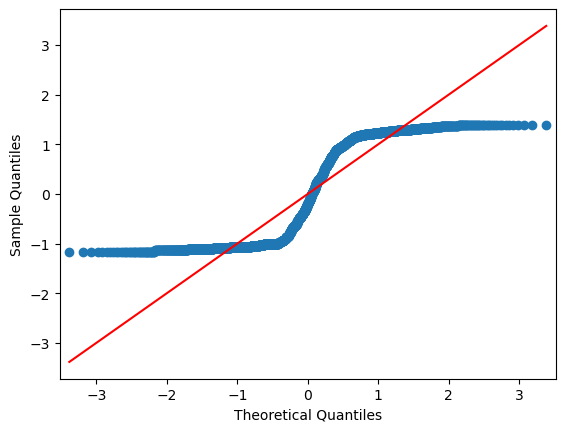

Residuals are not normal
Significant regression for:  ['cooking', 'rural_cooking', [], []]

Not significant regression for:  [[], [], 'urban_cooking', 'electricy']

Residuals are not normal when the following indicators are plotted against log(2 years) ['cooking', 'rural_cooking', [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1139909653.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1139909653.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


In [389]:
indicators = data.columns.tolist()[5:9] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', '2 years window', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)

In [390]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in dataframe

In [391]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,cooking,Yes
1,log_2_years,rural_cooking,Yes
2,log_2_years,urban_cooking,No
3,log_2_years,electricy,No


### Plotting non significant indicators against log_2_years

In [392]:
# #colored by economy level
# for i in models_not_sig['indicator']:
    
#     print(i+' vs log_2_years')
#     plt.figure(figsize=(15, 8), dpi=80)
#     p1 = sns.scatterplot(x = 'log_2_Years', y = i, data = data, hue='Economy Level', s=100)
#     p1.legend(bbox_to_anchor=(1.01,1.0), loc='upper left', borderaxespad=0)#,borderaxespad = 0., ncol = 1)
#     plt.xlabel('log_2_years', fontsize=13)
#     plt.ylabel(i, fontsize=13)
#     plt.title(i +' vs log_2_years', fontsize=15)

#     plt.show()

### - AR-index

In [393]:
indicators = data.columns.tolist()[5:9]
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

Significant regression for:  [[], [], [], []]

Not significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', 'electricy']

Residuals are not normal when the following indicators are plotted against AR-index [[], [], [], []]


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1312914605.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1312914605.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1312914605.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

In [394]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a dataframe

In [395]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,cooking,No
1,AR-index,rural_cooking,No
2,AR-index,urban_cooking,No
3,AR-index,electricy,No


## Quantile Regressions

### - log_2_years

C:\Users\maham\AppData\Local\Temp\ipykernel_23060\2245653579.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\2245653579.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


rural_cooking vs log_2_Years


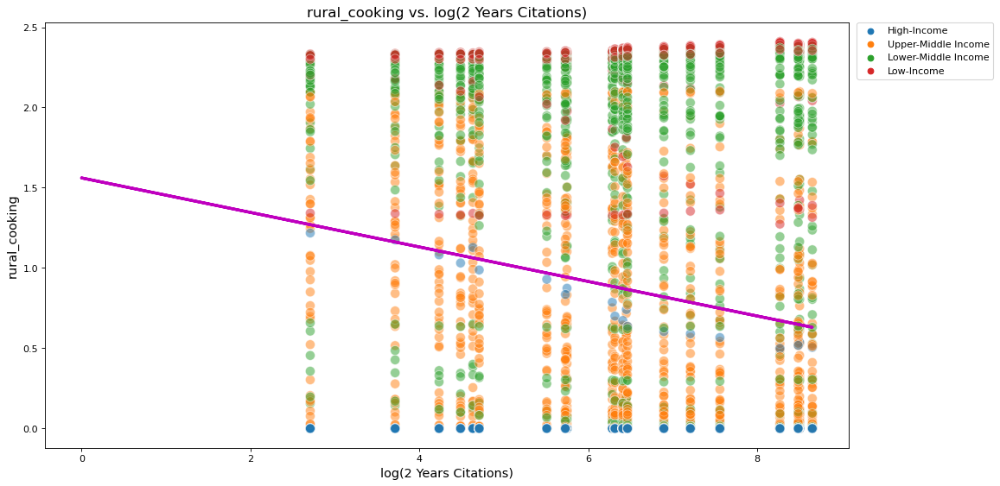

                         QuantReg Regression Results                          
Dep. Variable:          rural_cooking   Pseudo R-squared:             0.004396
Model:                       QuantReg   Bandwidth:                      0.3326
Method:                 Least Squares   Sparsity:                        7.219
Date:                Sat, 17 Dec 2022   No. Observations:                 3195
Time:                        20:37:31   Df Residuals:                     3193
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       1.5611      0.250      6.235      0.000       1.070       2.052
log_2_Years    -0.1075      0.039     -2.722      0.007      -0.185      -0.030

Residuals vs Fitted Values-- looking for heteroskedascity


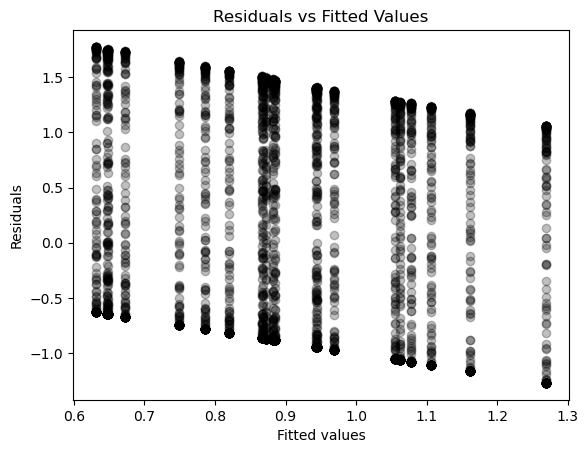

electricy vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\2245653579.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\2245653579.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)


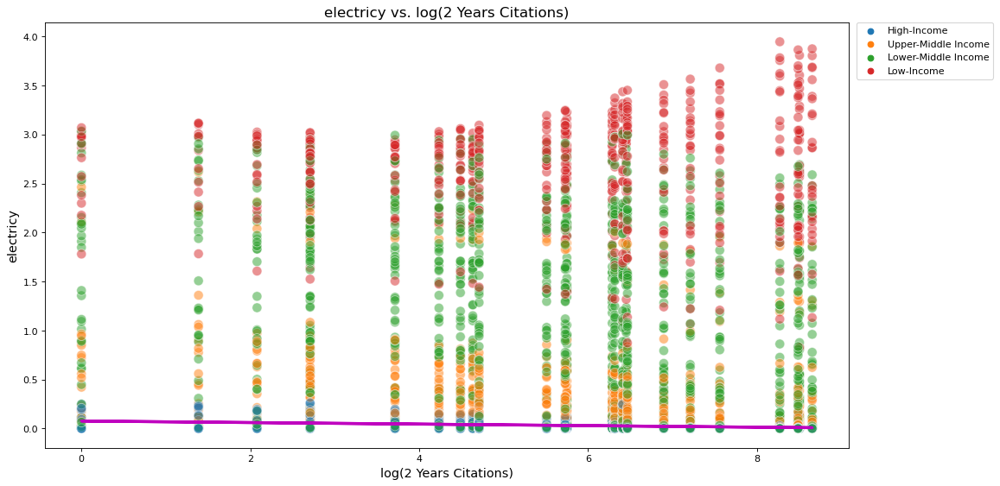

                         QuantReg Regression Results                          
Dep. Variable:              electricy   Pseudo R-squared:            0.0006047
Model:                       QuantReg   Bandwidth:                      0.2396
Method:                 Least Squares   Sparsity:                       0.5396
Date:                Sat, 17 Dec 2022   No. Observations:                 4140
Time:                        20:37:32   Df Residuals:                     4138
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0761      0.012      6.585      0.000       0.053       0.099
log_2_Years    -0.0078      0.002     -4.053      0.000      -0.012      -0.004

Residuals vs Fitted Values-- looking for heteroskedascity


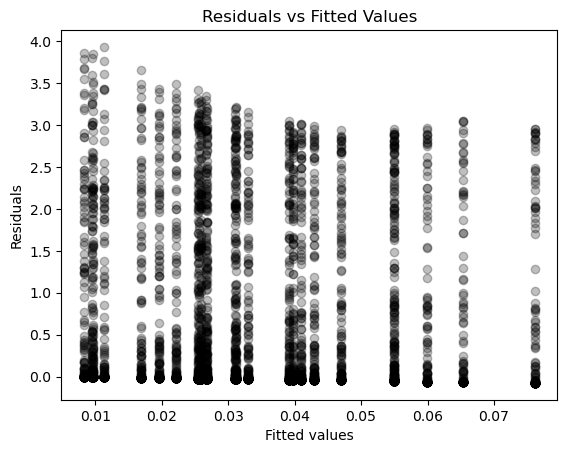

Significant regression for:  [[], 'rural_cooking', [], 'electricy']

Not significant regression for:  ['cooking', [], 'urban_cooking', []]

Residuals are not normal when the following indicators are plotted against log(2 years) [[], [], [], []]


In [396]:
indicators = data.columns.tolist()[5:9] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]
    

    sig, not_sig,resids_not_normal = quantile_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)

### Storing results in a dataframe

In [397]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,rural_cooking,Yes
1,log_2_years,electricy,Yes
2,log_2_years,cooking,No
3,log_2_years,urban_cooking,No


### - AR-index

rural_cooking vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1017963614.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1017963614.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


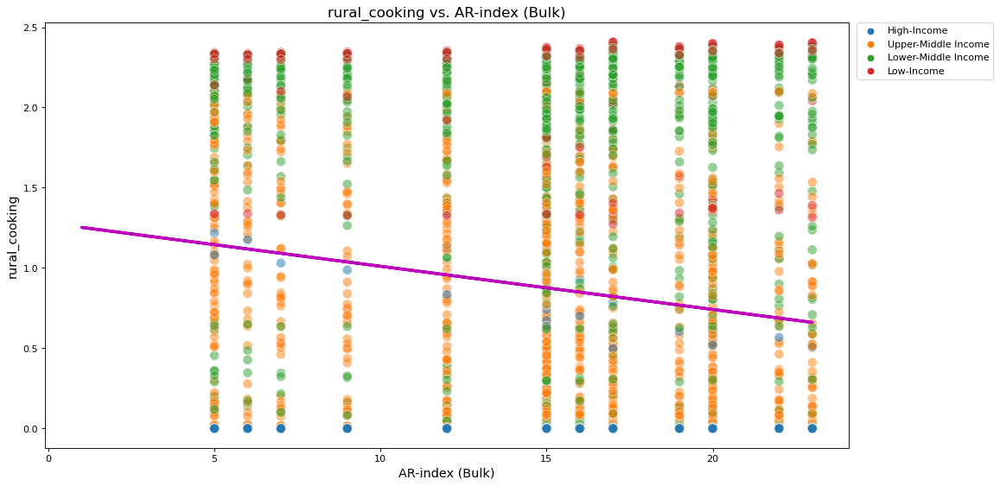

                         QuantReg Regression Results                          
Dep. Variable:          rural_cooking   Pseudo R-squared:             0.002849
Model:                       QuantReg   Bandwidth:                      0.3326
Method:                 Least Squares   Sparsity:                        7.154
Date:                Sat, 17 Dec 2022   No. Observations:                 3195
Time:                        20:37:33   Df Residuals:                     3193
                                        Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.2796      0.182      7.017      0.000       0.922       1.637
ar_index_bulk    -0.0269      0.012     -2.289      0.022      -0.050      -0.004

Residuals vs Fitted Values-- looking for heteroskedascity


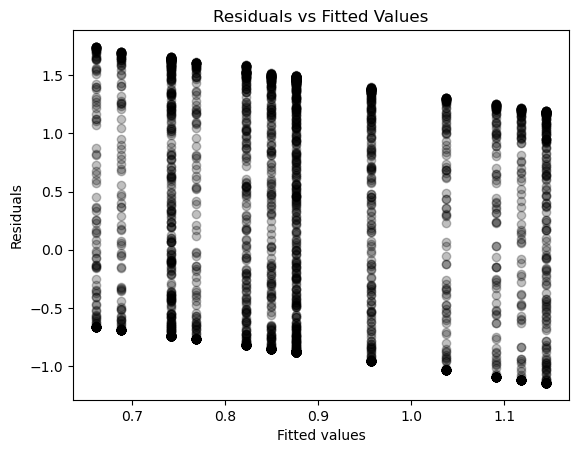

electricy vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1017963614.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1017963614.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


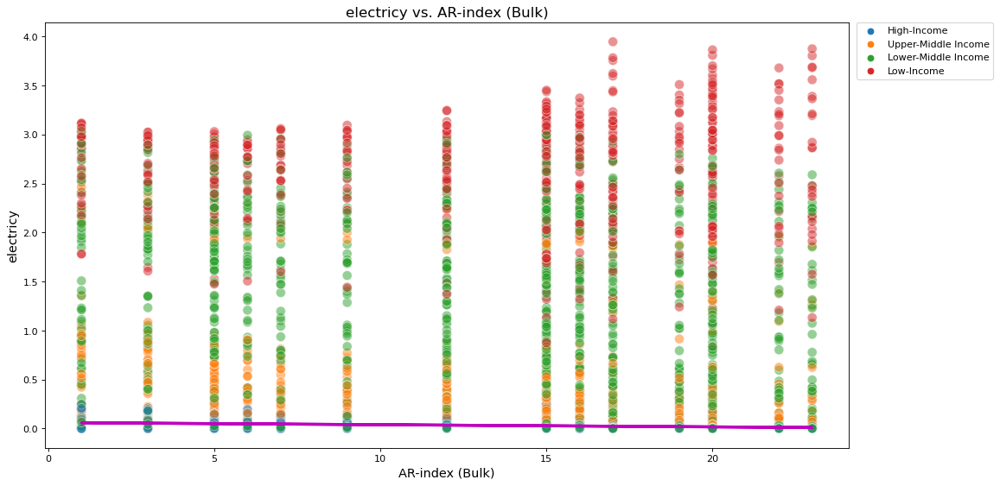

                         QuantReg Regression Results                          
Dep. Variable:              electricy   Pseudo R-squared:            0.0004402
Model:                       QuantReg   Bandwidth:                      0.2400
Method:                 Least Squares   Sparsity:                       0.5395
Date:                Sat, 17 Dec 2022   No. Observations:                 4140
Time:                        20:37:33   Df Residuals:                     4138
                                        Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.0608      0.009      6.494      0.000       0.042       0.079
ar_index_bulk    -0.0022      0.001     -3.447      0.001      -0.003      -0.001

Residuals vs Fitted Values-- looking for heteroskedascity


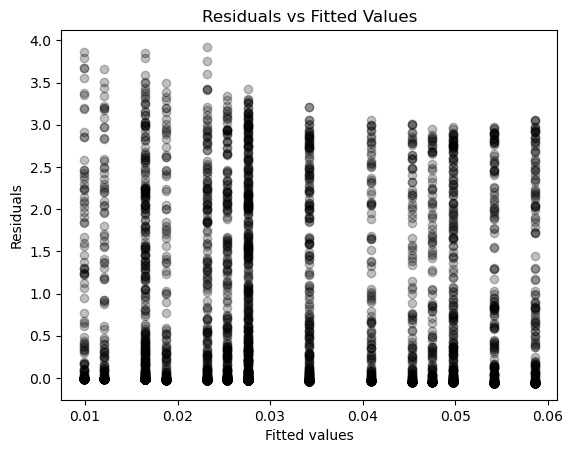

Significant regression for:  [[], 'rural_cooking', [], 'electricy']

Not significant regression for:  ['cooking', [], 'urban_cooking', []]

Residuals are not normal when the following indicators are plotted against AR-index [[], [], [], []]


In [398]:
indicators = data.columns.tolist()[5:9]
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = quantile_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

### Storing results in a dataframe

In [399]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,rural_cooking,Yes
1,AR-index,electricy,Yes
2,AR-index,cooking,No
3,AR-index,urban_cooking,No


### only OECD countries

In [400]:
##oecd

# data = pd.read_csv('data/indicators_citations_bulk_df.csv')
data = pd.read_csv('data/dist_calc_oecd_citations_bulk_df.csv')
# data = pd.read_csv('data/pc_change_citations_bulk_df.csv')
income = pd.read_csv('data/wdi_incomelevels.csv')

#all zeros for citations were dropped in building the data frame
data['log_2_Years'] = np.log(data['2 years window'])

#merge with income
income['Country'] = income['Country'].str.lower()
income = income.rename(columns={'Country': 'Country Name'})
data = pd.merge(data, income, on=['Country Name'], how='left') 

#change column names to prevent patsy error issue with quantile regression
data = data.rename(columns={'energy_use(kg/capita)': 'energy_use_kg_capita'})
data = data.rename(columns={'energy_use(kg/kGDP)': 'energy_use_kg_kgdp'})
data = data.rename(columns={'GDP/Energy(constrant_2017)': 'gdp_over_energy_const_2017'}) 
data = data.rename(columns={'GDP/Energy': 'gdp_over_energy'})
data = data.rename(columns={'ar index bulk': 'ar_index_bulk'})
data.head(4)

,Unnamed: 0,Year,2 years window,ar_index_bulk,Country Name,cooking,rural_cooking,urban_cooking,electricy,rural_electricy,urban_electricy,coal,oil_gas_coal,energy_use_kg_capita,fossil_fual_comsumption,renewable_output,renewable_comsumption,log_2_Years,Economy Level
0,0,1991,6.0,0.875595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.791759,NaN
1,1,1992,2.0,0.454859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.693147,NaN
2,2,1993,4.0,0.823754,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.386294,NaN
3,3,1994,6.0,1.122167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.791759,NaN


In [401]:
data.shape

(955, 19)

In [402]:
(950-756)/950 #dropped where y is nan- for only one y (not sure which)

0.20421052631578948

## Simple Linear Regressions

### - log_2_years

energy_use_kg_capita vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\299692669.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\299692669.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\299692669.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

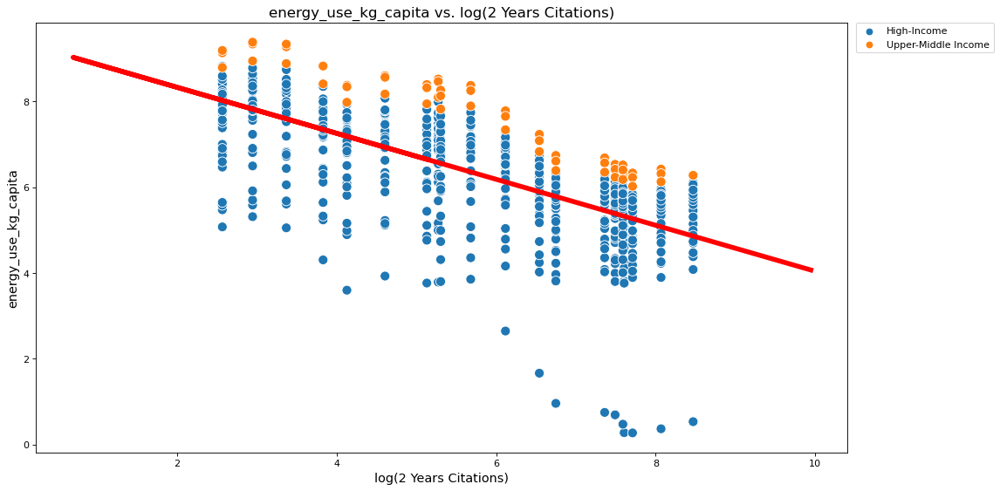

                             OLS Regression Results                             
Dep. Variable:     energy_use_kg_capita   R-squared:                       0.469
Model:                              OLS   Adj. R-squared:                  0.468
Method:                   Least Squares   F-statistic:                     462.6
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):           5.05e-74
Time:                          20:37:34   Log-Likelihood:                -753.12
No. Observations:                   526   AIC:                             1510.
Df Residuals:                       524   BIC:                             1519.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           9.3964      0.

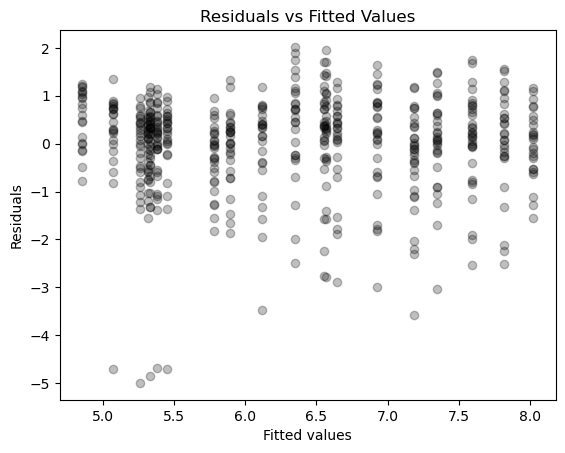

Residuals-- checking normality


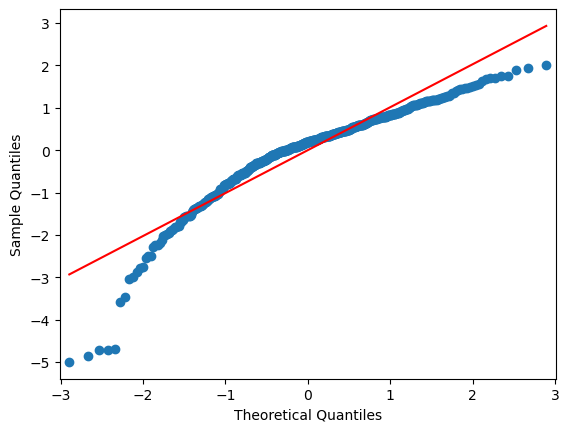

Residuals are not normal
renewable_comsumption vs log_2_Years


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\299692669.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\299692669.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\299692669.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

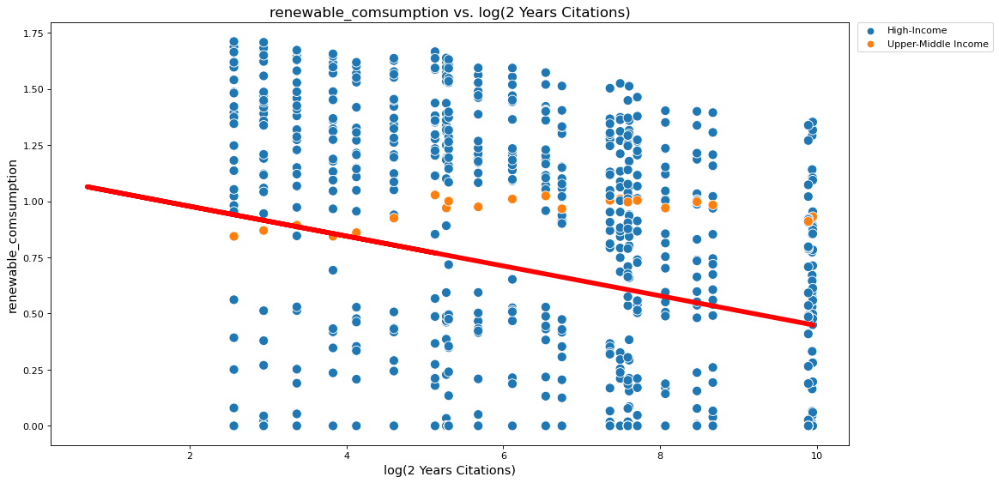

                              OLS Regression Results                             
Dep. Variable:     renewable_comsumption   R-squared:                       0.064
Model:                               OLS   Adj. R-squared:                  0.063
Method:                    Least Squares   F-statistic:                     43.46
Date:                   Sat, 17 Dec 2022   Prob (F-statistic):           9.12e-11
Time:                           20:37:35   Log-Likelihood:                -525.25
No. Observations:                    637   AIC:                             1055.
Df Residuals:                        635   BIC:                             1063.
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.11

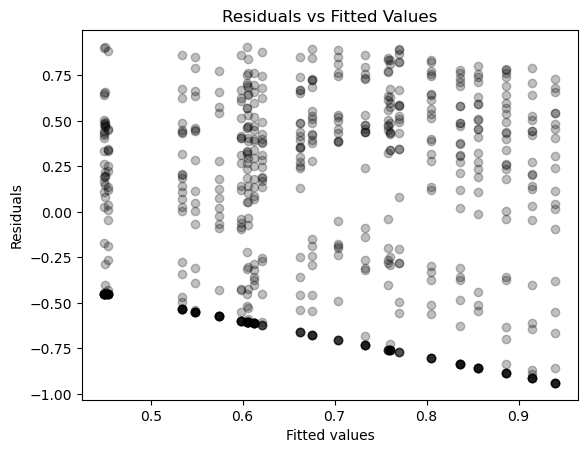

Residuals-- checking normality


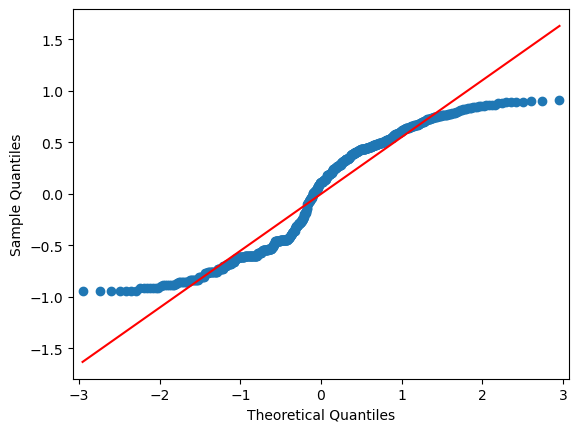

Residuals are not normal
Significant regression for:  [[], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], [], 'renewable_comsumption']

Not significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'coal', 'oil_gas_coal', [], 'fossil_fual_comsumption', 'renewable_output', []]

Residuals are not normal when the following indicators are plotted against log(2 years) [[], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], [], 'renewable_comsumption']


In [403]:
indicators = data.columns.tolist()[5:17] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', '2 years window', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)

In [404]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a data frame

In [405]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,energy_use_kg_capita,Yes
1,log_2_years,renewable_comsumption,Yes
2,log_2_years,cooking,No
3,log_2_years,rural_cooking,No
4,log_2_years,urban_cooking,No
5,log_2_years,electricy,No
6,log_2_years,rural_electricy,No
7,log_2_years,urban_electricy,No
8,log_2_years,coal,No
9,log_2_years,oil_gas_coal,No


### - AR-index

energy_use_kg_capita vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1694926684.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1694926684.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1694926684.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

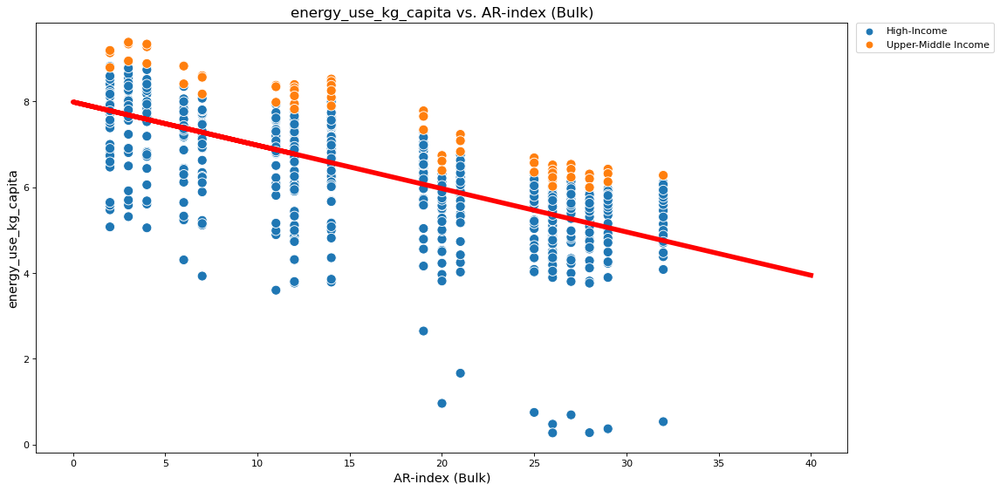

                             OLS Regression Results                             
Dep. Variable:     energy_use_kg_capita   R-squared:                       0.464
Model:                              OLS   Adj. R-squared:                  0.463
Method:                   Least Squares   F-statistic:                     454.0
Date:                  Sat, 17 Dec 2022   Prob (F-statistic):           5.06e-73
Time:                          20:37:36   Log-Likelihood:                -755.43
No. Observations:                   526   AIC:                             1515.
Df Residuals:                       524   BIC:                             1523.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             7.9841  

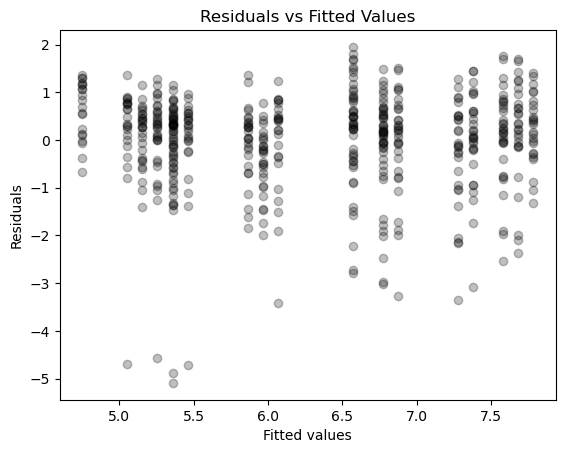

Residuals-- checking normality


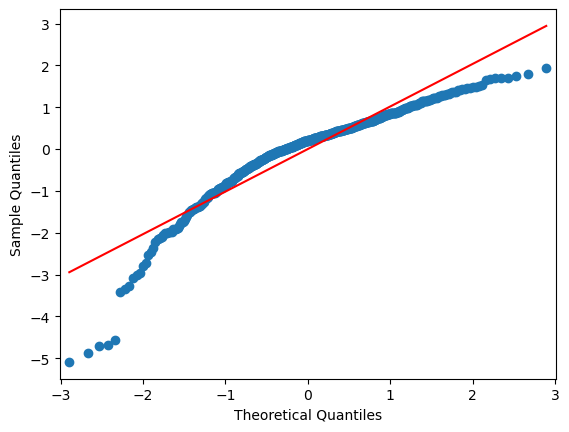

Residuals are not normal
renewable_output vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1694926684.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1694926684.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


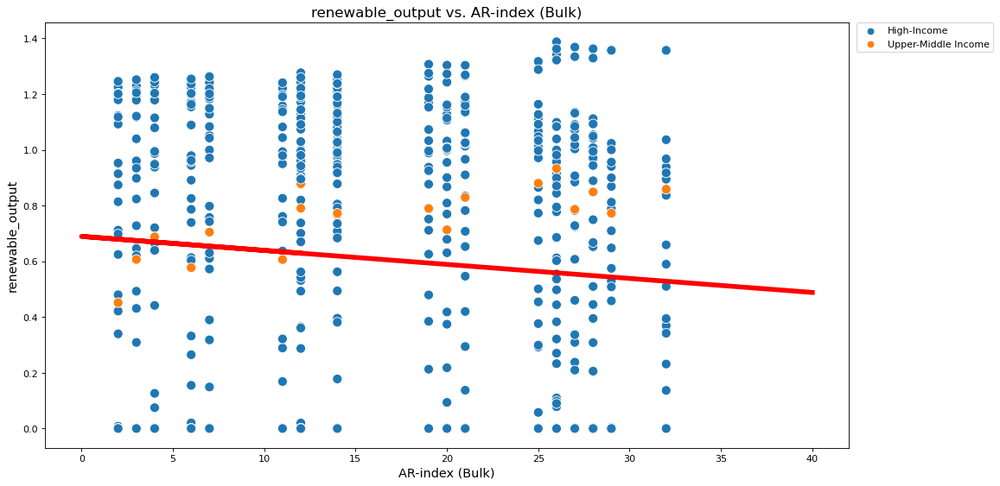

                            OLS Regression Results                            
Dep. Variable:       renewable_output   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     5.084
Date:                Sat, 17 Dec 2022   Prob (F-statistic):             0.0246
Time:                        20:37:37   Log-Likelihood:                -366.92
No. Observations:                 530   AIC:                             737.8
Df Residuals:                     528   BIC:                             746.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.6893      0.043     16.115

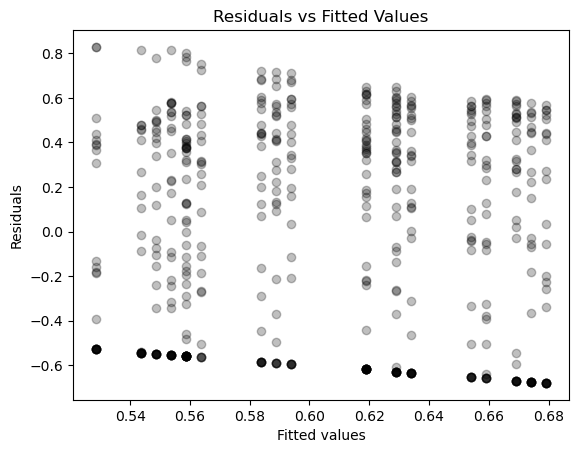

Residuals-- checking normality


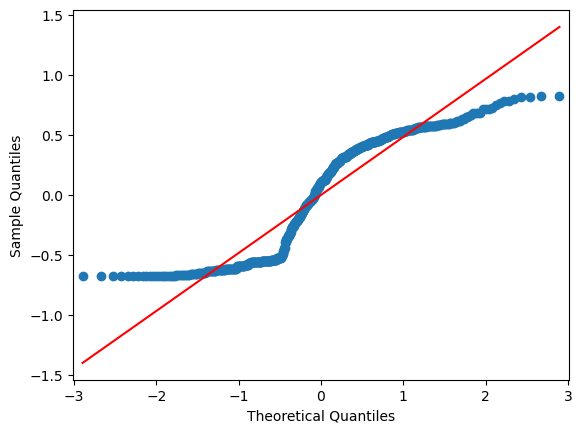

Residuals are not normal
renewable_comsumption vs ar_index_bulk


C:\Users\maham\AppData\Local\Temp\ipykernel_23060\1694926684.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)


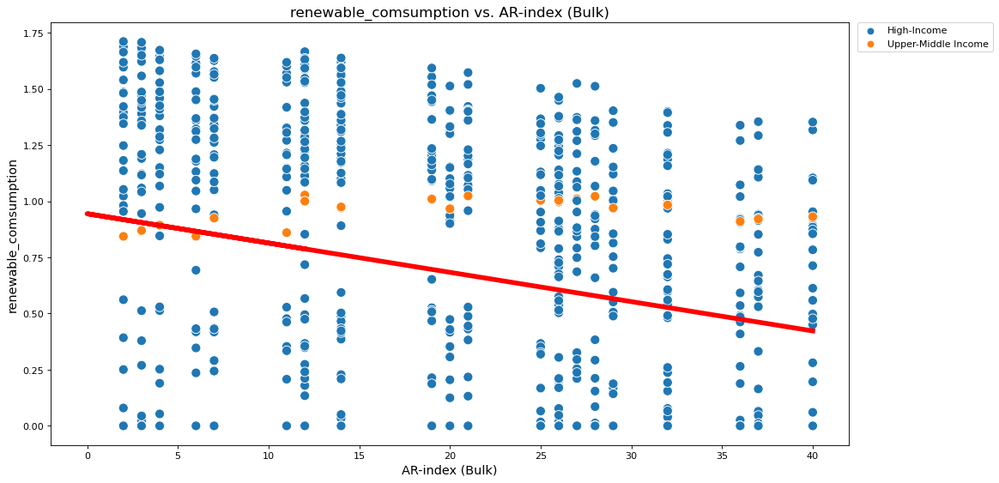

                              OLS Regression Results                             
Dep. Variable:     renewable_comsumption   R-squared:                       0.067
Model:                               OLS   Adj. R-squared:                  0.066
Method:                    Least Squares   F-statistic:                     45.67
Date:                   Sat, 17 Dec 2022   Prob (F-statistic):           3.16e-11
Time:                           20:37:37   Log-Likelihood:                -524.21
No. Observations:                    637   AIC:                             1052.
Df Residuals:                        635   BIC:                             1061.
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           

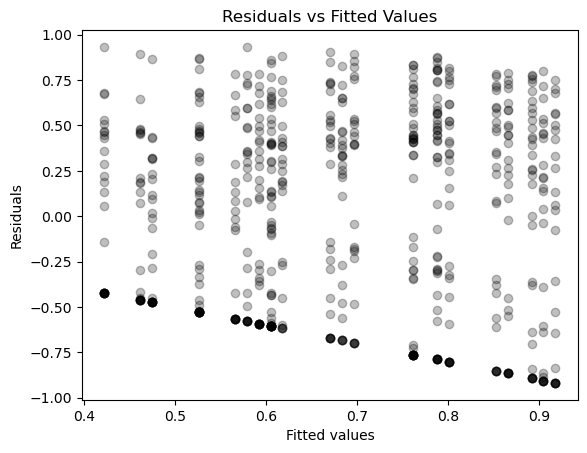

Residuals-- checking normality


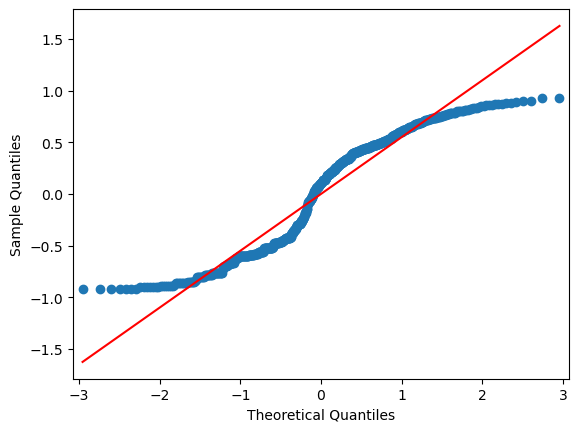

Residuals are not normal
Significant regression for:  [[], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], 'renewable_output', 'renewable_comsumption']

Not significant regression for:  ['cooking', 'rural_cooking', 'urban_cooking', 'electricy', 'rural_electricy', 'urban_electricy', 'coal', 'oil_gas_coal', [], 'fossil_fual_comsumption', [], []]

Residuals are not normal when the following indicators are plotted against AR-index [[], [], [], [], [], [], [], [], 'energy_use_kg_capita', [], 'renewable_output', 'renewable_comsumption']


In [406]:
indicators = data.columns.tolist()[5:17]
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]
    

    sig, not_sig, resids_not_normal = linear_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i)
    significant.append(sig)
    not_significant.append(not_sig)
    resid_not_norm_y.append(resids_not_normal)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

In [407]:
if len(significant) - len(resid_not_norm_y) == 0:
    print("Residuals are not normal for any of the significant regressions")

Residuals are not normal for any of the significant regressions


### Storing results in a data frame

In [408]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,energy_use_kg_capita,Yes
1,AR-index,renewable_output,Yes
2,AR-index,renewable_comsumption,Yes
3,AR-index,cooking,No
4,AR-index,rural_cooking,No
5,AR-index,urban_cooking,No
6,AR-index,electricy,No
7,AR-index,rural_electricy,No
8,AR-index,urban_electricy,No
9,AR-index,coal,No


## Quantile Regressions

### - log_2_years

In [409]:
# indicators = data.columns.tolist()[5:17] #needs to be changed according to df
# significant = []
# not_significant = []
# resid_not_norm_y = []

# for i in indicators:
#     temp_df = data[['Year', 'Country Name', '2 years window', 'log_2_Years', 'Economy Level',i]]
#     temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
#     x_2_yrs_log = temp_df['log_2_Years']
#     y_ind = temp_df[i]
    

#     sig, not_sig, resids_not_normal = quantile_regression_plot(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i, 0.5)
#     significant.append(sig)
#     not_significant.append(not_sig)
#     resid_not_norm_y.append(resids_not_normal)

# print('Significant regression for: ',significant)
# print()
# print('Not significant regression for: ',not_significant)
# print()
# print('Residuals are not normal when the following indicators are plotted against log(2 years)', resid_not_norm_y)









energy_use_kg_capita vs log_2_Years


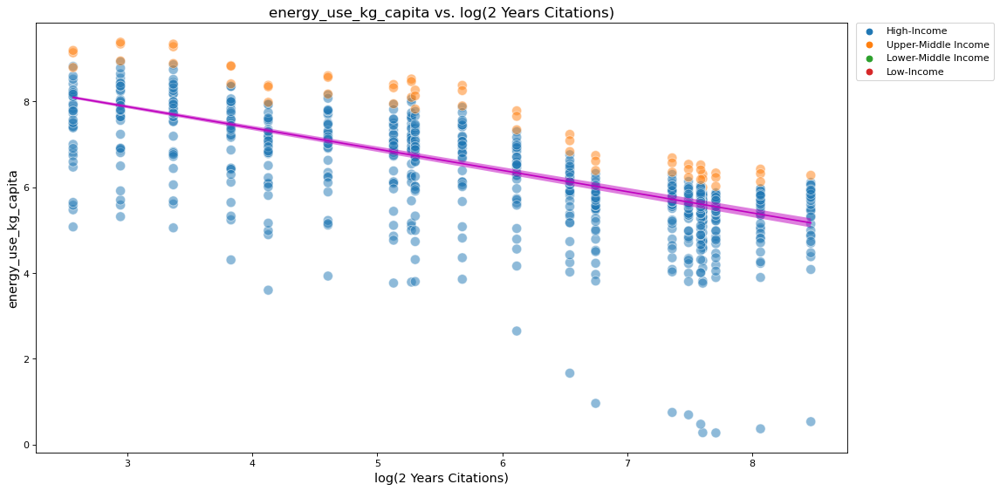

Average validation MSE over 5 folds:  1.0927245542050295

                          QuantReg Regression Results                           
Dep. Variable:     energy_use_kg_capita   Pseudo R-squared:               0.3342
Model:                         QuantReg   Bandwidth:                      0.4041
Method:                   Least Squares   Sparsity:                        1.761
Date:                  Sat, 17 Dec 2022   No. Observations:                  756
Time:                          20:37:39   Df Residuals:                      754
                                          Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       9.3604      0.110     84.988      0.000       9.144       9.577
log_2_Years    -0.4952      0.018    -27.313      0.000      -0.531      -0.460



renewable_output vs log_2_Years


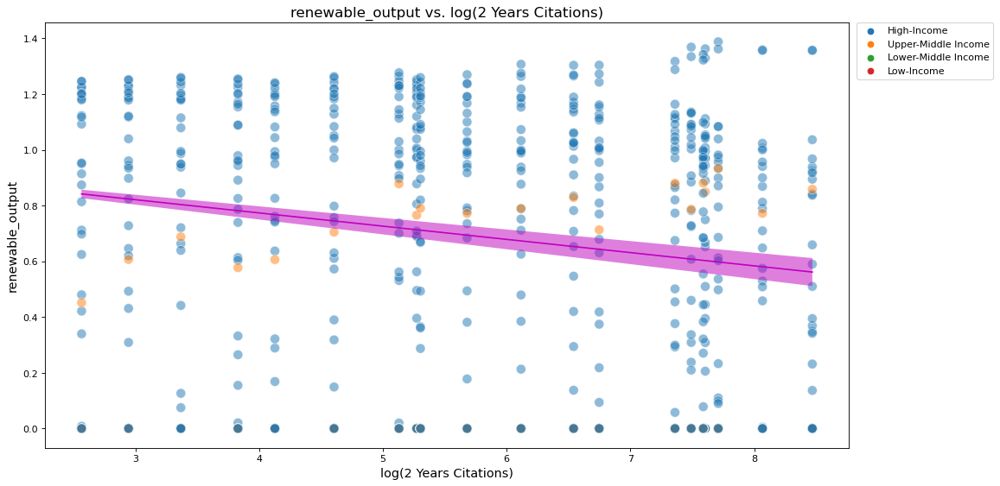

Average validation MSE over 5 folds:  0.24957005057334145

                         QuantReg Regression Results                          
Dep. Variable:       renewable_output   Pseudo R-squared:             0.007324
Model:                       QuantReg   Bandwidth:                      0.2640
Method:                 Least Squares   Sparsity:                        2.232
Date:                Sat, 17 Dec 2022   No. Observations:                  760
Time:                        20:37:40   Df Residuals:                      758
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.9634      0.139      6.926      0.000       0.690       1.236
log_2_Years    -0.0475      0.023     -2.078      0.038      -0.092      -0.003


renewable_comsumption vs log_2_Years


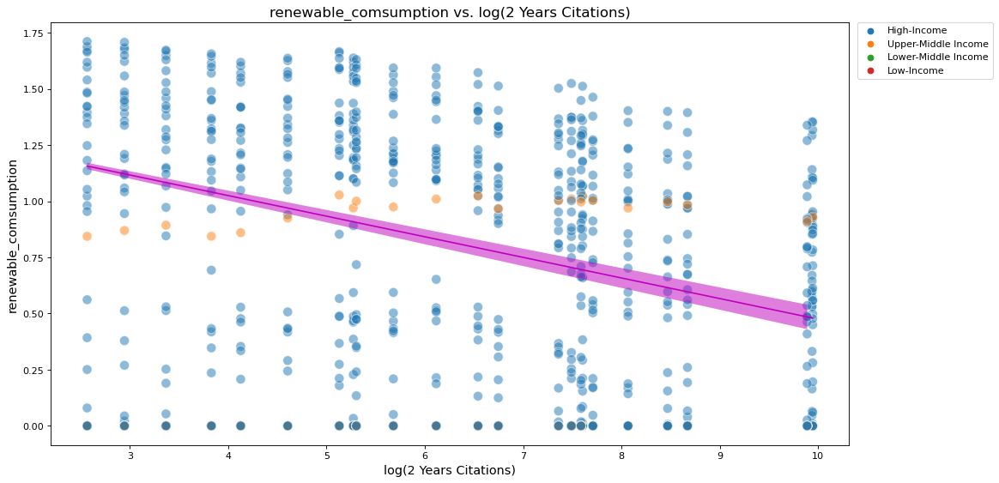

Average validation MSE over 5 folds:  0.3267801351382232

                           QuantReg Regression Results                           
Dep. Variable:     renewable_comsumption   Pseudo R-squared:              0.03867
Model:                          QuantReg   Bandwidth:                      0.2885
Method:                    Least Squares   Sparsity:                        2.367
Date:                   Sat, 17 Dec 2022   No. Observations:                  912
Time:                           20:37:40   Df Residuals:                      910
                                           Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       1.3920      0.124     11.261      0.000       1.149       1.635
log_2_Years    -0.0917      0.018     -5.050      0.000      -0.127      -0.056


Significant regression for:  [[], [], [], [], 

In [410]:
warnings.filterwarnings("ignore")
indicators = data.columns.tolist()[5:17] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', '2 years window', 'log_2_Years', 'Economy Level',i]]
    temp_df['log_2_Years'] = temp_df['log_2_Years'].astype(float)
    
    x_2_yrs_log = temp_df['log_2_Years']
    y_ind = temp_df[i]

    sig, not_sig = QR_cv_with_CI(x_2_yrs_log, y_ind, 'log_2_Years', i, temp_df, 'log(2 Years Citations)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
warnings.filterwarnings("default")

### Storing results in a data frame

In [411]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('Yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('log_2_years') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,log_2_years,energy_use_kg_capita,Yes
1,log_2_years,renewable_output,Yes
2,log_2_years,renewable_comsumption,Yes
3,log_2_years,cooking,No
4,log_2_years,rural_cooking,No
5,log_2_years,urban_cooking,No
6,log_2_years,electricy,No
7,log_2_years,rural_electricy,No
8,log_2_years,urban_electricy,No
9,log_2_years,coal,No


In [412]:
##presentation quality plots

### - AR-index









energy_use_kg_capita vs ar_index_bulk


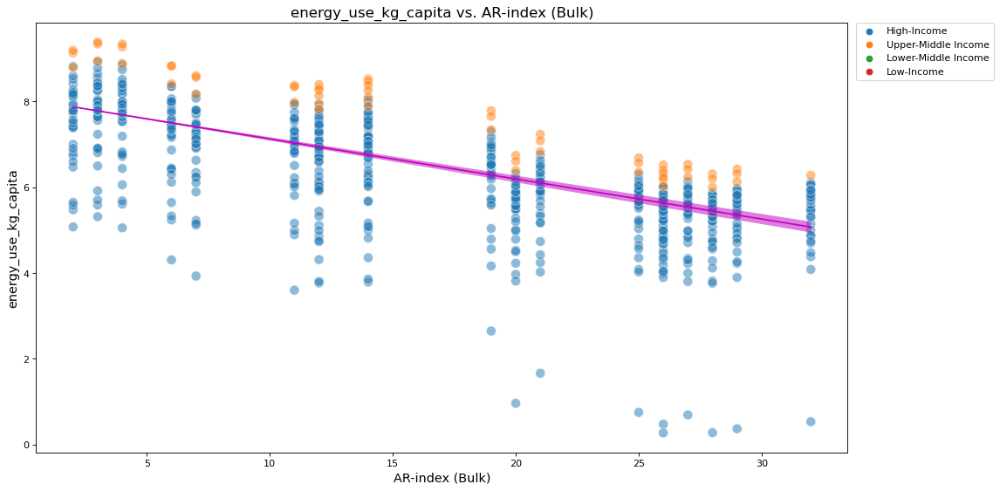

Average validation MSE over 5 folds:  1.0932046032184273

                          QuantReg Regression Results                           
Dep. Variable:     energy_use_kg_capita   Pseudo R-squared:               0.3359
Model:                         QuantReg   Bandwidth:                      0.3996
Method:                   Least Squares   Sparsity:                        1.742
Date:                  Sat, 17 Dec 2022   No. Observations:                  756
Time:                          20:37:42   Df Residuals:                      754
                                          Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         8.0579      0.065    123.456      0.000       7.930       8.186
ar_index_bulk    -0.0934      0.003    -27.540      0.000      -0.100      -0.087



renewable_output vs ar_index_bulk


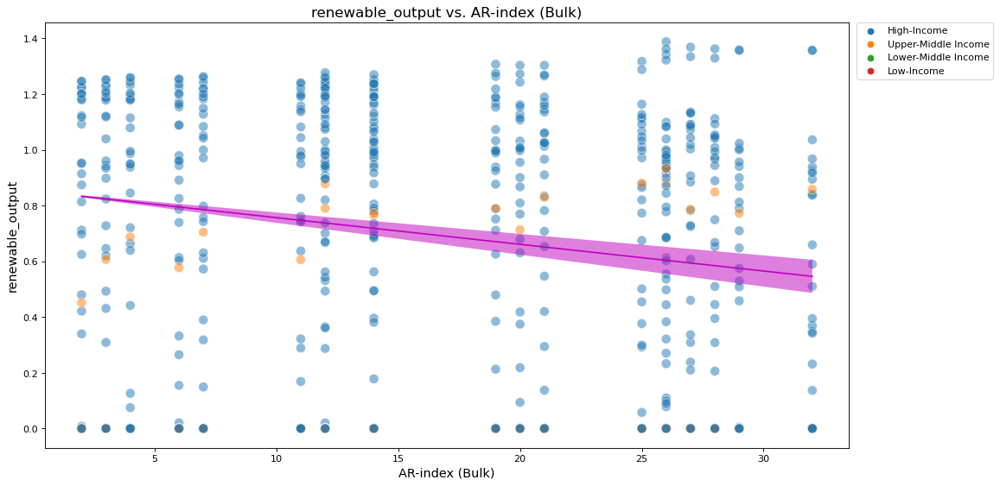

Average validation MSE over 5 folds:  0.2493326584818755

                         QuantReg Regression Results                          
Dep. Variable:       renewable_output   Pseudo R-squared:             0.008508
Model:                       QuantReg   Bandwidth:                      0.2640
Method:                 Least Squares   Sparsity:                        2.209
Date:                Sat, 17 Dec 2022   No. Observations:                  760
Time:                        20:37:42   Df Residuals:                      758
                                        Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.8524      0.083     10.324      0.000       0.690       1.014
ar_index_bulk    -0.0096      0.004     -2.242      0.025      -0.018      -0.001


renewable_comsumption vs ar_index_bulk


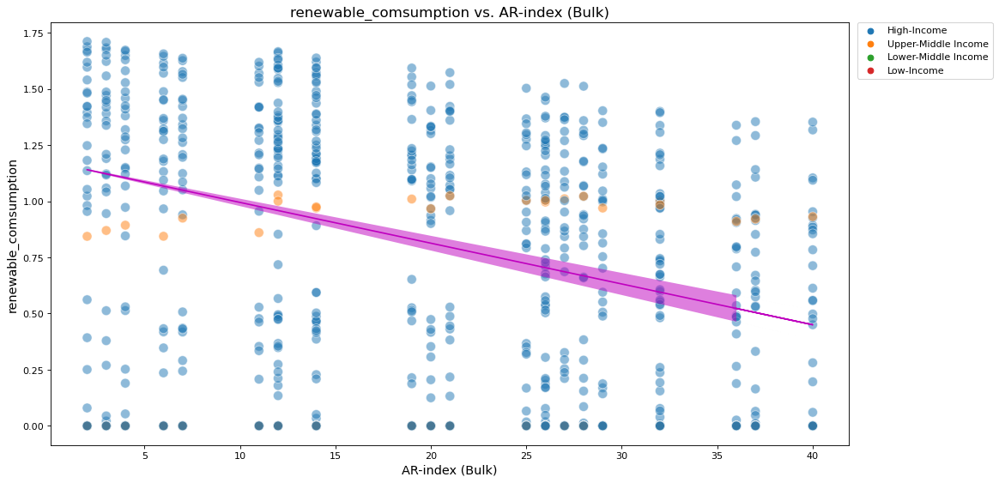

Average validation MSE over 5 folds:  0.3276088048639777

                           QuantReg Regression Results                           
Dep. Variable:     renewable_comsumption   Pseudo R-squared:              0.03936
Model:                          QuantReg   Bandwidth:                      0.2885
Method:                    Least Squares   Sparsity:                        2.255
Date:                   Sat, 17 Dec 2022   No. Observations:                  912
Time:                           20:37:43   Df Residuals:                      910
                                           Df Model:                            1
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.1765      0.076     15.381      0.000       1.026       1.327
ar_index_bulk    -0.0182      0.003     -5.475      0.000      -0.025      -0.012


Significant regression for:  [[], [], 

In [413]:
warnings.filterwarnings("ignore")
indicators = data.columns.tolist()[5:17] #needs to be changed according to df
significant = []
not_significant = []
resid_not_norm_y = []

for i in indicators:
    temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
    temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
    ar_ind_bulk = temp_df['ar_index_bulk']
    y_ind = temp_df[i]

    sig, not_sig = QR_cv_with_CI(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i, 0.5)
    significant.append(sig)
    not_significant.append(not_sig)

print('Significant regression for: ',significant)
print()
print('Not significant regression for: ',not_significant)
print()
warnings.filterwarnings("default")

In [414]:
# indicators = data.columns.tolist()[5:17]
# significant = []
# not_significant = []
# resid_not_norm_y = []

# for i in indicators:
#     temp_df = data[['Year', 'Country Name', 'ar_index_bulk', 'Economy Level',i]]
#     temp_df['ar_index_bulk'] = temp_df['ar_index_bulk'].astype(int)
    
#     ar_ind_bulk = temp_df['ar_index_bulk']
#     y_ind = temp_df[i]
    

#     sig, not_sig, resids_not_normal = quantile_regression_plot(ar_ind_bulk, y_ind, 'ar_index_bulk', i, temp_df, 'AR-index (Bulk)', i, 0.5)
#     significant.append(sig)
#     not_significant.append(not_sig)
#     resid_not_norm_y.append(resids_not_normal)

# print('Significant regression for: ',significant)
# print()
# print('Not significant regression for: ',not_significant)
# print()
# print('Residuals are not normal when the following indicators are plotted against AR-index', resid_not_norm_y)

### Storing results in a data frame

In [415]:
significant_ind = [value for value in significant if value != []] 
val = len(significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('yes') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('NA') 

models_sig = pd.DataFrame(list(zip(predictor, significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])


not_significant_ind = [value for value in not_significant if value != []]
val = len(not_significant_ind)

predictor = []
for i in range(val):
   predictor.append('AR-index') 


is_significant = []
for i in range(val):
   is_significant.append('No') 

# is_not_significant = []
# for i in range(val):
#    is_not_significant.append('yes') 

models_not_sig = pd.DataFrame(list(zip(predictor, not_significant_ind, is_significant)),
               columns =['predictor','indicator', 'is_significant'])

models = pd.concat([models_sig, models_not_sig],axis=0,ignore_index=True)
models

,predictor,indicator,is_significant
0,AR-index,energy_use_kg_capita,yes
1,AR-index,renewable_output,yes
2,AR-index,renewable_comsumption,yes
3,AR-index,cooking,No
4,AR-index,rural_cooking,No
5,AR-index,urban_cooking,No
6,AR-index,electricy,No
7,AR-index,rural_electricy,No
8,AR-index,urban_electricy,No
9,AR-index,coal,No
